# <a id='toc1_'></a>[Baseline models for San José](#toc0_)

In [1]:
import pandas as pd
import sys
import numpy as np

sys.path.append('../../models')

from model import Model

In [2]:
import pandas as pd
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay, r2_score, mean_absolute_error, root_mean_squared_error, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelBinarizer
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
import xgboost as xgb
from sklearn.preprocessing import OrdinalEncoder
import numpy as np
from sklearn.preprocessing import LabelBinarizer, label_binarize
from sklearn.model_selection import GridSearchCV, PredefinedSplit, TunedThresholdClassifierCV
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelBinarizer, LabelEncoder
import joblib
from xgboost import XGBRegressor
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import RFECV
from skopt import BayesSearchCV
# from tsbootstrap import CircularBlockBootstrap
from mapie.regression import SplitConformalRegressor, CrossConformalRegressor

In [3]:
df = pd.read_csv('../../data/clean/full_data.csv')

In [4]:
def compare_rr(df, canton, momento):
    model= Model(df[df["week_canton"].str.contains(canton)])
    X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model.partition_rr(momento = momento)
    # print(f"linear for {canton} at {momento}")
    # reg = model.linear_reg("rr", momento, canton, X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    print(f"RF for {canton} at {momento}")
    reg = model.rf_reg("rr", momento, canton, X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"XGB for {canton} at {momento}")
    # reg = model.xgb_reg("rr", momento, canton, X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H1 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "reg", "reg", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H2 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "reg", "rf", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H3 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "reg", "xgb", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H4 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "rf", "reg", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H5 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "rf", "rf", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H6 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "rf", "xgb", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H7 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "xgb", "reg", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H8 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "xgb", "rf", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H9 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "xgb", "xgb", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)


In [5]:
def compare_cases(df, canton, momento):
    model= Model(df[df["week_canton"].str.contains(canton)])
    X_combined, y_combined, X_calib, y_calib, X_test, y_test, X_combined_scaled, X_calib_scaled, X_test_scaled, test, pds, epsilon= model.partition_cases(momento = momento)
    # print(f"linear for {canton} at {momento}")
    # reg = model.linear_reg("rr", momento, canton, X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    print(f"RF for {canton} at {momento}")
    reg = model.rf_reg("cases", momento, canton, X_combined, y_combined, X_calib, y_calib, X_test, y_test, X_combined_scaled, X_calib_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"XGB for {canton} at {momento}")
    # reg = model.xgb_reg("cases", momento, canton, X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H1 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "reg", "reg", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H2 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "reg", "rf", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H3 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "reg", "xgb", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H4 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "rf", "reg", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H5 for {canton} at {momento}")
    # reg = model.hybrid("cases", momento, canton, "rf", "rf", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H6 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "rf", "xgb", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H7 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "xgb", "reg", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H8 for {canton} at {momento}")
    # reg = model.hybrid("rr", momento, canton, "xgb", "rf", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)
    # print(f"H9 for {canton} at {momento}")
    # reg = model.hybrid("cases", momento, canton, "xgb", "xgb", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)


In [23]:
model201= Model(df[df["week_canton"].str.contains("201")])
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model201.partition_rr(momento = "inmediato")

In [24]:
rf = RandomForestRegressor(oob_score=True, random_state=42)

param_grid_rf = {
    'max_depth': [5, 6, 7, 8],
    'min_samples_split': [10, 50, 100],
    'ccp_alpha': [0, 1 /  10**5, 1 / 10**4, 1 / 10**3, 0.01, 0.1, 1, 10], 
    "criterion": ["squared_error", "absolute_error"]
}

grid_rf = GridSearchCV(
    estimator=rf, 
    param_grid=param_grid_rf, 
    cv=pds, 
    scoring='neg_mean_squared_error', 
    n_jobs=-1
)
grid_rf.fit(X_combined, y_combined)

best_rf = grid_rf.best_estimator_

In [25]:
mapie_reg = CrossConformalRegressor(
    estimator=best_rf,
    confidence_level=0.95,
    cv = pds
)

mapie_reg.fit_conformalize(X_combined, y_combined)

y_pred_rf_cp, y_interval = mapie_reg.predict_interval(X_test)
y_pred_cp_train, y_interval_train = mapie_reg.predict_interval(X_combined)

lower_bound = np.exp(y_interval[:, 0, 0]) - epsilon
upper_bound = np.exp(y_interval[:, 1, 0]) - epsilon


In [26]:
y_pred_rf = np.exp(best_rf.predict(X_test)) - epsilon
y_test = np.exp(y_test) - epsilon

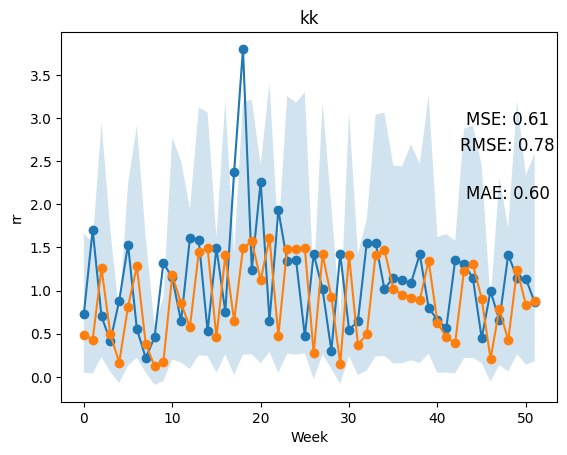

In [27]:
fig, ax = plt.subplots()
ax.plot(range(len(y_test)), y_test, label='Reales', marker='o')
ax.plot(range(len(y_pred_rf)), y_pred_rf, label='Predichos', marker='o')
ax.fill_between(x = range(len(y_pred_rf)), y1 = lower_bound, y2 = upper_bound, alpha = 0.2)
ax.set_xlabel('Week')
ax.set_ylabel(f'rr')

rmse = root_mean_squared_error(y_test, y_pred_rf)
mse = rmse ** 2
mae = mean_absolute_error(y_test, y_pred_rf)

ax.text(0.9, 0.75, f'MSE: {mse:.2f}', transform=ax.transAxes, ha='center', fontsize=12)
ax.text(0.9, 0.68, f'RMSE: {rmse:.2f}', transform=ax.transAxes, ha='center', fontsize=12)
ax.text(0.9, 0.55, f'MAE: {mae:.2f}', transform=ax.transAxes, ha='center', fontsize=12)
ax.set_title(f"kk")
plt.show()

RF for 201 at inmediato


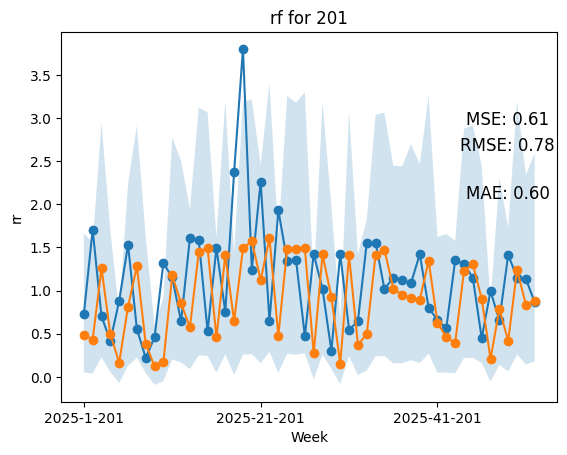

nrmse: 0.69

            RMSE train rf: 1.153
            MSE train rf: 1.33
                
RF for 603 at inmediato


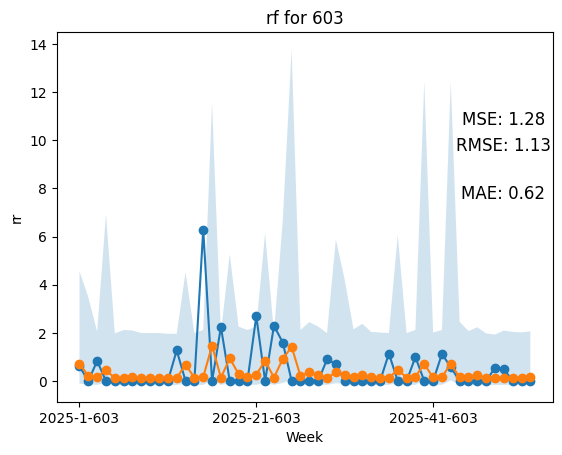

nrmse: 2.41

            RMSE train rf: 1.732
            MSE train rf: 3.0
                
RF for 501 at inmediato


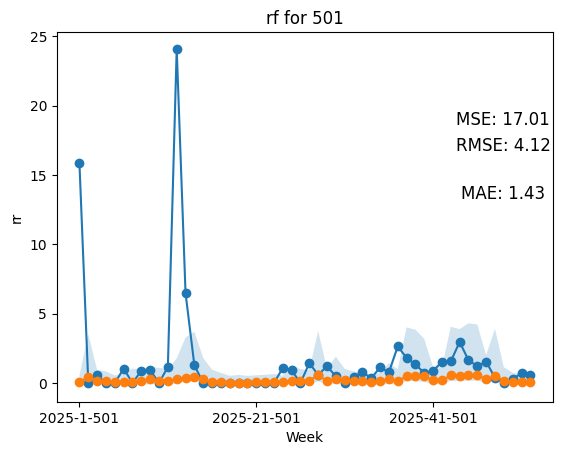

nrmse: 2.65

            RMSE train rf: 1.479
            MSE train rf: 2.188
                
RF for 701 at inmediato


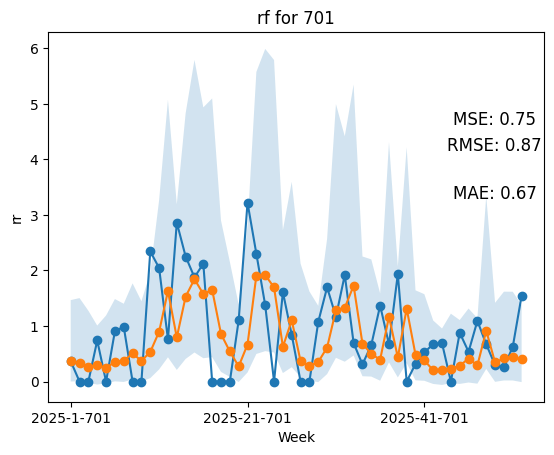

nrmse: 0.95

            RMSE train rf: 1.44
            MSE train rf: 2.074
                
RF for 503 at inmediato


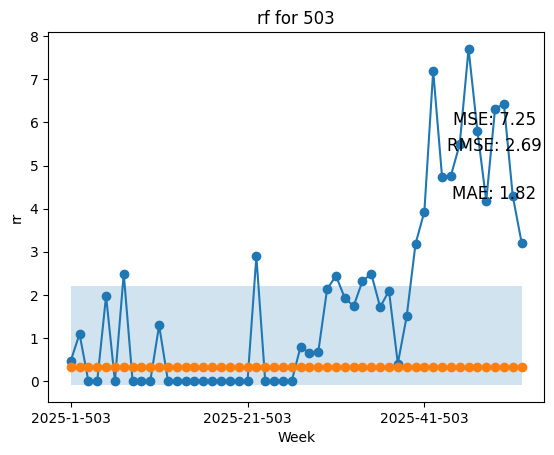

nrmse: 1.42

            RMSE train rf: 1.37
            MSE train rf: 1.878
                


In [5]:
# CON PCV
compare_rr(df, "201", "inmediato")
compare_rr(df, "603", "inmediato")
compare_rr(df, "501", "inmediato")
compare_rr(df, "701", "inmediato")
compare_rr(df, "503", "inmediato")

RF for 201 at inmediato


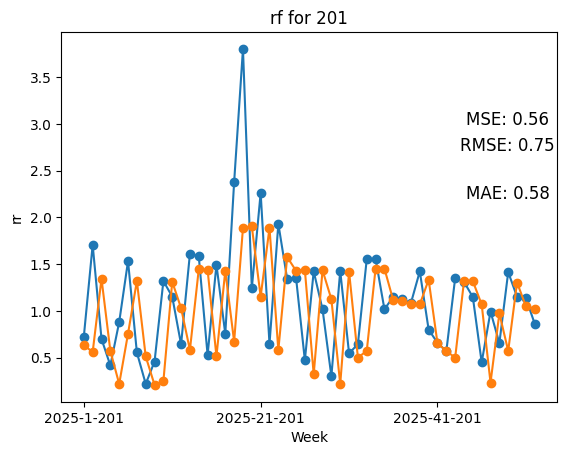

nrmse: 0.67

            RMSE train rf: 0.33
            MSE train rf: 0.109
                


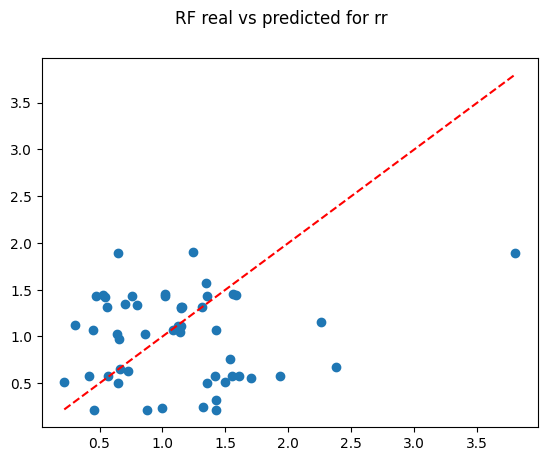

RF for 603 at inmediato


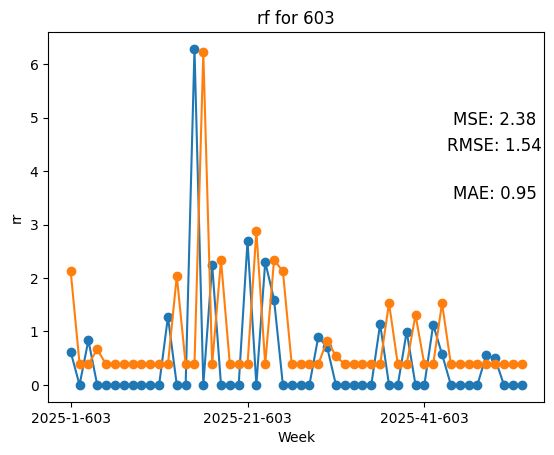

nrmse: 3.29

            RMSE train rf: 1.798
            MSE train rf: 3.232
                


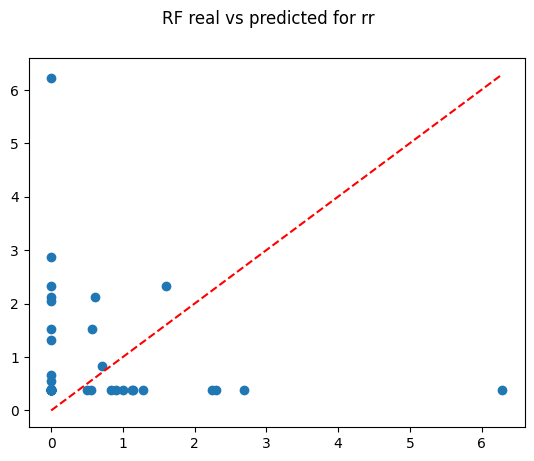

RF for 501 at inmediato


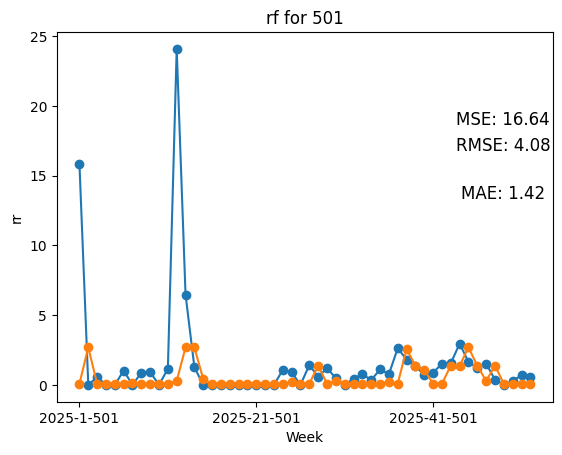

nrmse: 2.62

            RMSE train rf: 0.301
            MSE train rf: 0.09
                


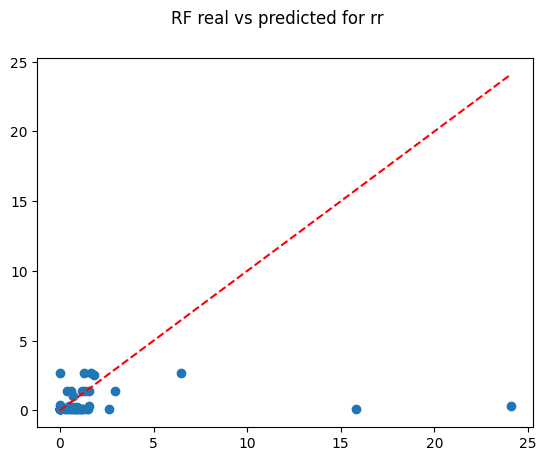

RF for 701 at inmediato


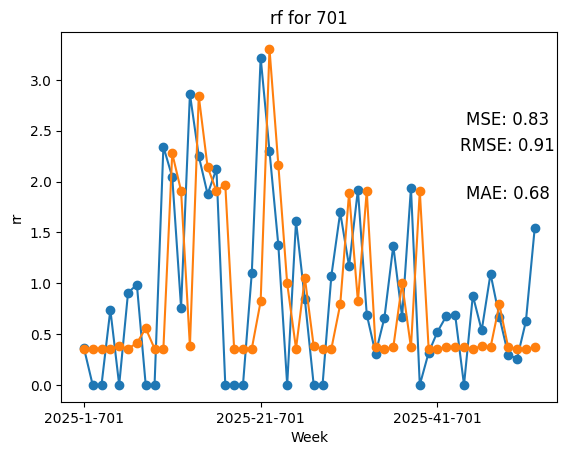

nrmse: 1.0

            RMSE train rf: 1.225
            MSE train rf: 1.5
                


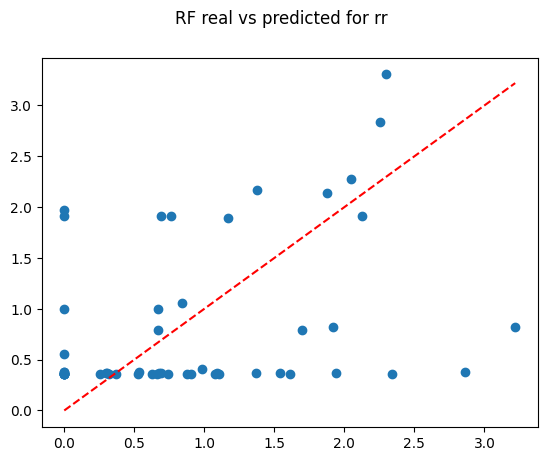

RF for 503 at inmediato


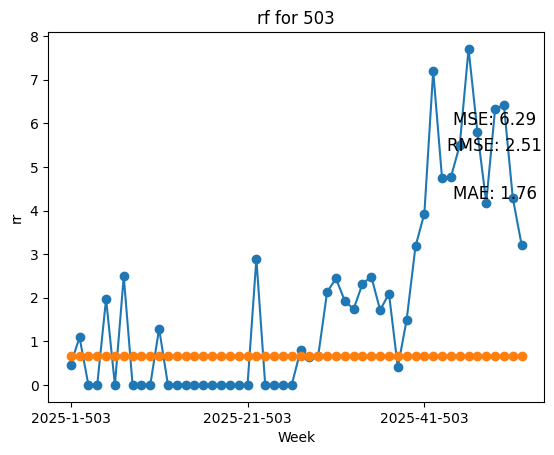

nrmse: 1.33

            RMSE train rf: 1.004
            MSE train rf: 1.009
                


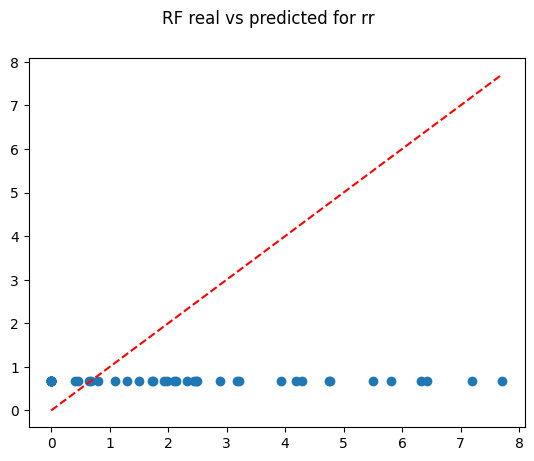

In [5]:
# CON V2025
compare_rr(df, "201", "inmediato")
compare_rr(df, "603", "inmediato")
compare_rr(df, "501", "inmediato")
compare_rr(df, "701", "inmediato")
compare_rr(df, "503", "inmediato")

linear for 201 at inmediato


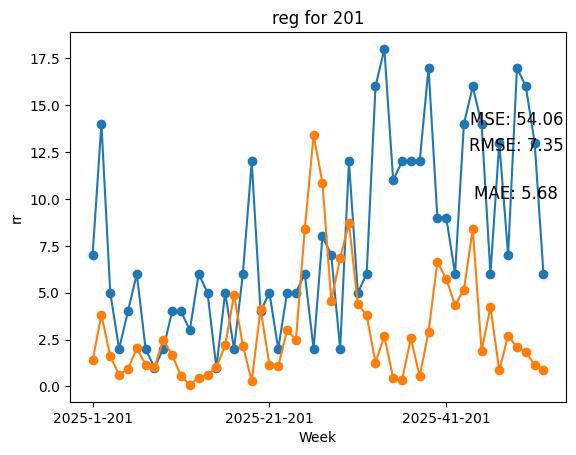

nrmse: 0.95

            RMSE train reg: 89.445
            MSE train reg: 8000.409
                


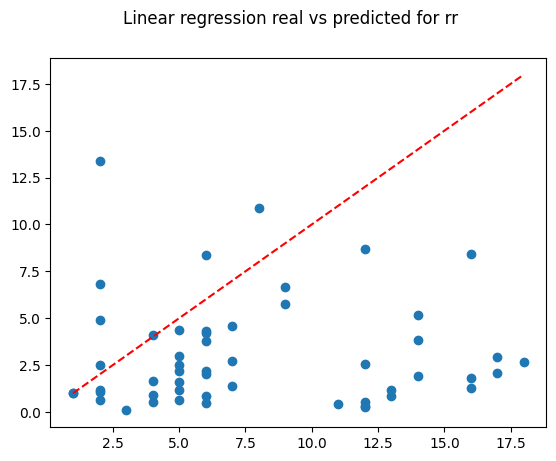

RF for 201 at inmediato


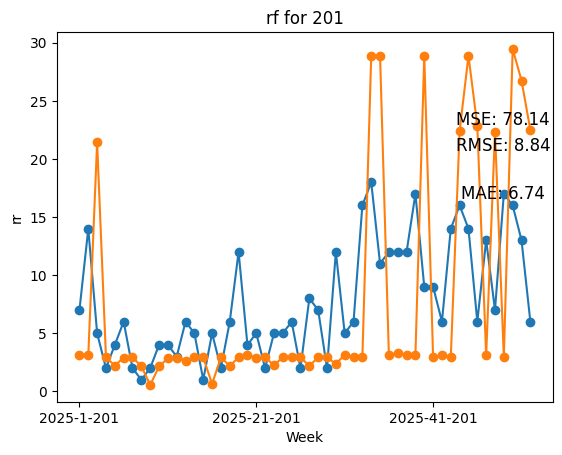

nrmse: 1.14

            RMSE train rf: 21.555
            MSE train rf: 464.617
                


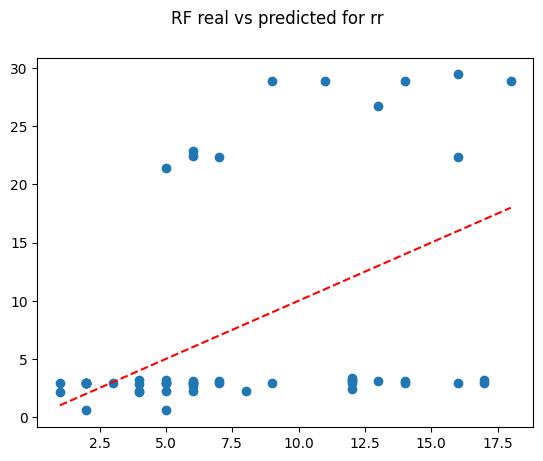

XGB for 201 at inmediato


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:13:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


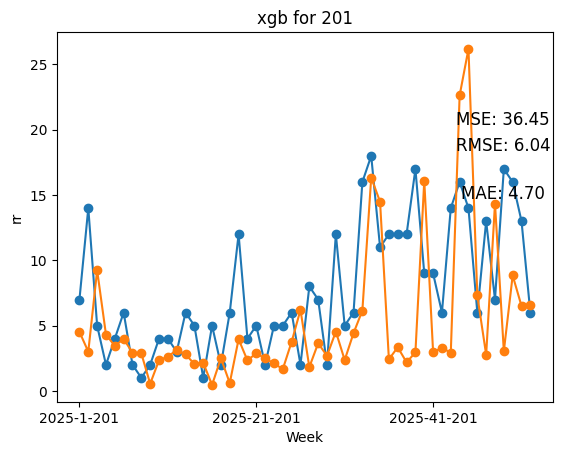

nrmse: 0.78

            RMSE train xgb: 0.025
            MSE train xgb: 0.001
                


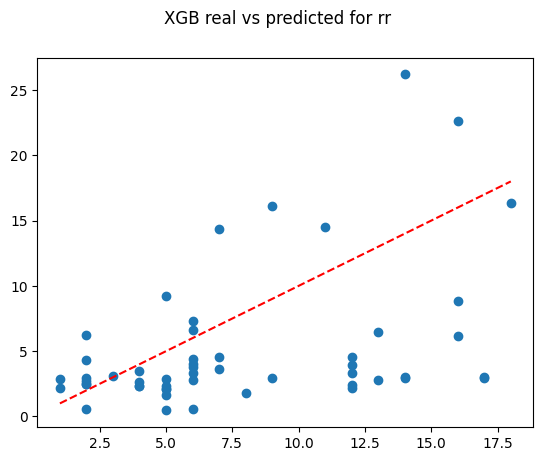

H1 for 201 at inmediato
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


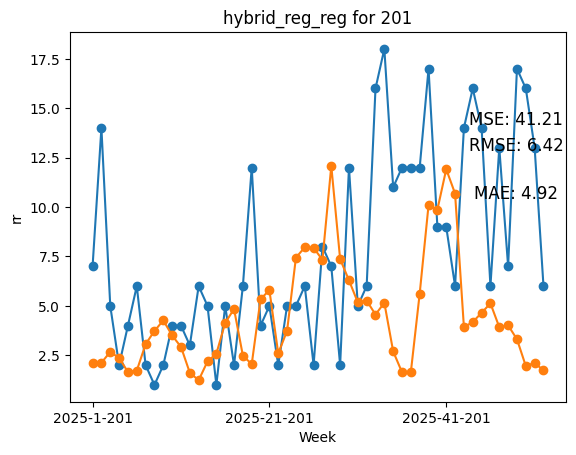

nrmse: 0.83
MSE test: 41.21
RMSE test: 6.419
RMSE train: 42.073
MSE train: 1770.116
H2 for 201 at inmediato
Only one class present in test set for classification. Skipping classification step.
Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


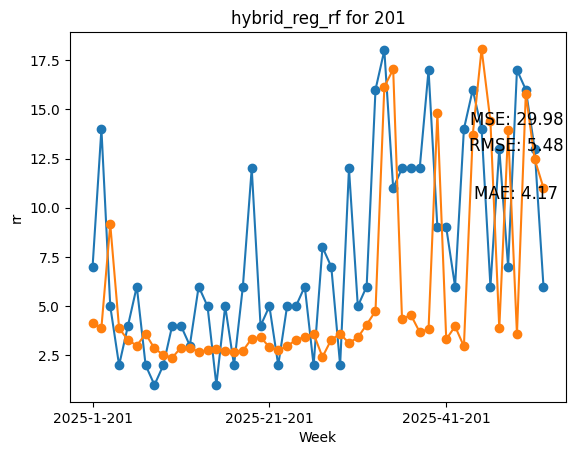

nrmse: 0.7
MSE test: 29.977
RMSE test: 5.475
RMSE train: 14.622
MSE train: 213.815
H3 for 201 at inmediato
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


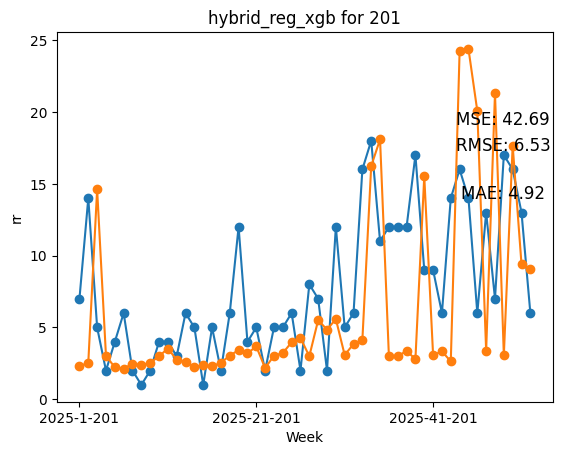

nrmse: 0.84
MSE test: 42.692
RMSE test: 6.534
RMSE train: 2.013
MSE train: 4.054
H4 for 201 at inmediato
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


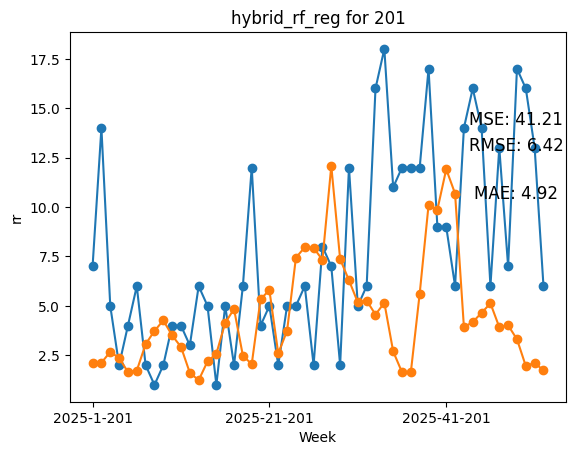

nrmse: 0.83
MSE test: 41.21
RMSE test: 6.419
RMSE train: 42.073
MSE train: 1770.116
H5 for 201 at inmediato
Only one class present in test set for classification. Skipping classification step.
Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


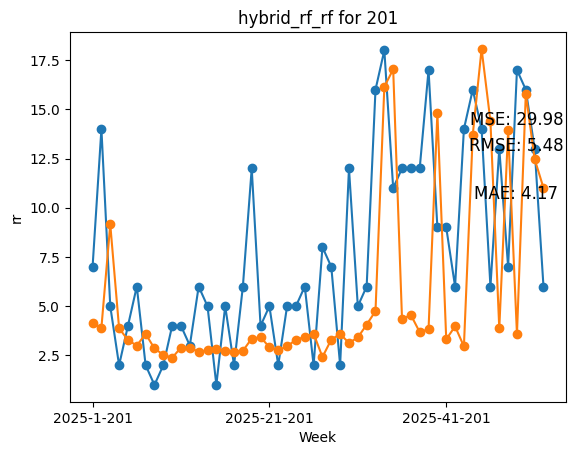

nrmse: 0.7
MSE test: 29.977
RMSE test: 5.475
RMSE train: 14.622
MSE train: 213.815
H6 for 201 at inmediato
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


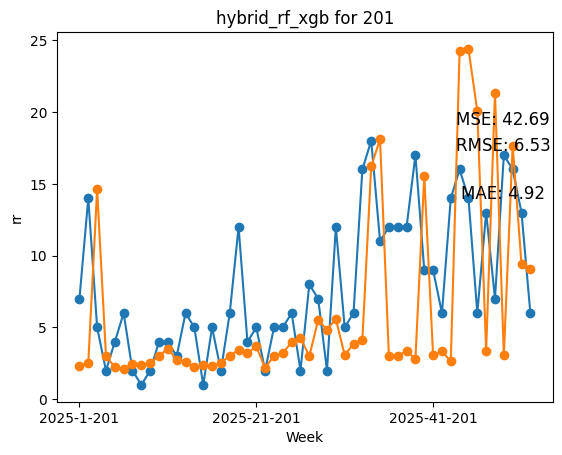

nrmse: 0.84
MSE test: 42.692
RMSE test: 6.534
RMSE train: 2.013
MSE train: 4.054
H7 for 201 at inmediato
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


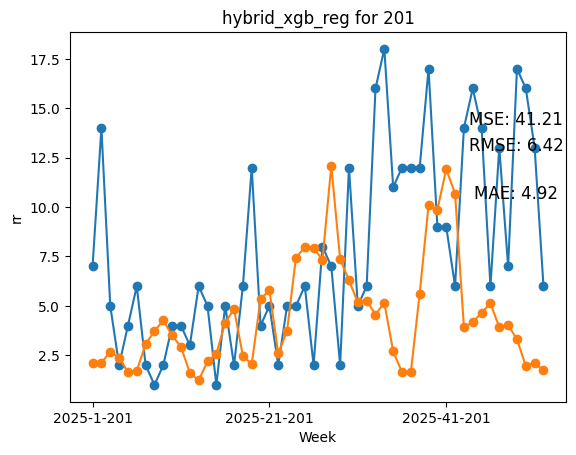

nrmse: 0.83
MSE test: 41.21
RMSE test: 6.419
RMSE train: 42.073
MSE train: 1770.116
H8 for 201 at inmediato
Only one class present in test set for classification. Skipping classification step.
Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


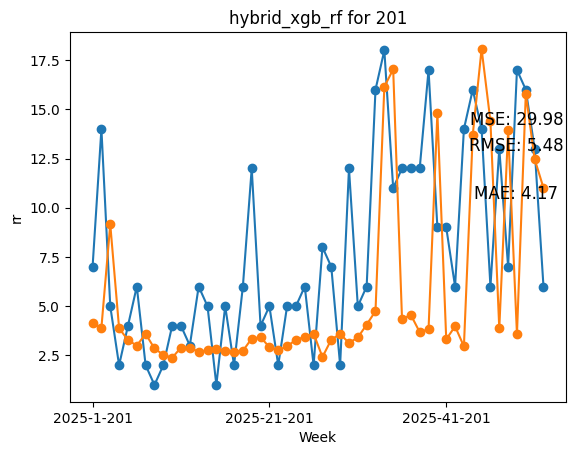

nrmse: 0.7
MSE test: 29.977
RMSE test: 5.475
RMSE train: 14.622
MSE train: 213.815
H9 for 201 at inmediato
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


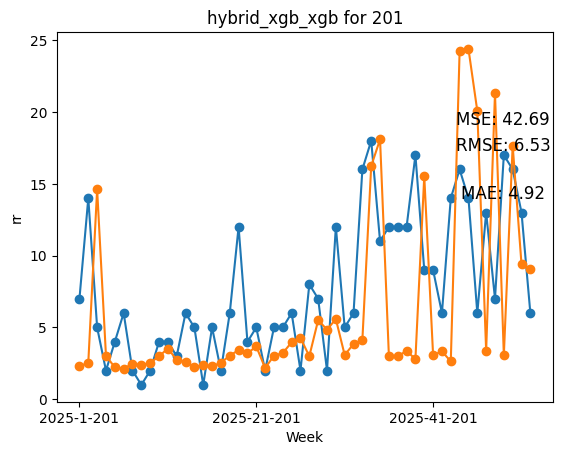

nrmse: 0.84
MSE test: 42.692
RMSE test: 6.534
RMSE train: 2.013
MSE train: 4.054
linear for 603 at inmediato


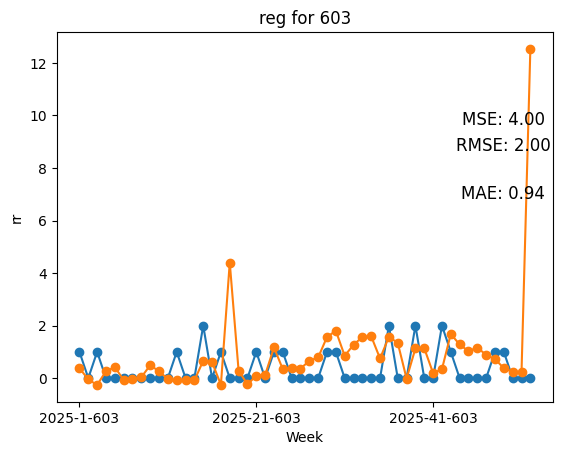

nrmse: 5.2

            RMSE train reg: 10.559
            MSE train reg: 111.484
                


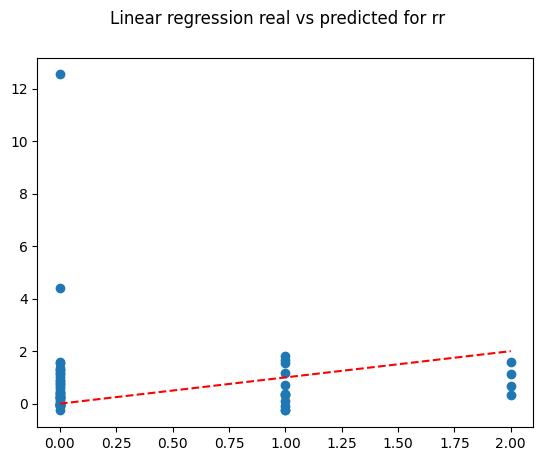

RF for 603 at inmediato


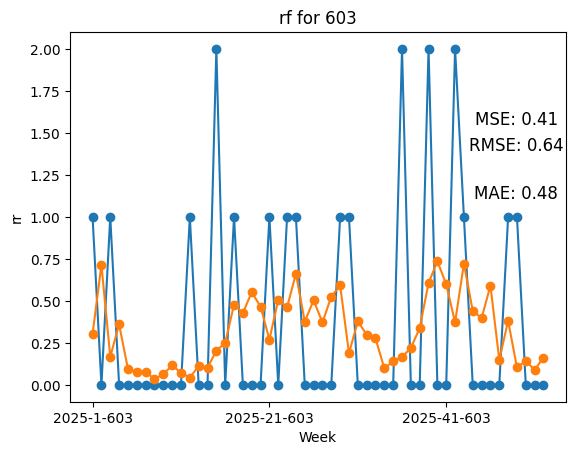

nrmse: 1.66

            RMSE train rf: 3.635
            MSE train rf: 13.216
                


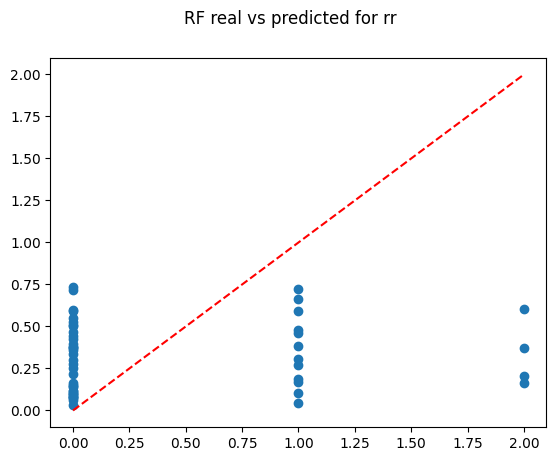

XGB for 603 at inmediato


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:14:35] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


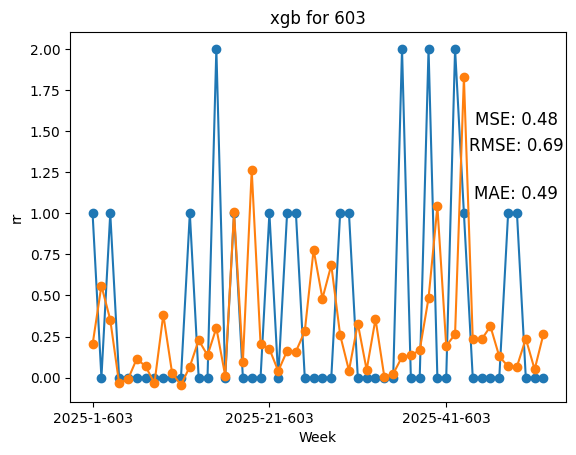

nrmse: 1.8

            RMSE train xgb: 0.004
            MSE train xgb: 0.0
                


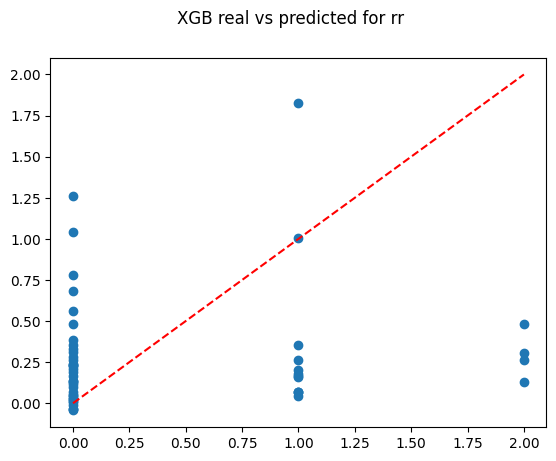

H1 for 603 at inmediato
              precision    recall  f1-score   support

           0       0.81      0.83      0.82        36
           1       0.60      0.56      0.58        16

    accuracy                           0.75        52
   macro avg       0.71      0.70      0.70        52
weighted avg       0.75      0.75      0.75        52

(52,)
(52, 108)


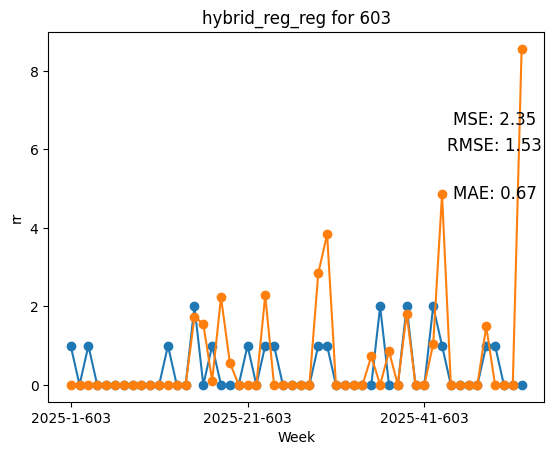

nrmse: 3.99
MSE test: 2.351
RMSE test: 1.533
RMSE train: 4.792
MSE train: 22.962
H2 for 603 at inmediato
              precision    recall  f1-score   support

           0       0.81      0.83      0.82        36
           1       0.60      0.56      0.58        16

    accuracy                           0.75        52
   macro avg       0.71      0.70      0.70        52
weighted avg       0.75      0.75      0.75        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


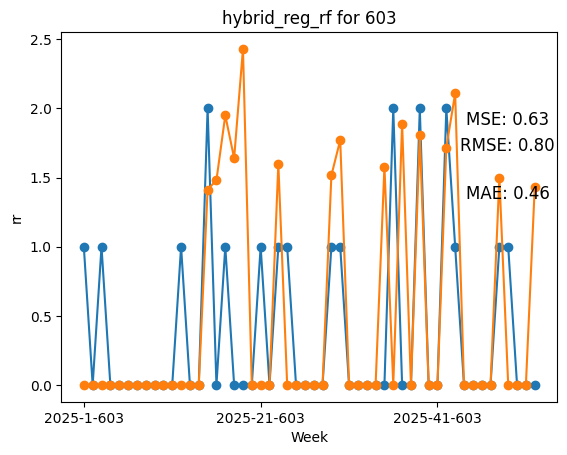

nrmse: 2.07
MSE test: 0.634
RMSE test: 0.796
RMSE train: 4.448
MSE train: 19.784
H3 for 603 at inmediato
              precision    recall  f1-score   support

           0       0.81      0.83      0.82        36
           1       0.60      0.56      0.58        16

    accuracy                           0.75        52
   macro avg       0.71      0.70      0.70        52
weighted avg       0.75      0.75      0.75        52

(52,)
(52, 108)


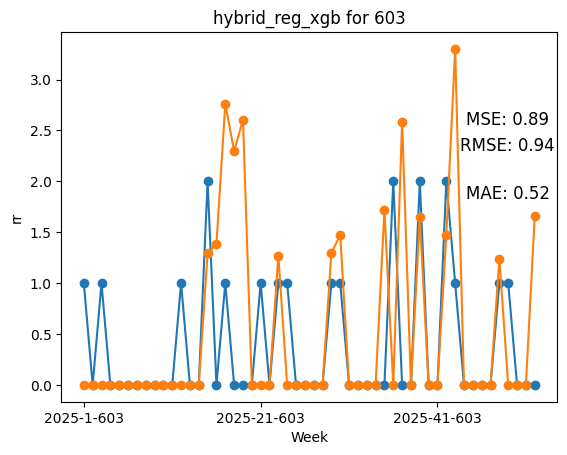

nrmse: 2.45
MSE test: 0.886
RMSE test: 0.941
RMSE train: 0.451
MSE train: 0.203
H4 for 603 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.74      0.69      0.71        36
           1       0.39      0.44      0.41        16

    accuracy                           0.62        52
   macro avg       0.56      0.57      0.56        52
weighted avg       0.63      0.62      0.62        52

(52,)
(52, 108)


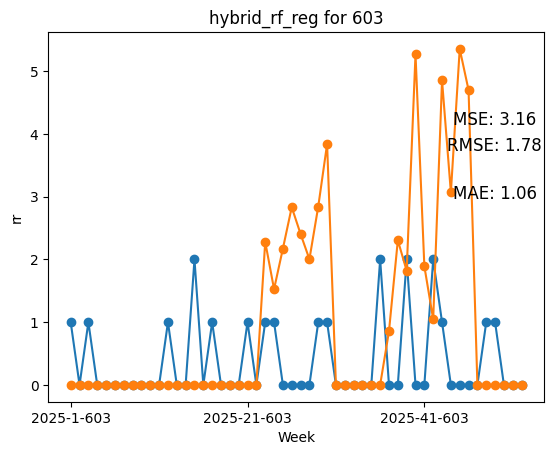

nrmse: 4.62
MSE test: 3.16
RMSE test: 1.778
RMSE train: 4.792
MSE train: 22.962
H5 for 603 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.74      0.69      0.71        36
           1       0.39      0.44      0.41        16

    accuracy                           0.62        52
   macro avg       0.56      0.57      0.56        52
weighted avg       0.63      0.62      0.62        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


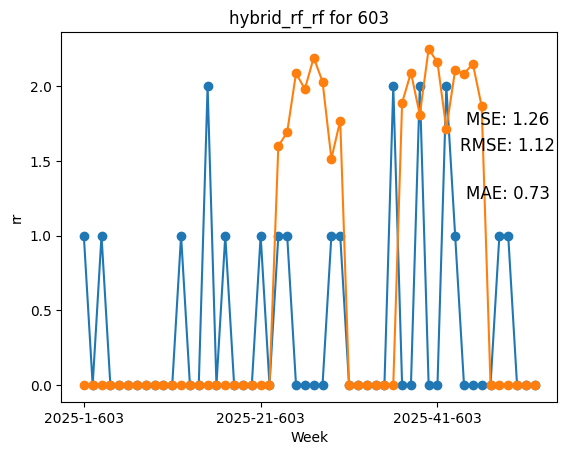

nrmse: 2.92
MSE test: 1.258
RMSE test: 1.122
RMSE train: 4.448
MSE train: 19.784
H6 for 603 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.74      0.69      0.71        36
           1       0.39      0.44      0.41        16

    accuracy                           0.62        52
   macro avg       0.56      0.57      0.56        52
weighted avg       0.63      0.62      0.62        52

(52,)
(52, 108)


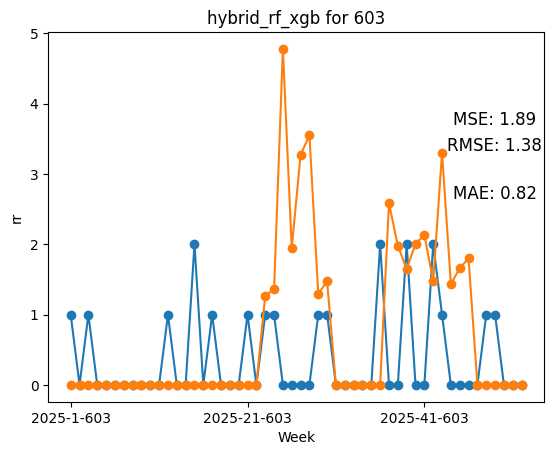

nrmse: 3.58
MSE test: 1.891
RMSE test: 1.375
RMSE train: 0.451
MSE train: 0.203
H7 for 603 at inmediato
              precision    recall  f1-score   support

           0       0.68      0.72      0.70        36
           1       0.29      0.25      0.27        16

    accuracy                           0.58        52
   macro avg       0.48      0.49      0.48        52
weighted avg       0.56      0.58      0.57        52

(52,)
(52, 108)


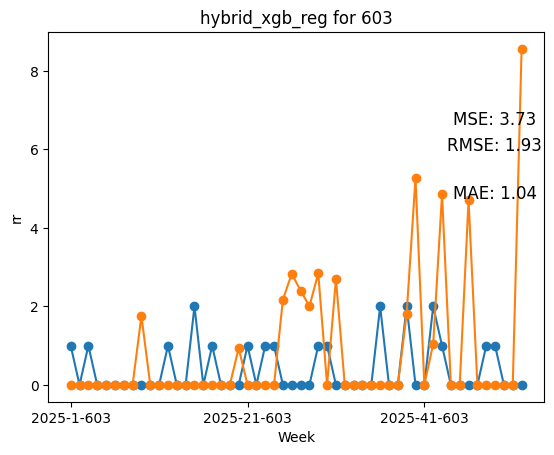

nrmse: 5.02
MSE test: 3.734
RMSE test: 1.932
RMSE train: 4.792
MSE train: 22.962
H8 for 603 at inmediato
              precision    recall  f1-score   support

           0       0.68      0.72      0.70        36
           1       0.29      0.25      0.27        16

    accuracy                           0.58        52
   macro avg       0.48      0.49      0.48        52
weighted avg       0.56      0.58      0.57        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


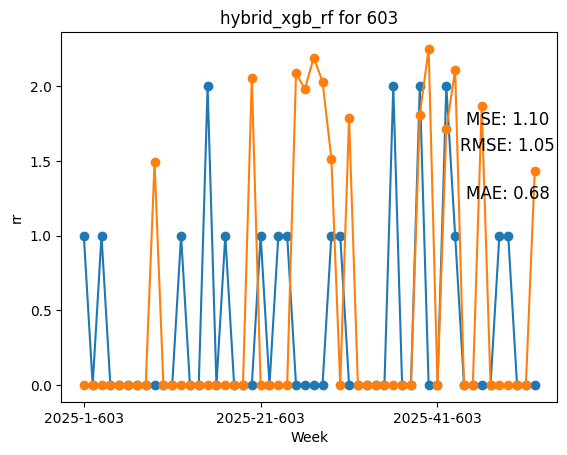

nrmse: 2.72
MSE test: 1.098
RMSE test: 1.048
RMSE train: 4.448
MSE train: 19.784
H9 for 603 at inmediato
              precision    recall  f1-score   support

           0       0.68      0.72      0.70        36
           1       0.29      0.25      0.27        16

    accuracy                           0.58        52
   macro avg       0.48      0.49      0.48        52
weighted avg       0.56      0.58      0.57        52

(52,)
(52, 108)


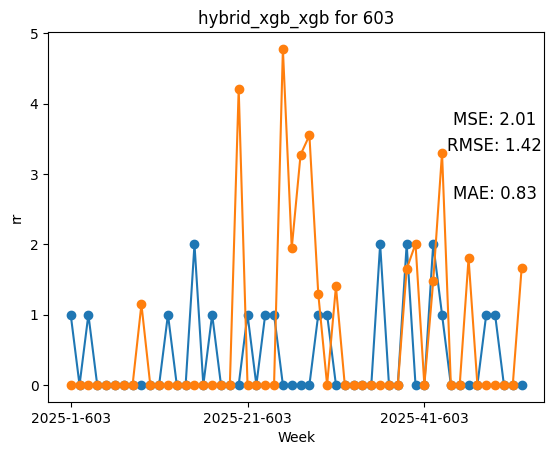

nrmse: 3.69
MSE test: 2.013
RMSE test: 1.419
RMSE train: 0.451
MSE train: 0.203
linear for 501 at inmediato


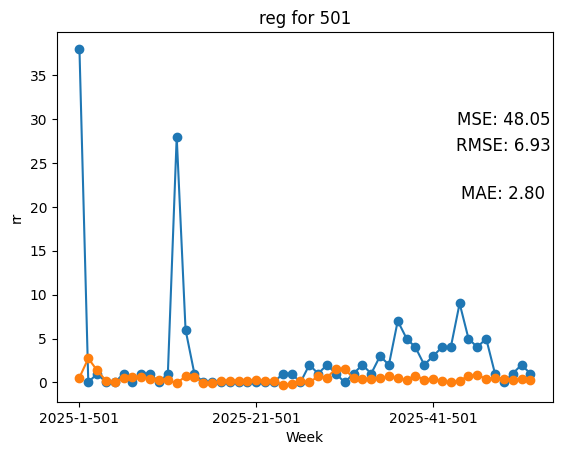

nrmse: 2.37

            RMSE train reg: 9.188
            MSE train reg: 84.423
                


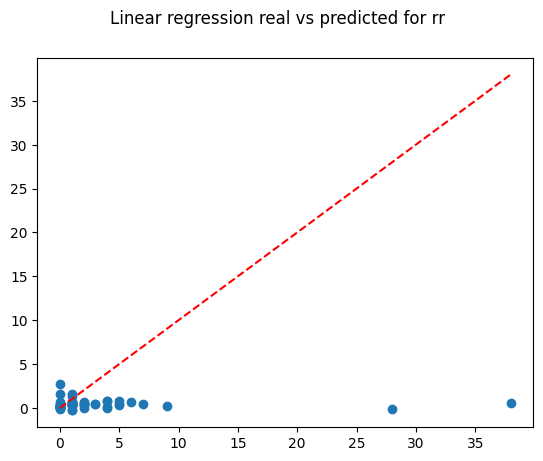

RF for 501 at inmediato


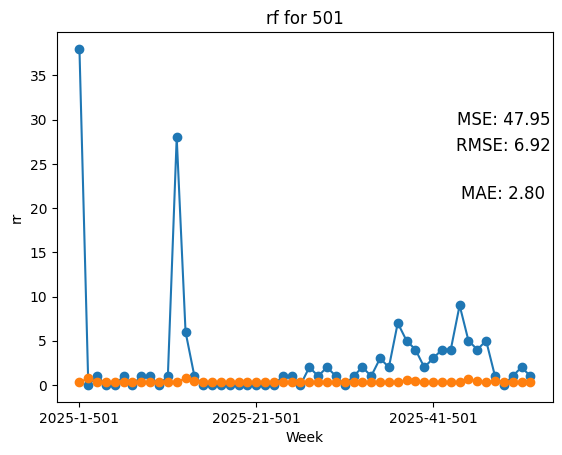

nrmse: 2.37

            RMSE train rf: 13.613
            MSE train rf: 185.326
                


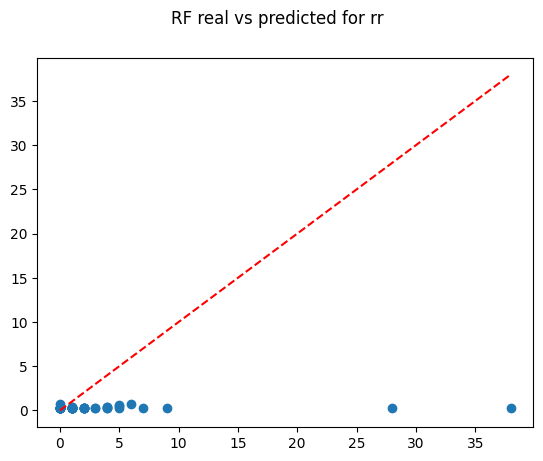

XGB for 501 at inmediato


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:15:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


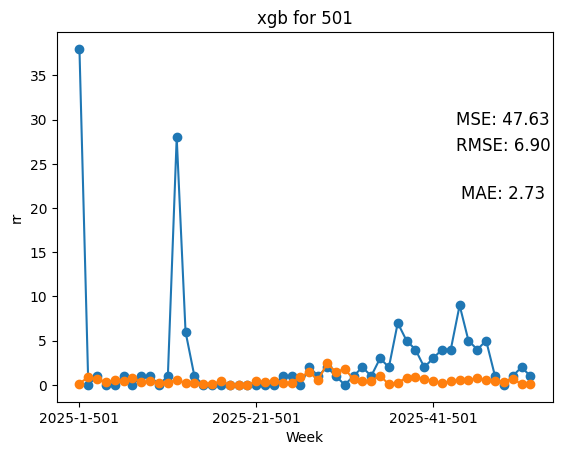

nrmse: 2.36

            RMSE train xgb: 0.153
            MSE train xgb: 0.023
                


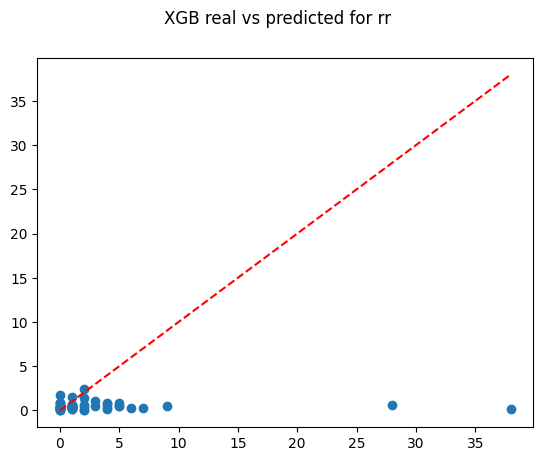

H1 for 501 at inmediato
              precision    recall  f1-score   support

           0       0.35      0.82      0.49        17
           1       0.75      0.26      0.38        35

    accuracy                           0.44        52
   macro avg       0.55      0.54      0.44        52
weighted avg       0.62      0.44      0.42        52

(52,)
(52, 108)


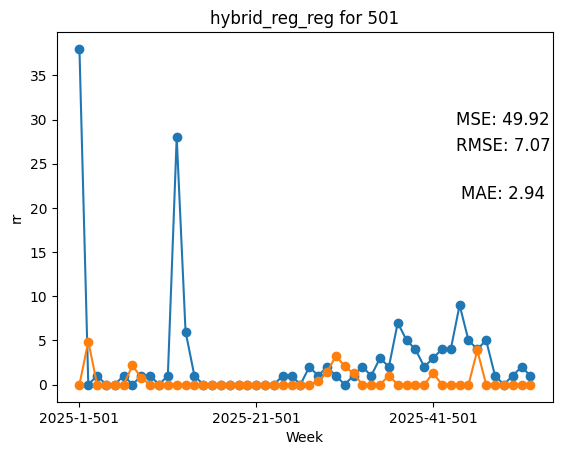

nrmse: 2.42
MSE test: 49.92
RMSE test: 7.065
RMSE train: 8.735
MSE train: 76.307
H2 for 501 at inmediato
              precision    recall  f1-score   support

           0       0.35      0.82      0.49        17
           1       0.75      0.26      0.38        35

    accuracy                           0.44        52
   macro avg       0.55      0.54      0.44        52
weighted avg       0.62      0.44      0.42        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


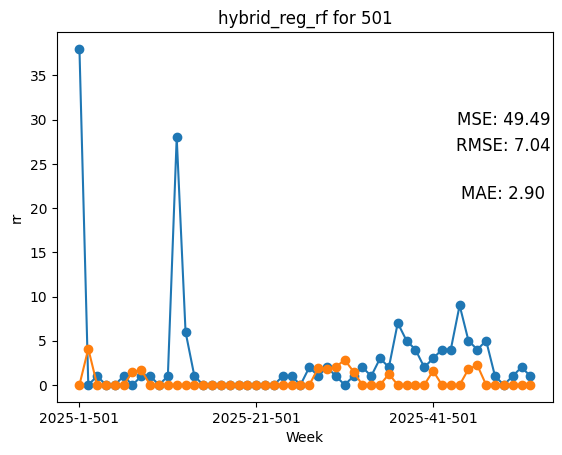

nrmse: 2.41
MSE test: 49.492
RMSE test: 7.035
RMSE train: 10.68
MSE train: 114.071
H3 for 501 at inmediato
              precision    recall  f1-score   support

           0       0.35      0.82      0.49        17
           1       0.75      0.26      0.38        35

    accuracy                           0.44        52
   macro avg       0.55      0.54      0.44        52
weighted avg       0.62      0.44      0.42        52

(52,)
(52, 108)


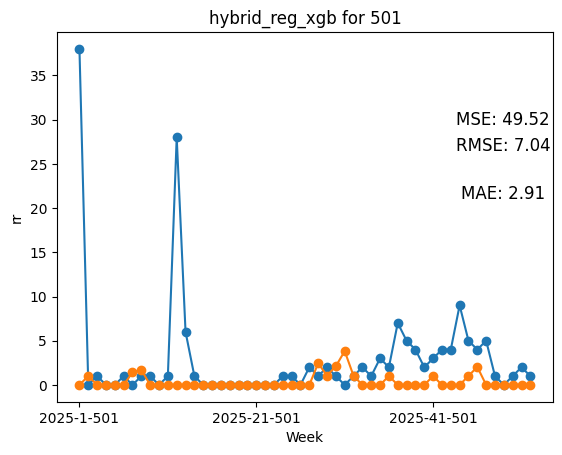

nrmse: 2.41
MSE test: 49.521
RMSE test: 7.037
RMSE train: 0.399
MSE train: 0.159
H4 for 501 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.35      1.00      0.52        17
           1       1.00      0.11      0.21        35

    accuracy                           0.40        52
   macro avg       0.68      0.56      0.36        52
weighted avg       0.79      0.40      0.31        52

(52,)
(52, 108)


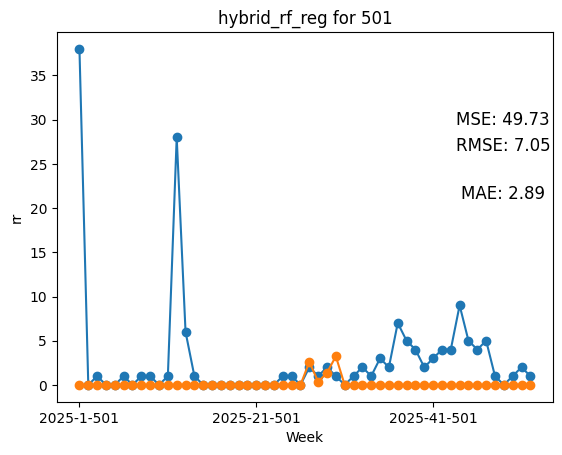

nrmse: 2.41
MSE test: 49.734
RMSE test: 7.052
RMSE train: 8.735
MSE train: 76.307
H5 for 501 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.35      1.00      0.52        17
           1       1.00      0.11      0.21        35

    accuracy                           0.40        52
   macro avg       0.68      0.56      0.36        52
weighted avg       0.79      0.40      0.31        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


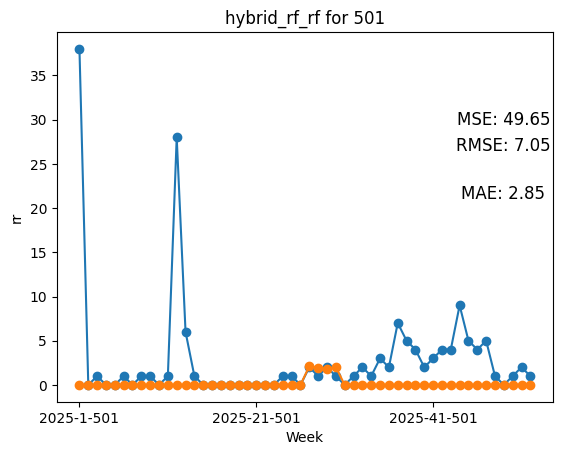

nrmse: 2.41
MSE test: 49.652
RMSE test: 7.046
RMSE train: 10.68
MSE train: 114.071
H6 for 501 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.35      1.00      0.52        17
           1       1.00      0.11      0.21        35

    accuracy                           0.40        52
   macro avg       0.68      0.56      0.36        52
weighted avg       0.79      0.40      0.31        52

(52,)
(52, 108)


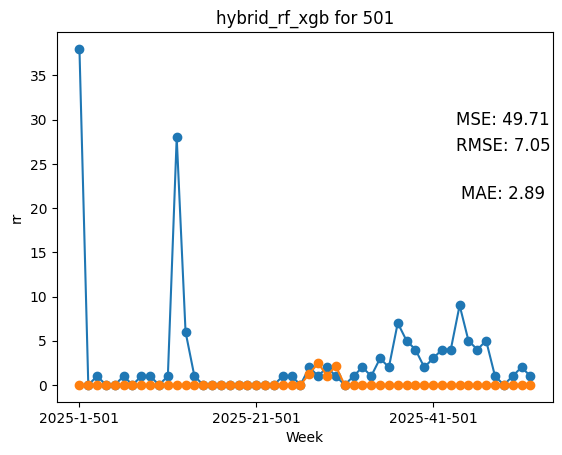

nrmse: 2.41
MSE test: 49.707
RMSE test: 7.05
RMSE train: 0.399
MSE train: 0.159
H7 for 501 at inmediato
              precision    recall  f1-score   support

           0       0.45      0.88      0.60        17
           1       0.89      0.49      0.63        35

    accuracy                           0.62        52
   macro avg       0.67      0.68      0.61        52
weighted avg       0.75      0.62      0.62        52

(52,)
(52, 108)


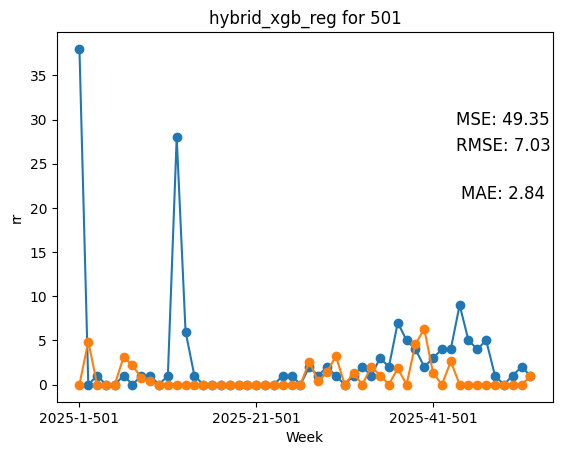

nrmse: 2.4
MSE test: 49.353
RMSE test: 7.025
RMSE train: 8.735
MSE train: 76.307
H8 for 501 at inmediato
              precision    recall  f1-score   support

           0       0.45      0.88      0.60        17
           1       0.89      0.49      0.63        35

    accuracy                           0.62        52
   macro avg       0.67      0.68      0.61        52
weighted avg       0.75      0.62      0.62        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


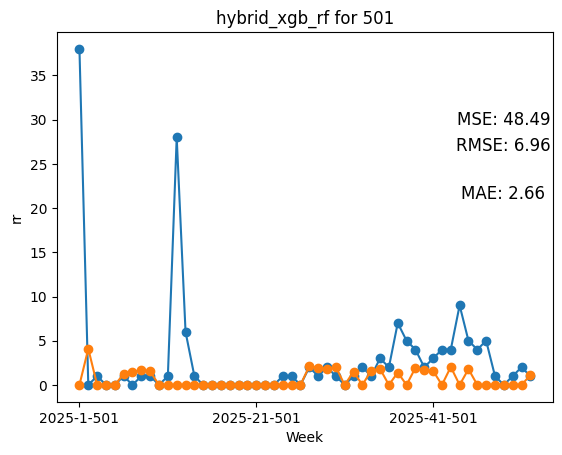

nrmse: 2.38
MSE test: 48.49
RMSE test: 6.964
RMSE train: 10.68
MSE train: 114.071
H9 for 501 at inmediato
              precision    recall  f1-score   support

           0       0.45      0.88      0.60        17
           1       0.89      0.49      0.63        35

    accuracy                           0.62        52
   macro avg       0.67      0.68      0.61        52
weighted avg       0.75      0.62      0.62        52

(52,)
(52, 108)


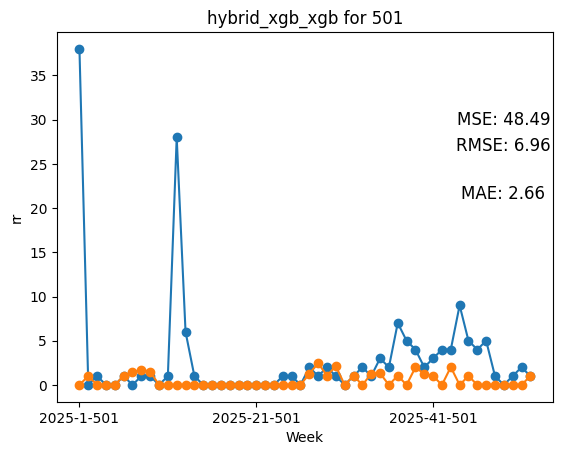

nrmse: 2.38
MSE test: 48.485
RMSE test: 6.963
RMSE train: 0.399
MSE train: 0.159
linear for 701 at inmediato


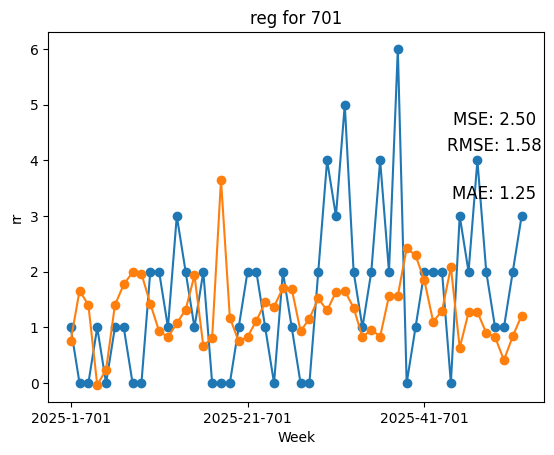

nrmse: 1.0

            RMSE train reg: 10.994
            MSE train reg: 120.866
                


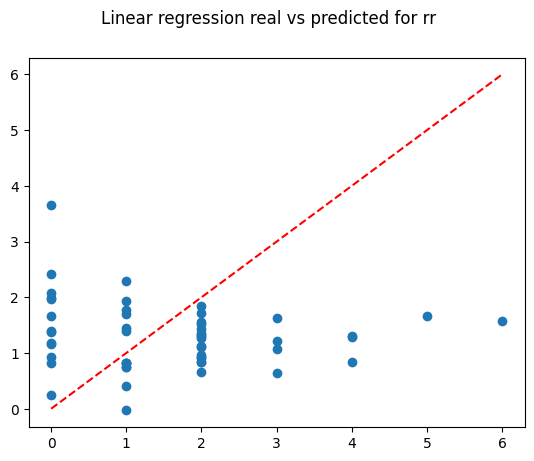

RF for 701 at inmediato


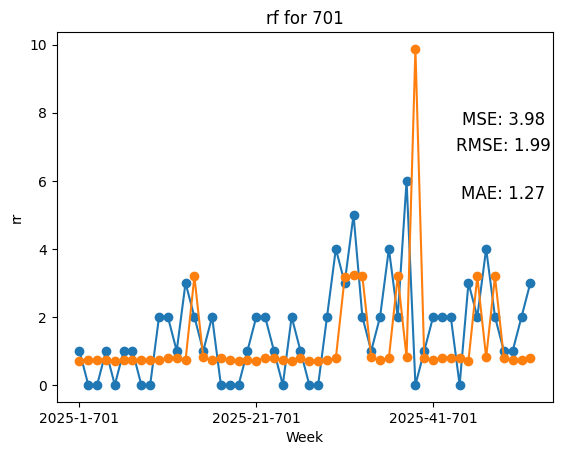

nrmse: 1.26

            RMSE train rf: 8.077
            MSE train rf: 65.241
                


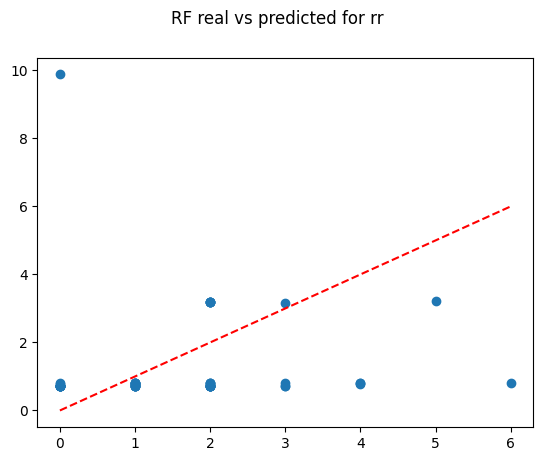

XGB for 701 at inmediato


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:16:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


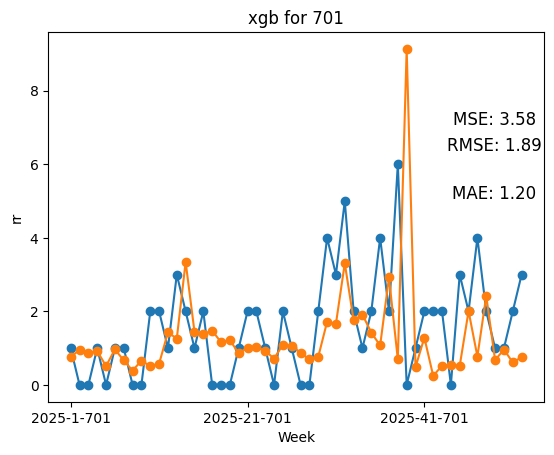

nrmse: 1.2

            RMSE train xgb: 1.331
            MSE train xgb: 1.773
                


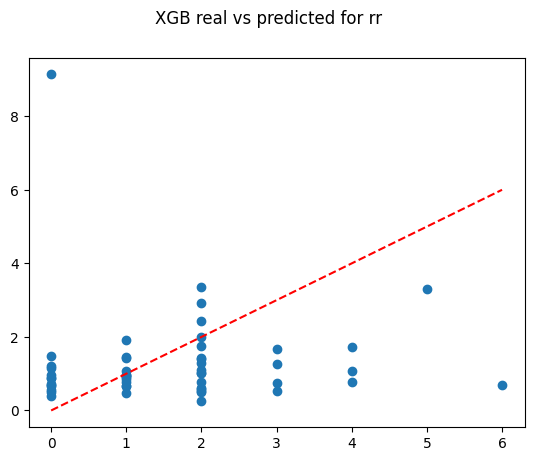

H1 for 701 at inmediato
              precision    recall  f1-score   support

           0       0.20      0.15      0.17        13
           1       0.74      0.79      0.77        39

    accuracy                           0.63        52
   macro avg       0.47      0.47      0.47        52
weighted avg       0.60      0.63      0.62        52

(52,)
(52, 108)


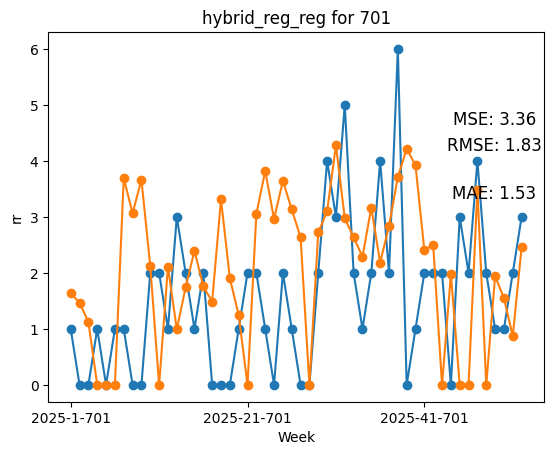

nrmse: 1.16
MSE test: 3.358
RMSE test: 1.833
RMSE train: 7.357
MSE train: 54.122
H2 for 701 at inmediato
              precision    recall  f1-score   support

           0       0.20      0.15      0.17        13
           1       0.74      0.79      0.77        39

    accuracy                           0.63        52
   macro avg       0.47      0.47      0.47        52
weighted avg       0.60      0.63      0.62        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


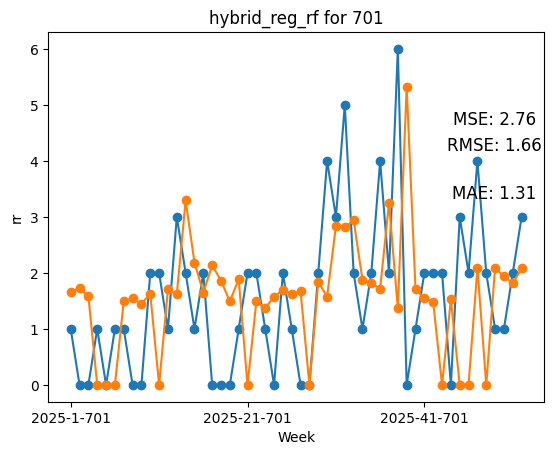

nrmse: 1.05
MSE test: 2.76
RMSE test: 1.661
RMSE train: 2.836
MSE train: 8.044
H3 for 701 at inmediato
              precision    recall  f1-score   support

           0       0.20      0.15      0.17        13
           1       0.74      0.79      0.77        39

    accuracy                           0.63        52
   macro avg       0.47      0.47      0.47        52
weighted avg       0.60      0.63      0.62        52

(52,)
(52, 108)


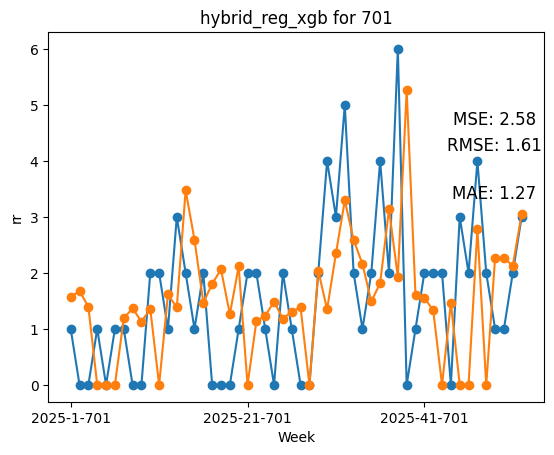

nrmse: 1.02
MSE test: 2.581
RMSE test: 1.606
RMSE train: 0.581
MSE train: 0.337
H4 for 701 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.75      1.00      0.86        39

    accuracy                           0.75        52
   macro avg       0.38      0.50      0.43        52
weighted avg       0.56      0.75      0.64        52

(52,)
(52, 108)


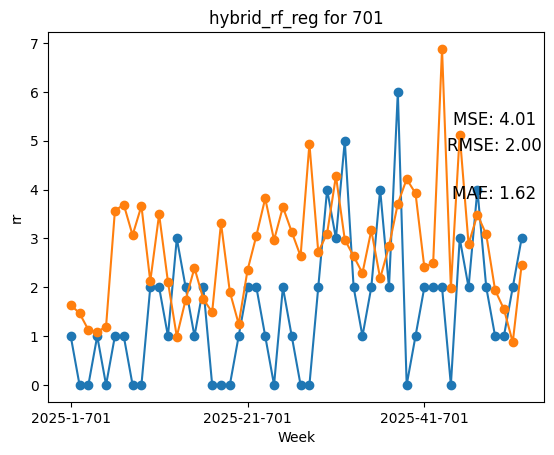

nrmse: 1.27
MSE test: 4.013
RMSE test: 2.003
RMSE train: 7.357
MSE train: 54.122
H5 for 701 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.75      1.00      0.86        39

    accuracy                           0.75        52
   macro avg       0.38      0.50      0.43        52
weighted avg       0.56      0.75      0.64        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


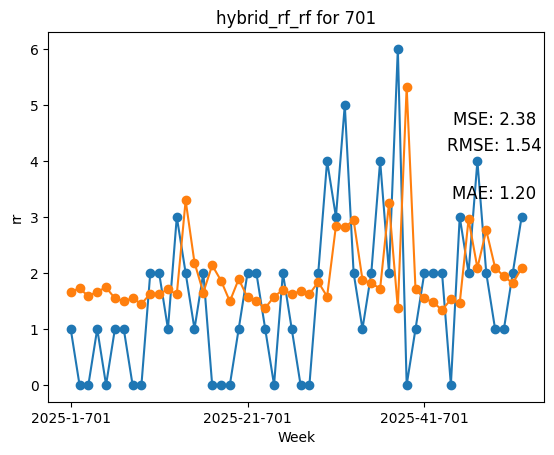

nrmse: 0.98
MSE test: 2.376
RMSE test: 1.541
RMSE train: 2.836
MSE train: 8.044
H6 for 701 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.75      1.00      0.86        39

    accuracy                           0.75        52
   macro avg       0.38      0.50      0.43        52
weighted avg       0.56      0.75      0.64        52

(52,)
(52, 108)


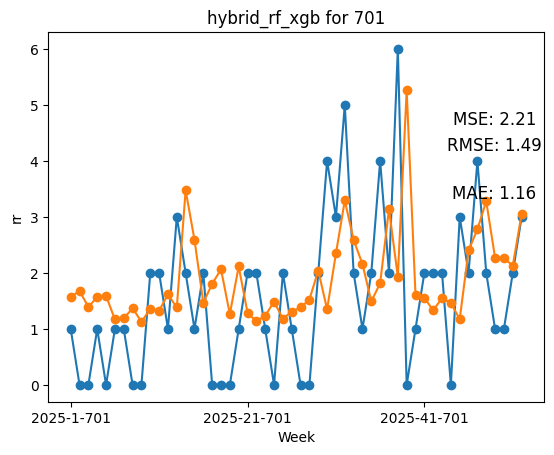

nrmse: 0.94
MSE test: 2.206
RMSE test: 1.485
RMSE train: 0.581
MSE train: 0.337
H7 for 701 at inmediato
              precision    recall  f1-score   support

           0       0.75      0.23      0.35        13
           1       0.79      0.97      0.87        39

    accuracy                           0.79        52
   macro avg       0.77      0.60      0.61        52
weighted avg       0.78      0.79      0.74        52

(52,)
(52, 108)


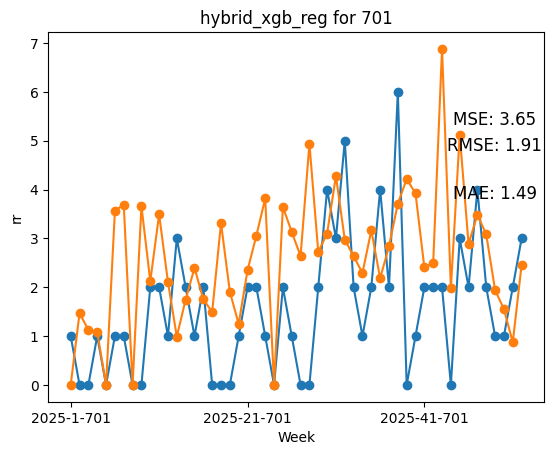

nrmse: 1.21
MSE test: 3.647
RMSE test: 1.91
RMSE train: 7.357
MSE train: 54.122
H8 for 701 at inmediato
              precision    recall  f1-score   support

           0       0.75      0.23      0.35        13
           1       0.79      0.97      0.87        39

    accuracy                           0.79        52
   macro avg       0.77      0.60      0.61        52
weighted avg       0.78      0.79      0.74        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


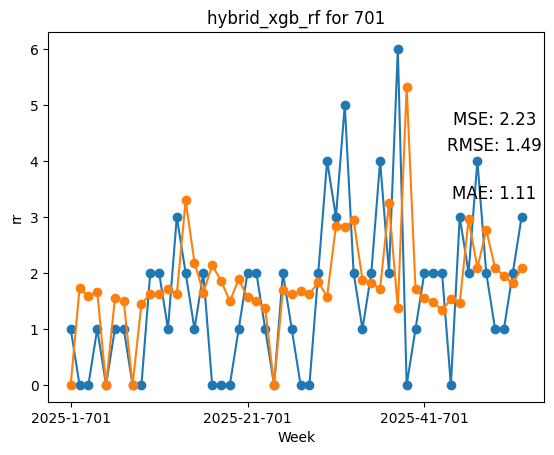

nrmse: 0.95
MSE test: 2.234
RMSE test: 1.495
RMSE train: 2.836
MSE train: 8.044
H9 for 701 at inmediato
              precision    recall  f1-score   support

           0       0.75      0.23      0.35        13
           1       0.79      0.97      0.87        39

    accuracy                           0.79        52
   macro avg       0.77      0.60      0.61        52
weighted avg       0.78      0.79      0.74        52

(52,)
(52, 108)


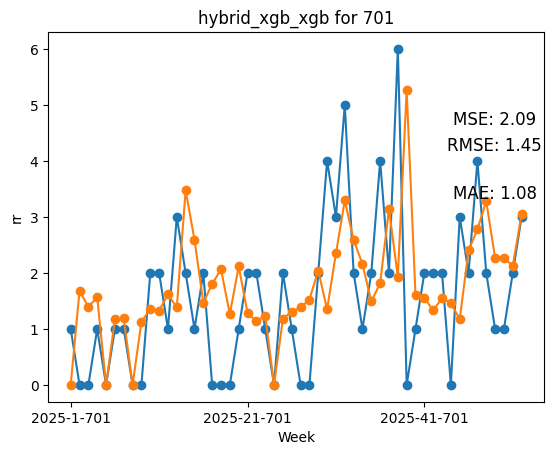

nrmse: 0.92
MSE test: 2.091
RMSE test: 1.446
RMSE train: 0.581
MSE train: 0.337
linear for 503 at inmediato


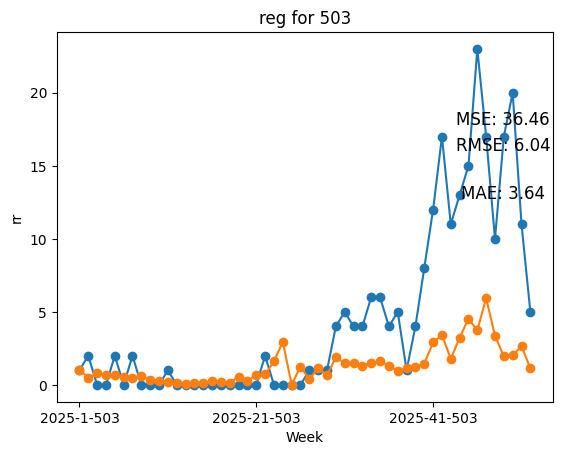

nrmse: 1.34

            RMSE train reg: 13.574
            MSE train reg: 184.245
                


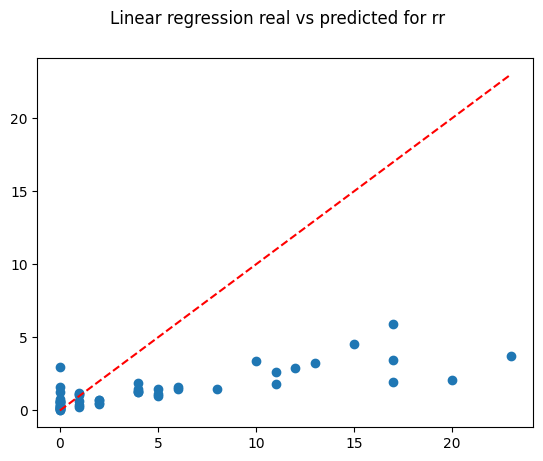

RF for 503 at inmediato


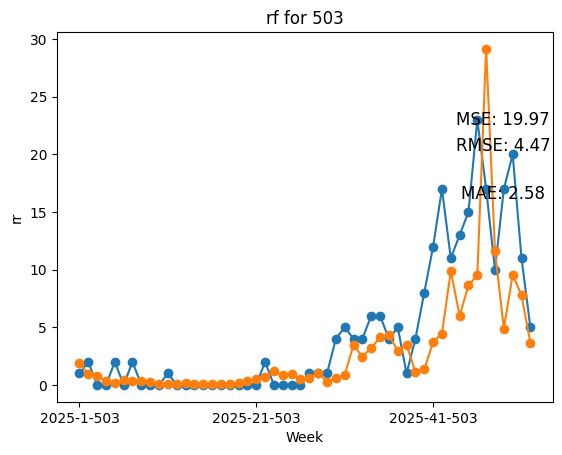

nrmse: 0.99

            RMSE train rf: 3.761
            MSE train rf: 14.143
                


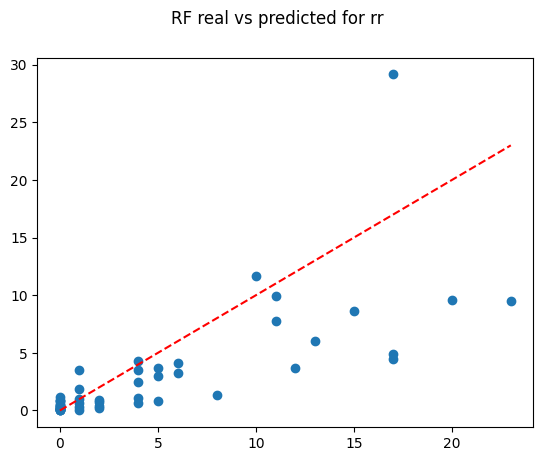

XGB for 503 at inmediato


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:17:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


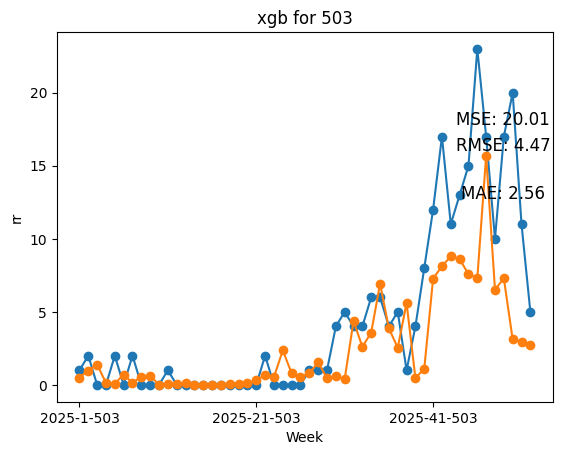

nrmse: 0.99

            RMSE train xgb: 0.336
            MSE train xgb: 0.113
                


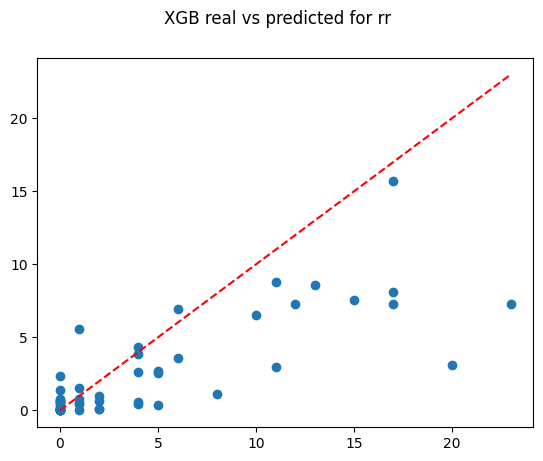

H1 for 503 at inmediato
              precision    recall  f1-score   support

           0       0.81      0.65      0.72        20
           1       0.81      0.91      0.85        32

    accuracy                           0.81        52
   macro avg       0.81      0.78      0.79        52
weighted avg       0.81      0.81      0.80        52

(52,)
(52, 108)


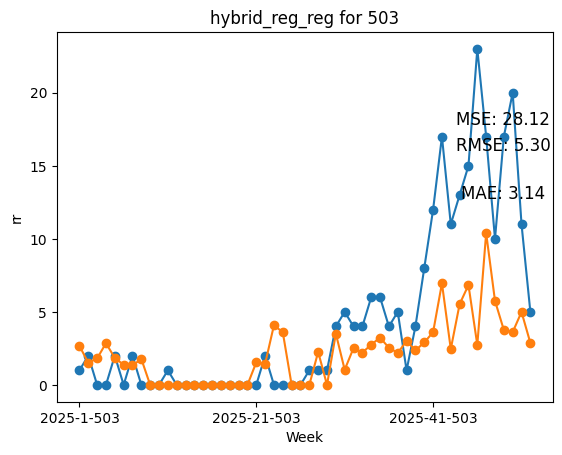

nrmse: 1.17
MSE test: 28.124
RMSE test: 5.303
RMSE train: 6.726
MSE train: 45.241
H2 for 503 at inmediato
              precision    recall  f1-score   support

           0       0.81      0.65      0.72        20
           1       0.81      0.91      0.85        32

    accuracy                           0.81        52
   macro avg       0.81      0.78      0.79        52
weighted avg       0.81      0.81      0.80        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


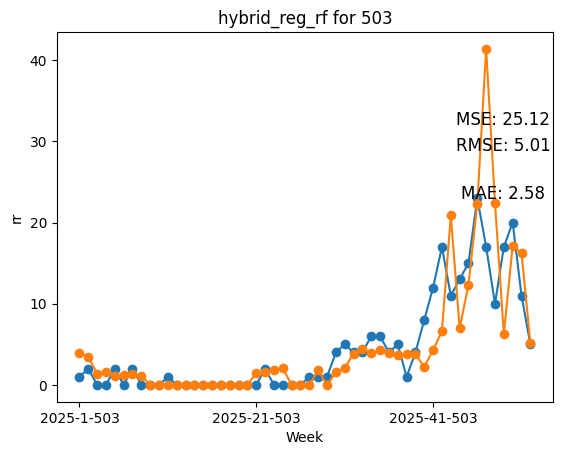

nrmse: 1.11
MSE test: 25.122
RMSE test: 5.012
RMSE train: 4.708
MSE train: 22.168
H3 for 503 at inmediato
              precision    recall  f1-score   support

           0       0.81      0.65      0.72        20
           1       0.81      0.91      0.85        32

    accuracy                           0.81        52
   macro avg       0.81      0.78      0.79        52
weighted avg       0.81      0.81      0.80        52

(52,)
(52, 108)


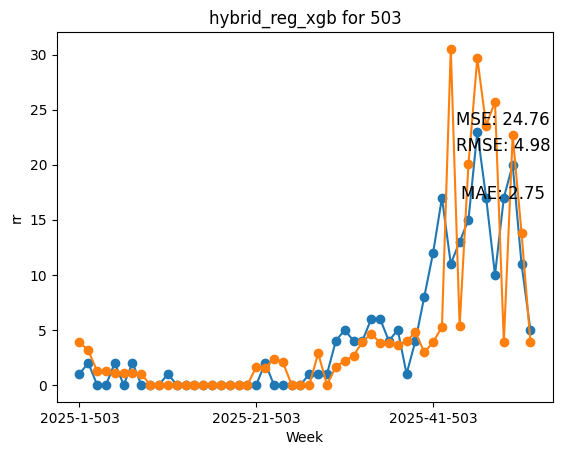

nrmse: 1.1
MSE test: 24.76
RMSE test: 4.976
RMSE train: 0.445
MSE train: 0.198
H4 for 503 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.82      0.70      0.76        20
           1       0.83      0.91      0.87        32

    accuracy                           0.83        52
   macro avg       0.83      0.80      0.81        52
weighted avg       0.83      0.83      0.82        52

(52,)
(52, 108)


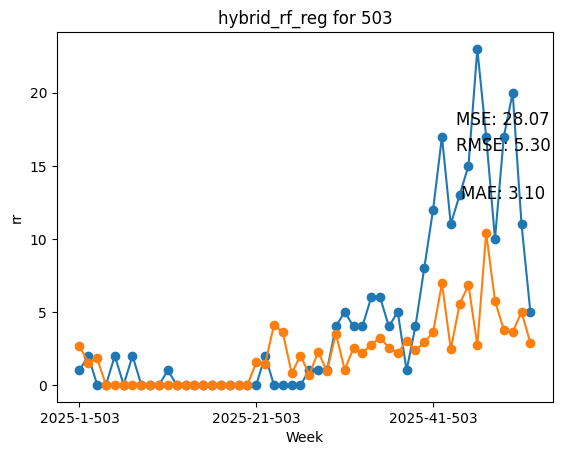

nrmse: 1.17
MSE test: 28.067
RMSE test: 5.298
RMSE train: 6.726
MSE train: 45.241
H5 for 503 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.82      0.70      0.76        20
           1       0.83      0.91      0.87        32

    accuracy                           0.83        52
   macro avg       0.83      0.80      0.81        52
weighted avg       0.83      0.83      0.82        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


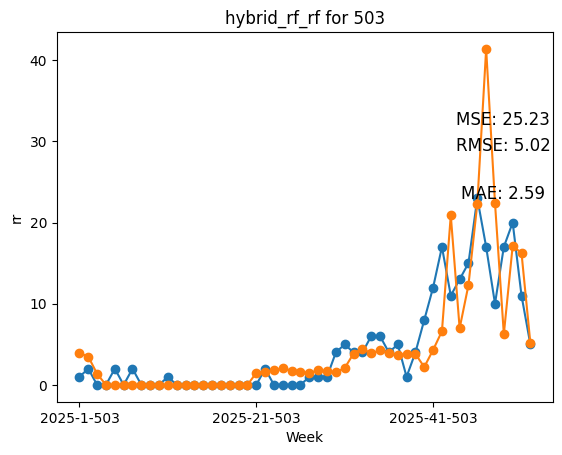

nrmse: 1.11
MSE test: 25.232
RMSE test: 5.023
RMSE train: 4.708
MSE train: 22.168
H6 for 503 at inmediato
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.82      0.70      0.76        20
           1       0.83      0.91      0.87        32

    accuracy                           0.83        52
   macro avg       0.83      0.80      0.81        52
weighted avg       0.83      0.83      0.82        52

(52,)
(52, 108)


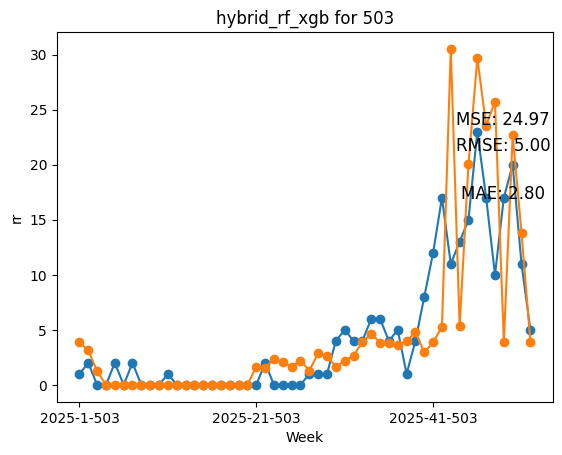

nrmse: 1.11
MSE test: 24.966
RMSE test: 4.997
RMSE train: 0.445
MSE train: 0.198
H7 for 503 at inmediato
              precision    recall  f1-score   support

           0       0.92      0.55      0.69        20
           1       0.78      0.97      0.86        32

    accuracy                           0.81        52
   macro avg       0.85      0.76      0.77        52
weighted avg       0.83      0.81      0.79        52

(52,)
(52, 108)


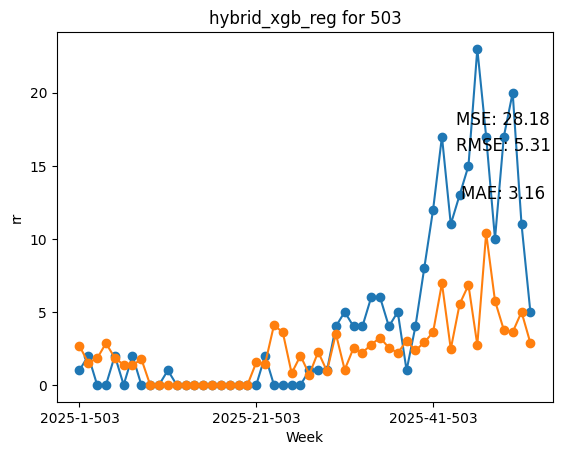

nrmse: 1.17
MSE test: 28.177
RMSE test: 5.308
RMSE train: 6.726
MSE train: 45.241
H8 for 503 at inmediato
              precision    recall  f1-score   support

           0       0.92      0.55      0.69        20
           1       0.78      0.97      0.86        32

    accuracy                           0.81        52
   macro avg       0.85      0.76      0.77        52
weighted avg       0.83      0.81      0.79        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


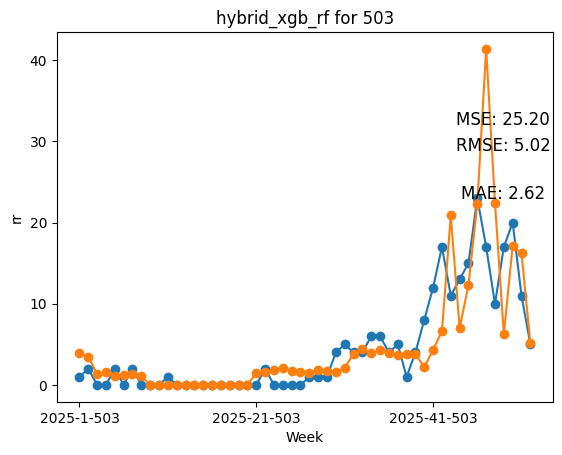

nrmse: 1.11
MSE test: 25.204
RMSE test: 5.02
RMSE train: 4.708
MSE train: 22.168
H9 for 503 at inmediato
              precision    recall  f1-score   support

           0       0.92      0.55      0.69        20
           1       0.78      0.97      0.86        32

    accuracy                           0.81        52
   macro avg       0.85      0.76      0.77        52
weighted avg       0.83      0.81      0.79        52

(52,)
(52, 108)


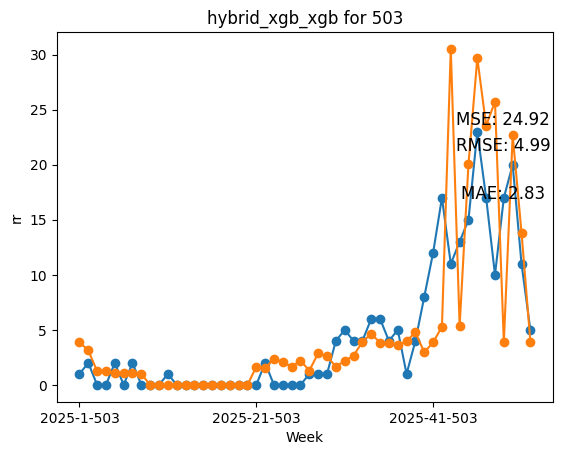

nrmse: 1.1
MSE test: 24.918
RMSE test: 4.992
RMSE train: 0.445
MSE train: 0.198


In [7]:
compare_rr(df, "201", "inmediato")
compare_rr(df, "603", "inmediato")
compare_rr(df, "501", "inmediato")
compare_rr(df, "701", "inmediato")
compare_rr(df, "503", "inmediato")

linear for 201 at mediano


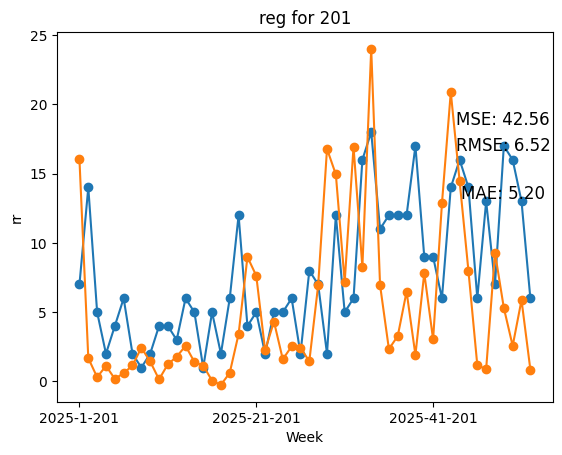

nrmse: 0.84

            RMSE train reg: 64.181
            MSE train reg: 4119.23
                


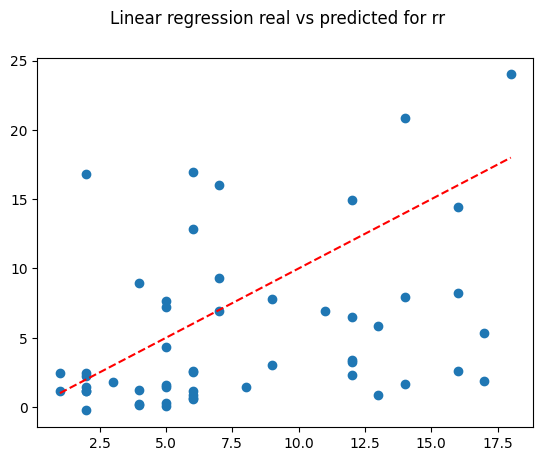

RF for 201 at mediano


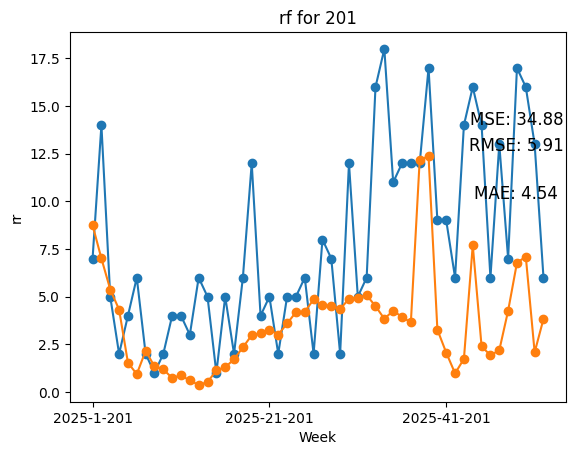

nrmse: 0.76

            RMSE train rf: 17.251
            MSE train rf: 297.612
                


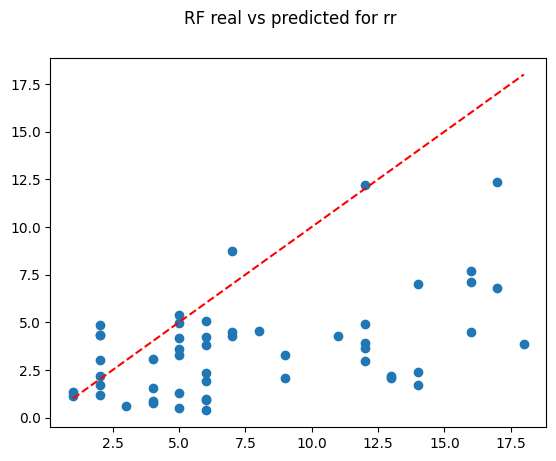

XGB for 201 at mediano


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:07:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


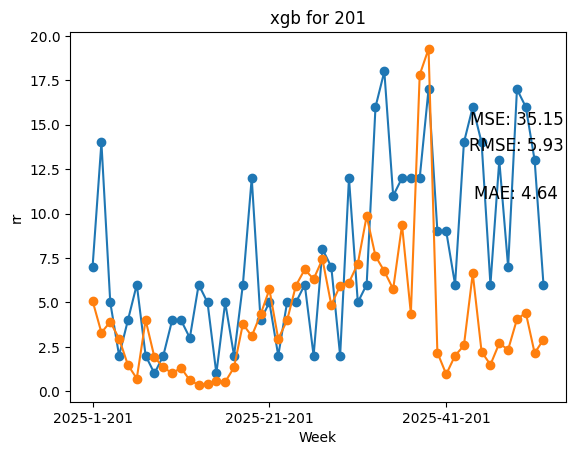

nrmse: 0.76

            RMSE train xgb: 5.334
            MSE train xgb: 28.456
                


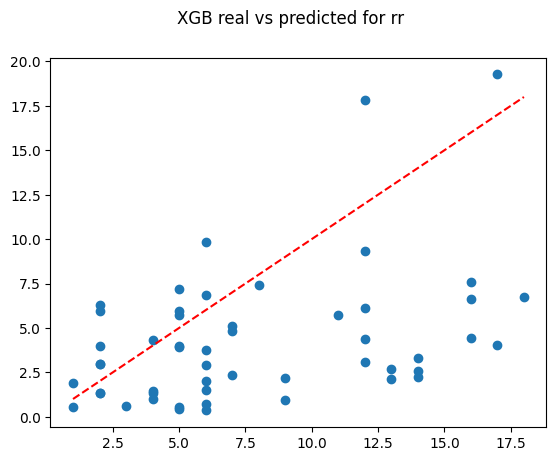

H1 for 201 at mediano
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


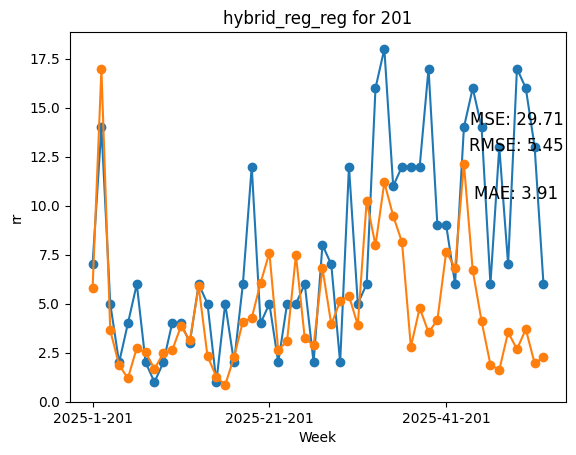

nrmse: 0.7
MSE test: 29.714
RMSE test: 5.451
RMSE train: 40.487
MSE train: 1639.198
H2 for 201 at mediano
Only one class present in test set for classification. Skipping classification step.
Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


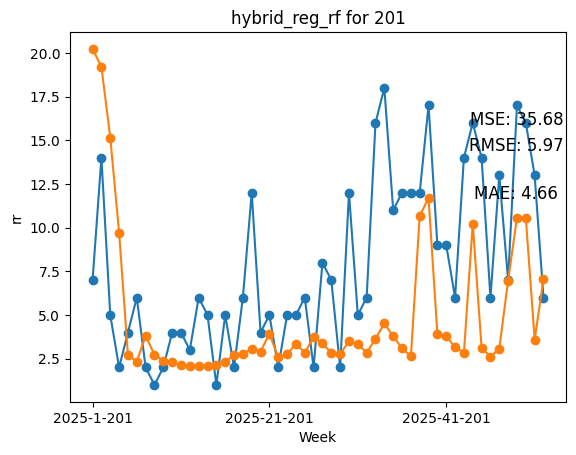

nrmse: 0.77
MSE test: 35.683
RMSE test: 5.974
RMSE train: 14.547
MSE train: 211.603
H3 for 201 at mediano
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


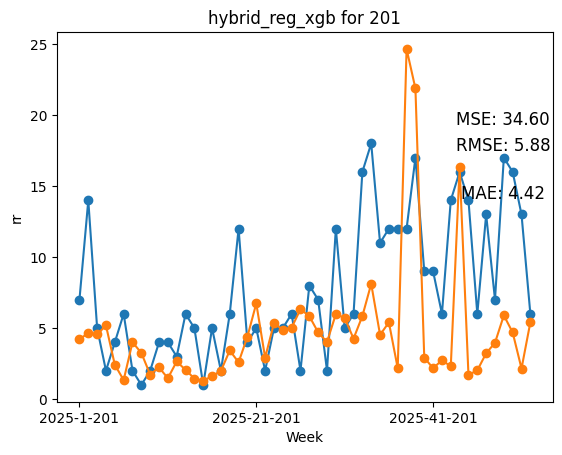

nrmse: 0.76
MSE test: 34.601
RMSE test: 5.882
RMSE train: 2.473
MSE train: 6.118
H4 for 201 at mediano
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


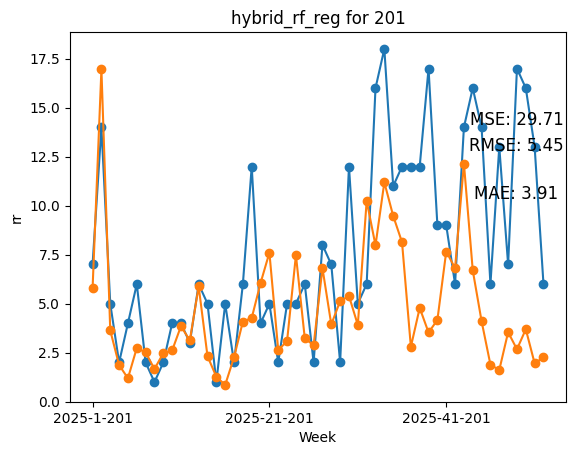

nrmse: 0.7
MSE test: 29.714
RMSE test: 5.451
RMSE train: 40.487
MSE train: 1639.198
H5 for 201 at mediano
Only one class present in test set for classification. Skipping classification step.
Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


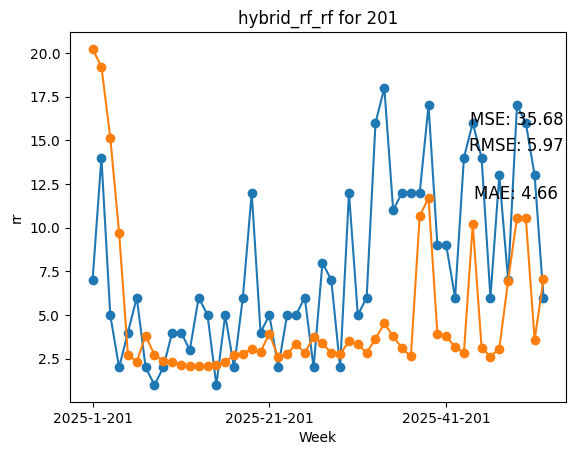

nrmse: 0.77
MSE test: 35.683
RMSE test: 5.974
RMSE train: 14.547
MSE train: 211.603
H6 for 201 at mediano
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


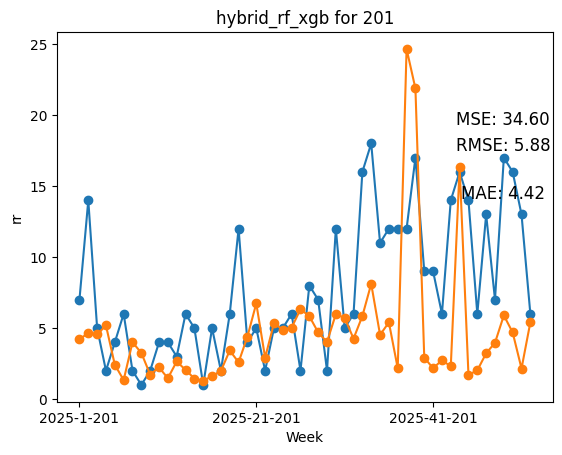

nrmse: 0.76
MSE test: 34.601
RMSE test: 5.882
RMSE train: 2.473
MSE train: 6.118
H7 for 201 at mediano
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


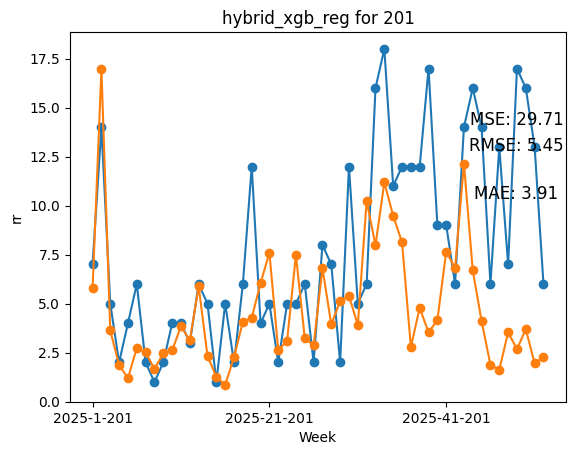

nrmse: 0.7
MSE test: 29.714
RMSE test: 5.451
RMSE train: 40.487
MSE train: 1639.198
H8 for 201 at mediano
Only one class present in test set for classification. Skipping classification step.
Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


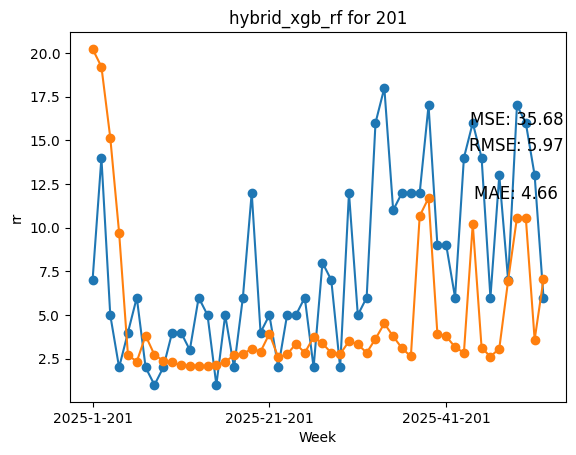

nrmse: 0.77
MSE test: 35.683
RMSE test: 5.974
RMSE train: 14.547
MSE train: 211.603
H9 for 201 at mediano
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 108)


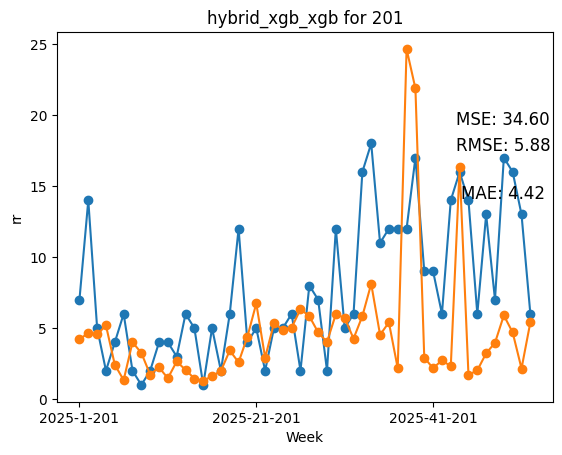

nrmse: 0.76
MSE test: 34.601
RMSE test: 5.882
RMSE train: 2.473
MSE train: 6.118
linear for 603 at mediano


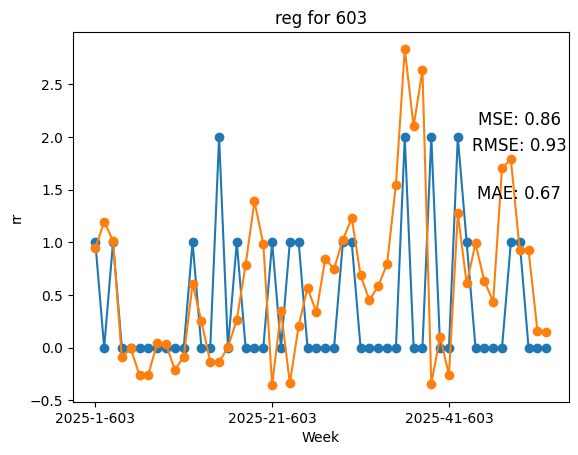

nrmse: 2.42

            RMSE train reg: 6.869
            MSE train reg: 47.178
                


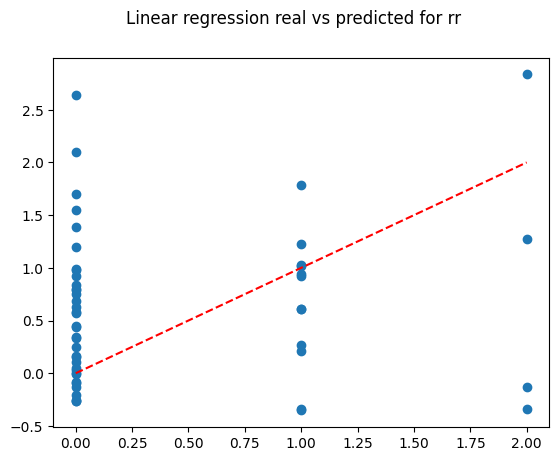

RF for 603 at mediano


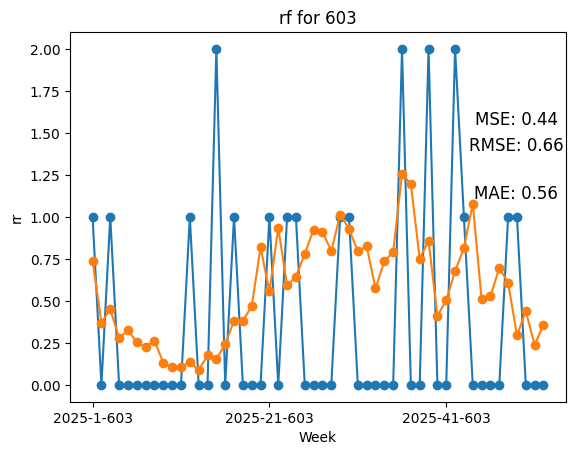

nrmse: 1.73

            RMSE train rf: 5.326
            MSE train rf: 28.361
                


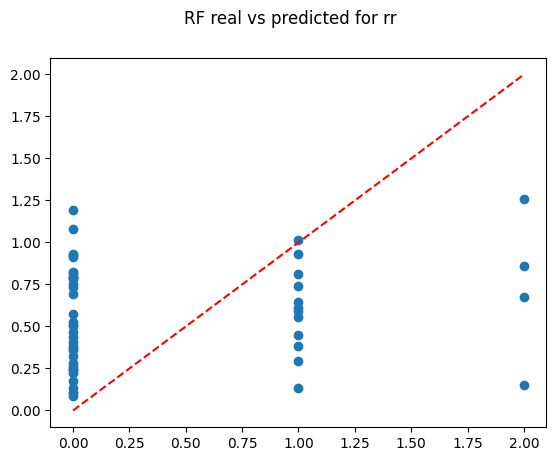

XGB for 603 at mediano


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:09:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


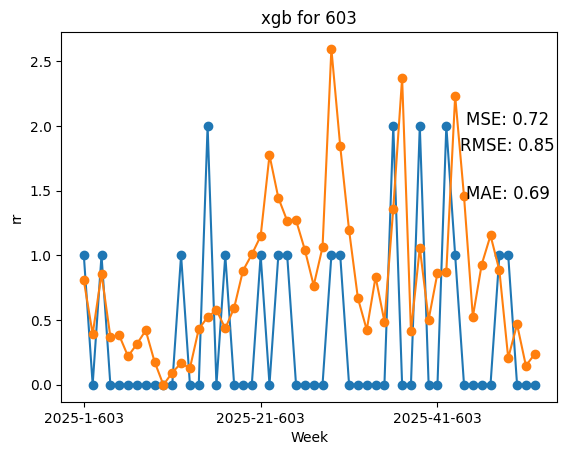

nrmse: 2.2

            RMSE train xgb: 0.007
            MSE train xgb: 0.0
                


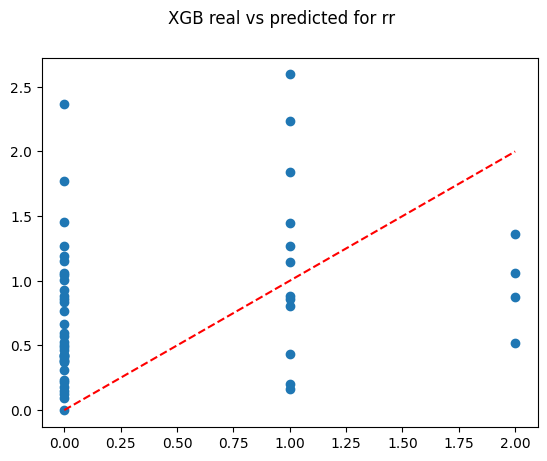

H1 for 603 at mediano
              precision    recall  f1-score   support

           0       0.74      0.72      0.73        36
           1       0.41      0.44      0.42        16

    accuracy                           0.63        52
   macro avg       0.58      0.58      0.58        52
weighted avg       0.64      0.63      0.64        52

(52,)
(52, 108)


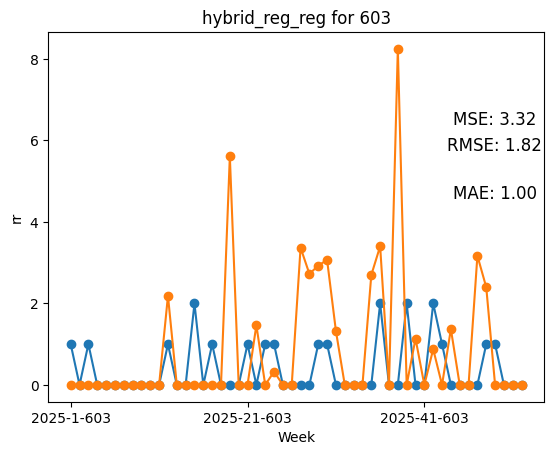

nrmse: 4.74
MSE test: 3.318
RMSE test: 1.822
RMSE train: 7.956
MSE train: 63.298
H2 for 603 at mediano
              precision    recall  f1-score   support

           0       0.74      0.72      0.73        36
           1       0.41      0.44      0.42        16

    accuracy                           0.63        52
   macro avg       0.58      0.58      0.58        52
weighted avg       0.64      0.63      0.64        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


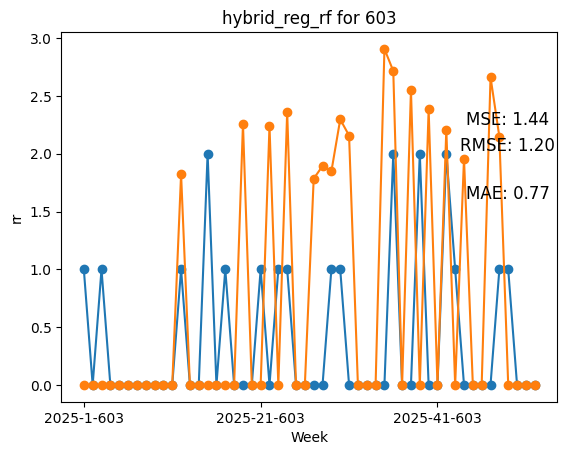

nrmse: 3.12
MSE test: 1.44
RMSE test: 1.2
RMSE train: 5.458
MSE train: 29.786
H3 for 603 at mediano
              precision    recall  f1-score   support

           0       0.74      0.72      0.73        36
           1       0.41      0.44      0.42        16

    accuracy                           0.63        52
   macro avg       0.58      0.58      0.58        52
weighted avg       0.64      0.63      0.64        52

(52,)
(52, 108)


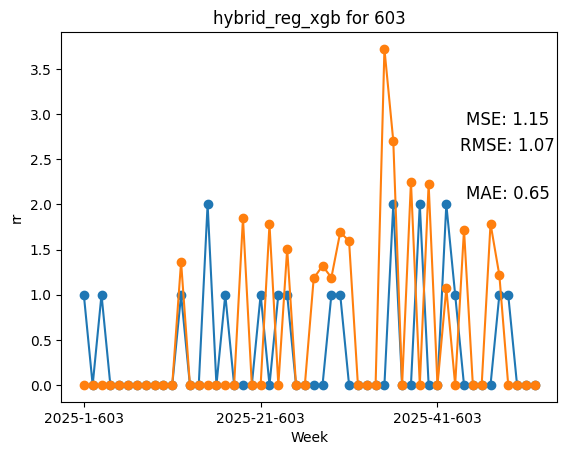

nrmse: 2.78
MSE test: 1.146
RMSE test: 1.071
RMSE train: 0.588
MSE train: 0.345
H4 for 603 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.73      0.53      0.61        36
           1       0.35      0.56      0.43        16

    accuracy                           0.54        52
   macro avg       0.54      0.55      0.52        52
weighted avg       0.61      0.54      0.56        52

(52,)
(52, 108)


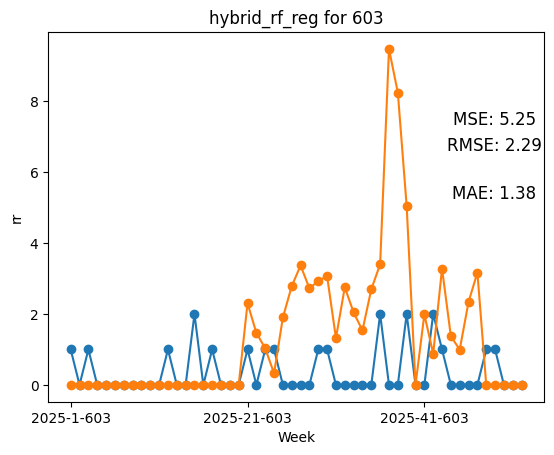

nrmse: 5.96
MSE test: 5.254
RMSE test: 2.292
RMSE train: 7.956
MSE train: 63.298
H5 for 603 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.73      0.53      0.61        36
           1       0.35      0.56      0.43        16

    accuracy                           0.54        52
   macro avg       0.54      0.55      0.52        52
weighted avg       0.61      0.54      0.56        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


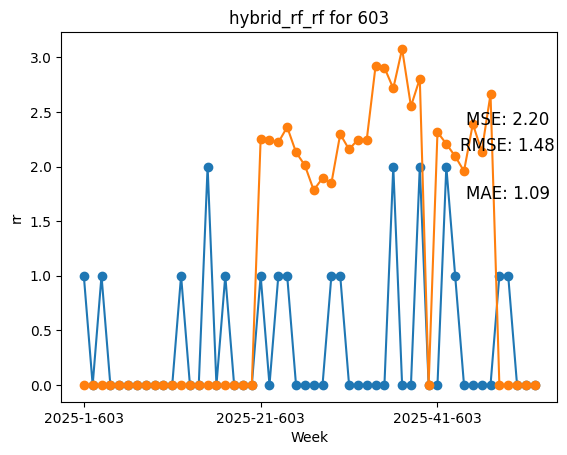

nrmse: 3.86
MSE test: 2.199
RMSE test: 1.483
RMSE train: 5.458
MSE train: 29.786
H6 for 603 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.73      0.53      0.61        36
           1       0.35      0.56      0.43        16

    accuracy                           0.54        52
   macro avg       0.54      0.55      0.52        52
weighted avg       0.61      0.54      0.56        52

(52,)
(52, 108)


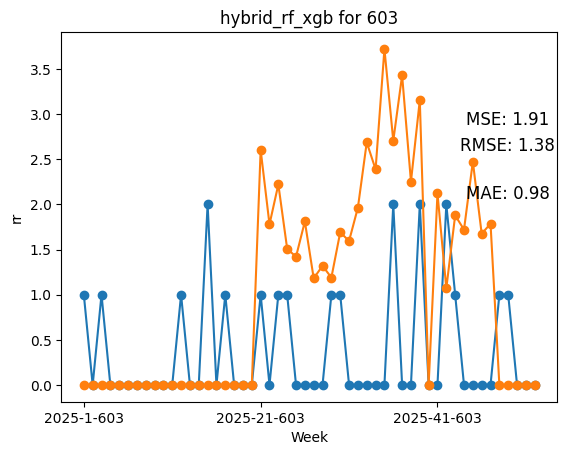

nrmse: 3.6
MSE test: 1.914
RMSE test: 1.383
RMSE train: 0.588
MSE train: 0.345
H7 for 603 at mediano
              precision    recall  f1-score   support

           0       0.78      0.69      0.74        36
           1       0.45      0.56      0.50        16

    accuracy                           0.65        52
   macro avg       0.62      0.63      0.62        52
weighted avg       0.68      0.65      0.66        52

(52,)
(52, 108)


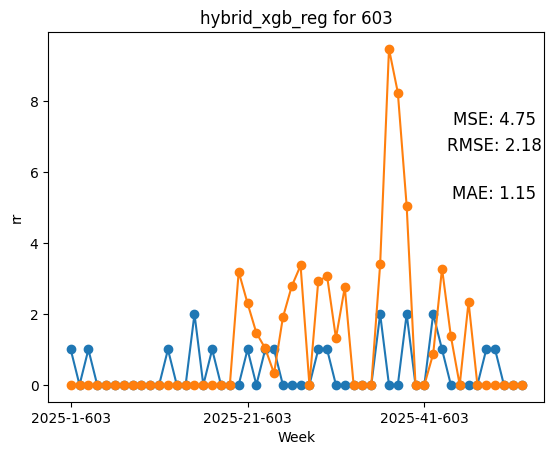

nrmse: 5.67
MSE test: 4.754
RMSE test: 2.18
RMSE train: 7.956
MSE train: 63.298
H8 for 603 at mediano
              precision    recall  f1-score   support

           0       0.78      0.69      0.74        36
           1       0.45      0.56      0.50        16

    accuracy                           0.65        52
   macro avg       0.62      0.63      0.62        52
weighted avg       0.68      0.65      0.66        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


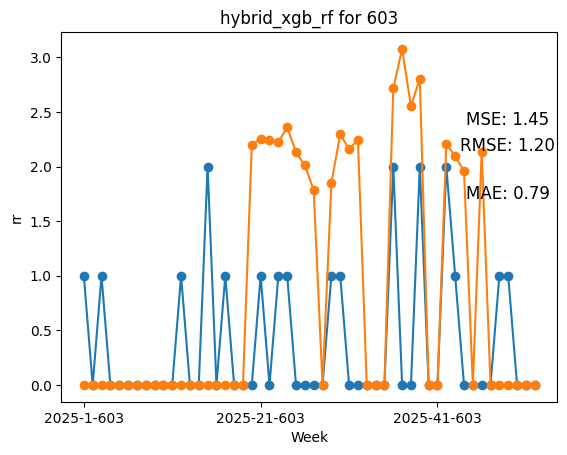

nrmse: 3.13
MSE test: 1.451
RMSE test: 1.204
RMSE train: 5.458
MSE train: 29.786
H9 for 603 at mediano
              precision    recall  f1-score   support

           0       0.78      0.69      0.74        36
           1       0.45      0.56      0.50        16

    accuracy                           0.65        52
   macro avg       0.62      0.63      0.62        52
weighted avg       0.68      0.65      0.66        52

(52,)
(52, 108)


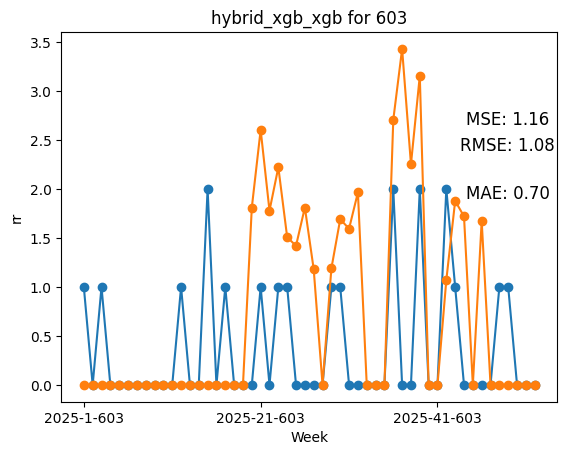

nrmse: 2.8
MSE test: 1.162
RMSE test: 1.078
RMSE train: 0.588
MSE train: 0.345
linear for 501 at mediano


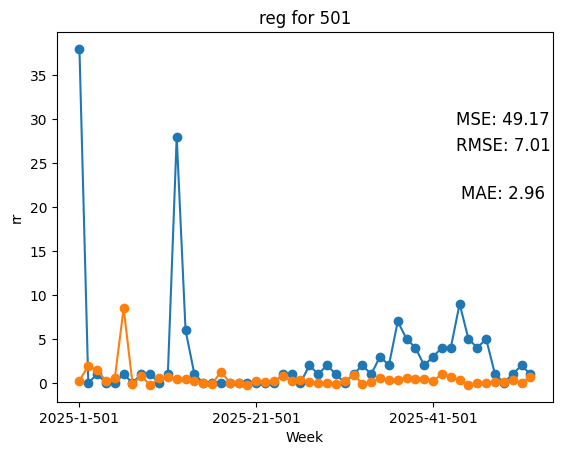

nrmse: 2.4

            RMSE train reg: 9.351
            MSE train reg: 87.438
                


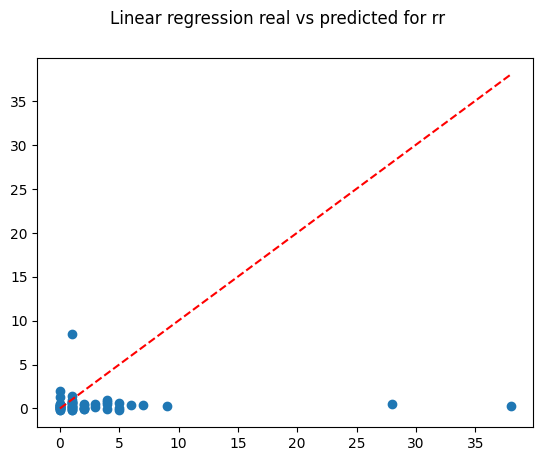

RF for 501 at mediano


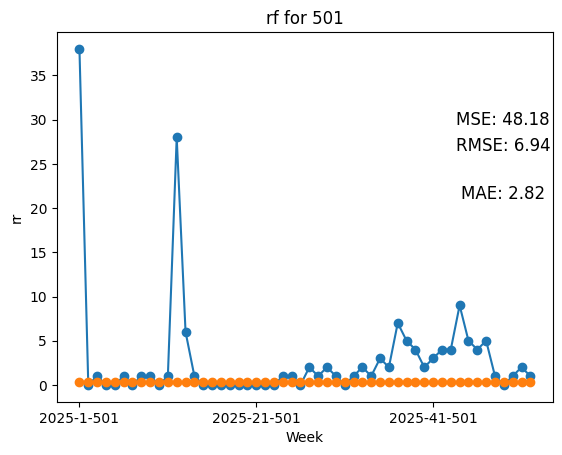

nrmse: 2.37

            RMSE train rf: 13.722
            MSE train rf: 188.304
                


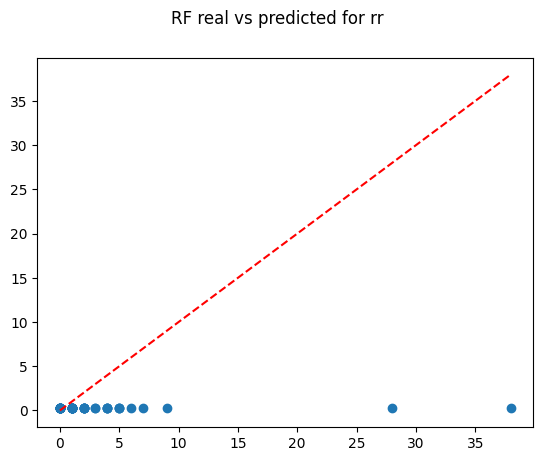

XGB for 501 at mediano


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:10:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


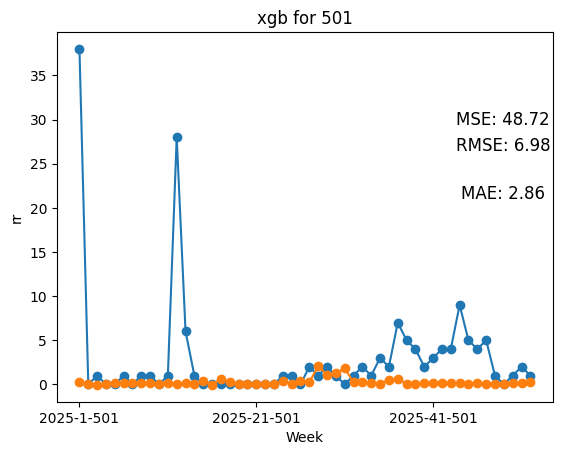

nrmse: 2.39

            RMSE train xgb: 0.008
            MSE train xgb: 0.0
                


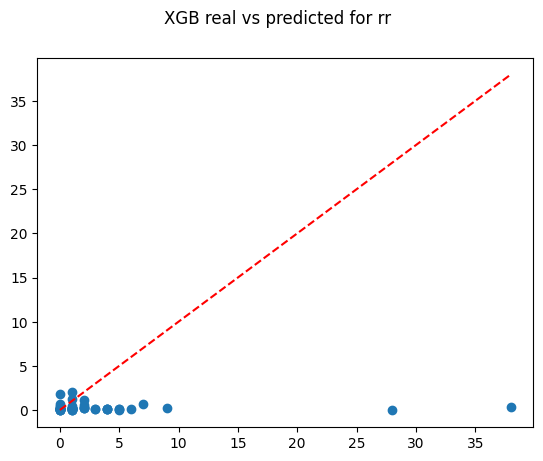

H1 for 501 at mediano
              precision    recall  f1-score   support

           0       0.35      1.00      0.52        17
           1       1.00      0.09      0.16        35

    accuracy                           0.38        52
   macro avg       0.67      0.54      0.34        52
weighted avg       0.79      0.38      0.27        52

(52,)
(52, 108)


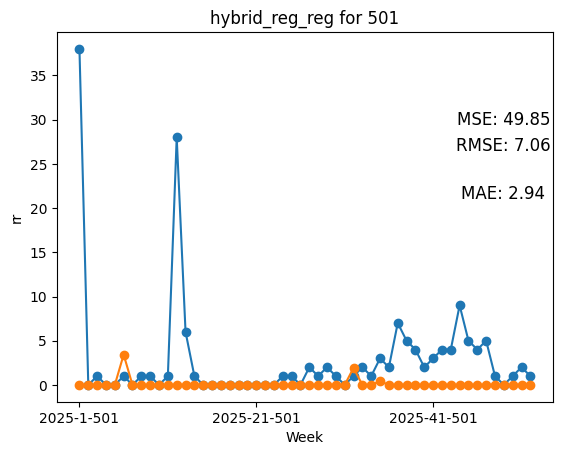

nrmse: 2.42
MSE test: 49.854
RMSE test: 7.061
RMSE train: 7.988
MSE train: 63.801
H2 for 501 at mediano
              precision    recall  f1-score   support

           0       0.35      1.00      0.52        17
           1       1.00      0.09      0.16        35

    accuracy                           0.38        52
   macro avg       0.67      0.54      0.34        52
weighted avg       0.79      0.38      0.27        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


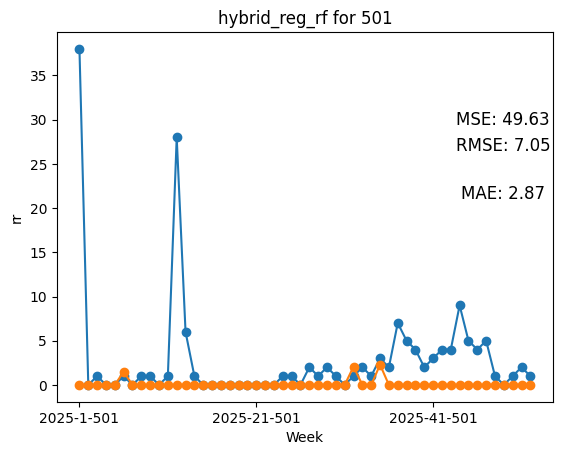

nrmse: 2.41
MSE test: 49.633
RMSE test: 7.045
RMSE train: 11.085
MSE train: 122.882
H3 for 501 at mediano
              precision    recall  f1-score   support

           0       0.35      1.00      0.52        17
           1       1.00      0.09      0.16        35

    accuracy                           0.38        52
   macro avg       0.67      0.54      0.34        52
weighted avg       0.79      0.38      0.27        52

(52,)
(52, 108)


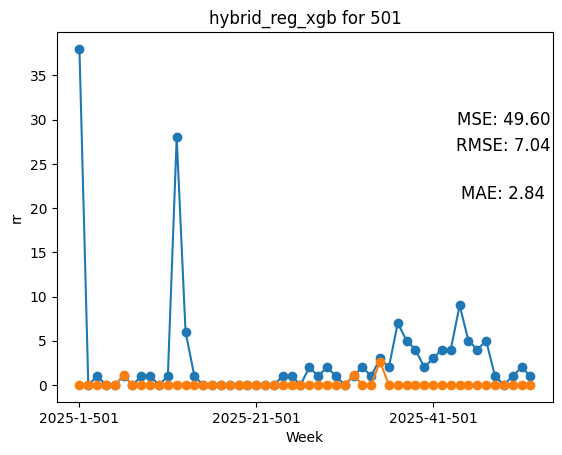

nrmse: 2.41
MSE test: 49.599
RMSE test: 7.043
RMSE train: 0.408
MSE train: 0.166
H4 for 501 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.34      0.94      0.50        17
           1       0.80      0.11      0.20        35

    accuracy                           0.38        52
   macro avg       0.57      0.53      0.35        52
weighted avg       0.65      0.38      0.30        52

(52,)
(52, 108)


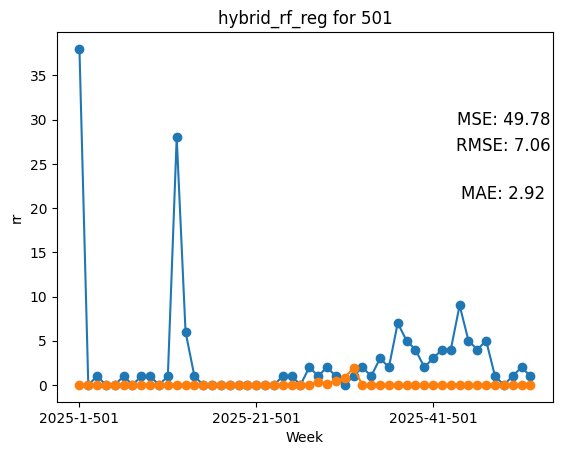

nrmse: 2.41
MSE test: 49.783
RMSE test: 7.056
RMSE train: 7.988
MSE train: 63.801
H5 for 501 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.34      0.94      0.50        17
           1       0.80      0.11      0.20        35

    accuracy                           0.38        52
   macro avg       0.57      0.53      0.35        52
weighted avg       0.65      0.38      0.30        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


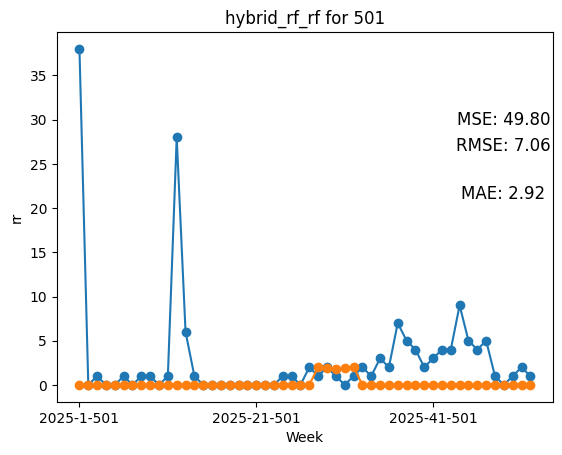

nrmse: 2.41
MSE test: 49.799
RMSE test: 7.057
RMSE train: 11.085
MSE train: 122.882
H6 for 501 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.34      0.94      0.50        17
           1       0.80      0.11      0.20        35

    accuracy                           0.38        52
   macro avg       0.57      0.53      0.35        52
weighted avg       0.65      0.38      0.30        52

(52,)
(52, 108)


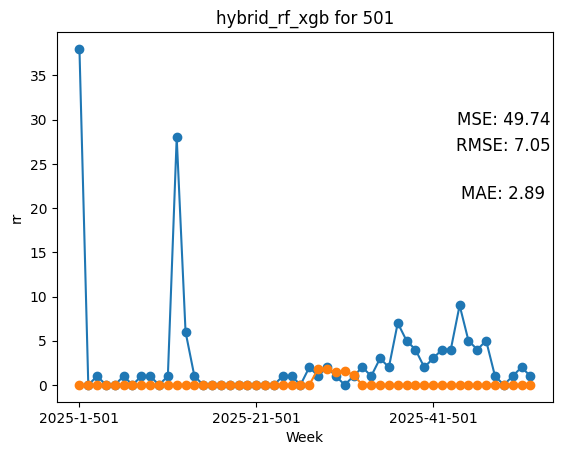

nrmse: 2.41
MSE test: 49.739
RMSE test: 7.053
RMSE train: 0.408
MSE train: 0.166
H7 for 501 at mediano
              precision    recall  f1-score   support

           0       0.38      0.88      0.54        17
           1       0.85      0.31      0.46        35

    accuracy                           0.50        52
   macro avg       0.62      0.60      0.50        52
weighted avg       0.70      0.50      0.48        52

(52,)
(52, 108)


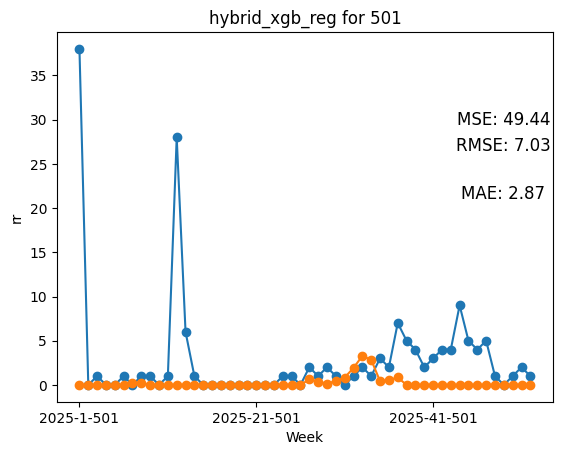

nrmse: 2.41
MSE test: 49.441
RMSE test: 7.031
RMSE train: 7.988
MSE train: 63.801
H8 for 501 at mediano
              precision    recall  f1-score   support

           0       0.38      0.88      0.54        17
           1       0.85      0.31      0.46        35

    accuracy                           0.50        52
   macro avg       0.62      0.60      0.50        52
weighted avg       0.70      0.50      0.48        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


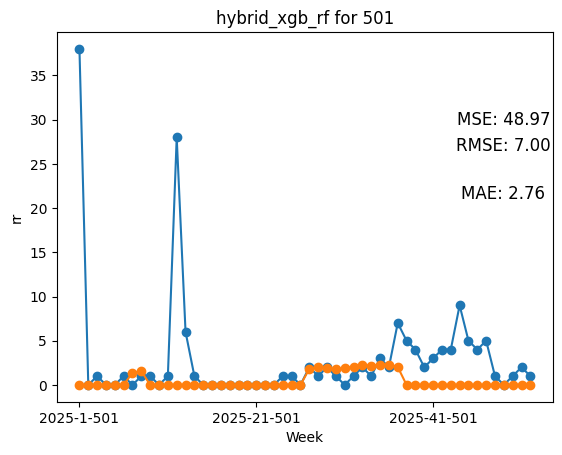

nrmse: 2.39
MSE test: 48.971
RMSE test: 6.998
RMSE train: 11.085
MSE train: 122.882
H9 for 501 at mediano
              precision    recall  f1-score   support

           0       0.38      0.88      0.54        17
           1       0.85      0.31      0.46        35

    accuracy                           0.50        52
   macro avg       0.62      0.60      0.50        52
weighted avg       0.70      0.50      0.48        52

(52,)
(52, 108)


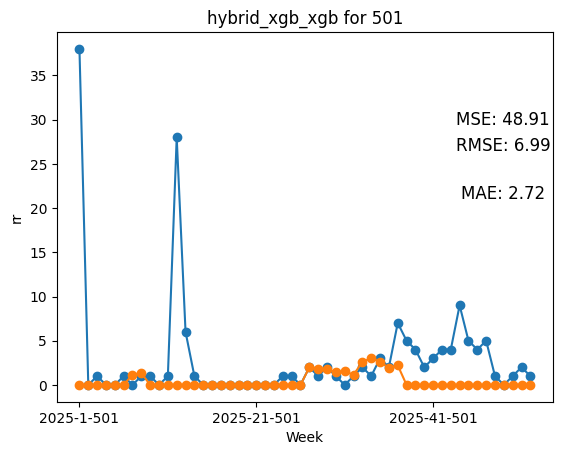

nrmse: 2.39
MSE test: 48.911
RMSE test: 6.994
RMSE train: 0.408
MSE train: 0.166
linear for 701 at mediano


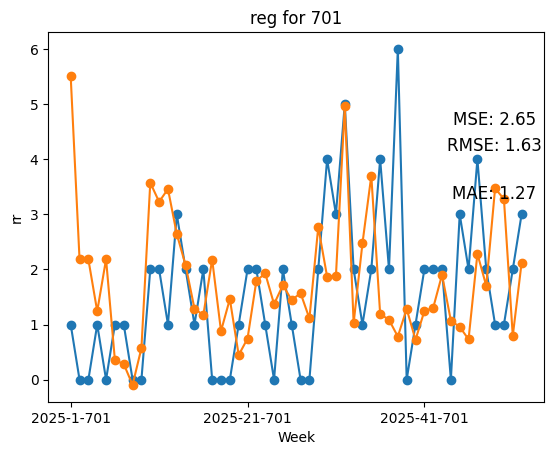

nrmse: 1.03

            RMSE train reg: 7.202
            MSE train reg: 51.869
                


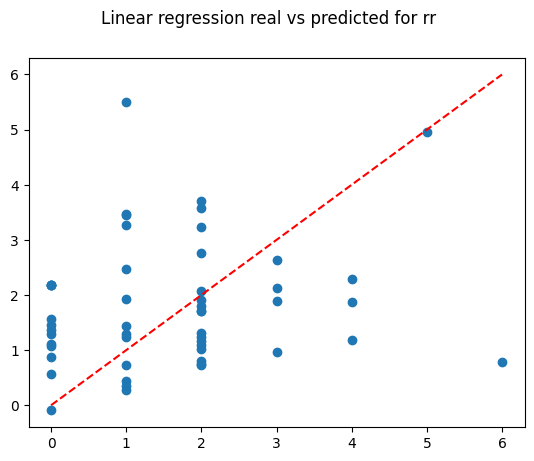

RF for 701 at mediano


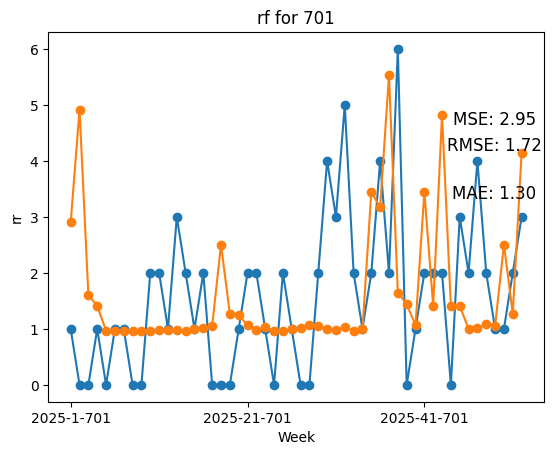

nrmse: 1.09

            RMSE train rf: 9.693
            MSE train rf: 93.947
                


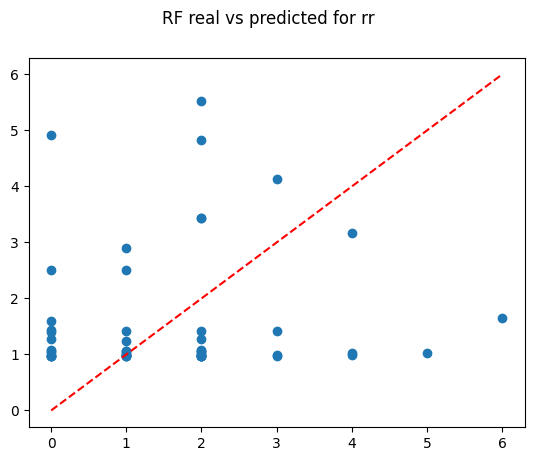

XGB for 701 at mediano


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:11:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


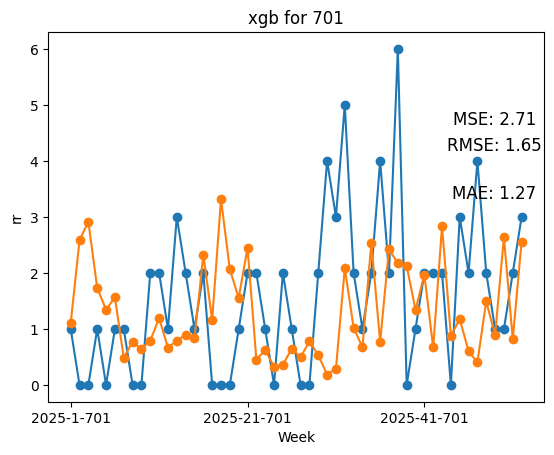

nrmse: 1.04

            RMSE train xgb: 0.007
            MSE train xgb: 0.0
                


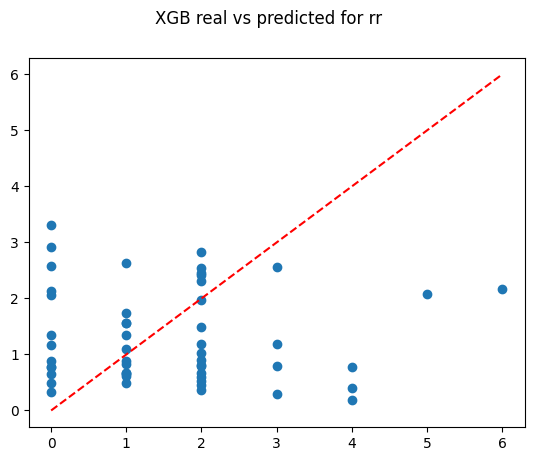

H1 for 701 at mediano
              precision    recall  f1-score   support

           0       0.30      0.23      0.26        13
           1       0.76      0.82      0.79        39

    accuracy                           0.67        52
   macro avg       0.53      0.53      0.53        52
weighted avg       0.65      0.67      0.66        52

(52,)
(52, 108)


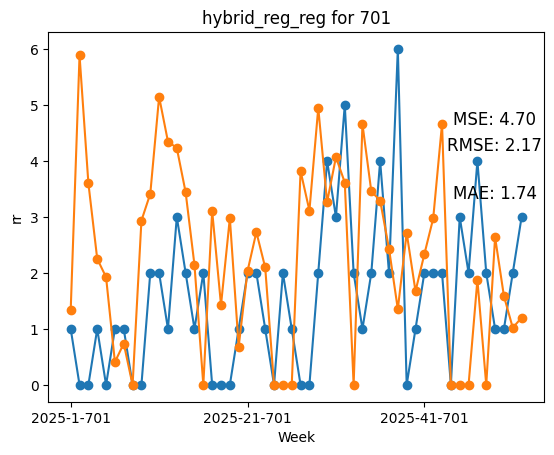

nrmse: 1.37
MSE test: 4.701
RMSE test: 2.168
RMSE train: 6.053
MSE train: 36.634
H2 for 701 at mediano
              precision    recall  f1-score   support

           0       0.30      0.23      0.26        13
           1       0.76      0.82      0.79        39

    accuracy                           0.67        52
   macro avg       0.53      0.53      0.53        52
weighted avg       0.65      0.67      0.66        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


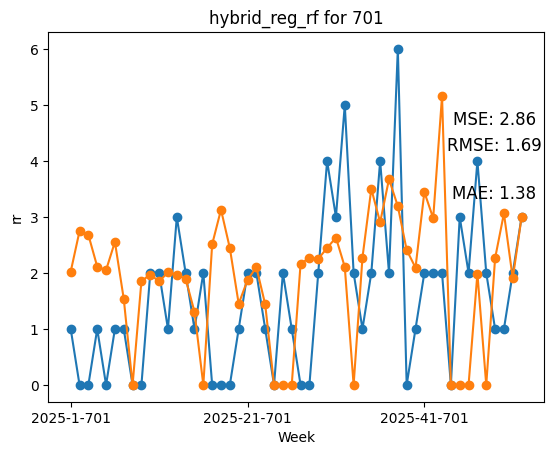

nrmse: 1.07
MSE test: 2.856
RMSE test: 1.69
RMSE train: 4.052
MSE train: 16.419
H3 for 701 at mediano
              precision    recall  f1-score   support

           0       0.30      0.23      0.26        13
           1       0.76      0.82      0.79        39

    accuracy                           0.67        52
   macro avg       0.53      0.53      0.53        52
weighted avg       0.65      0.67      0.66        52

(52,)
(52, 108)


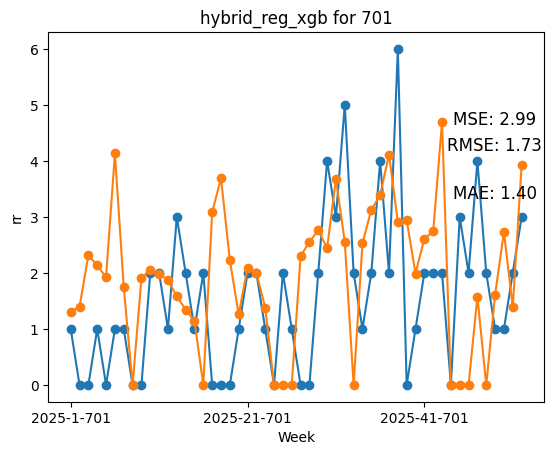

nrmse: 1.1
MSE test: 2.99
RMSE test: 1.729
RMSE train: 0.684
MSE train: 0.467
H4 for 701 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.75      1.00      0.86        39

    accuracy                           0.75        52
   macro avg       0.38      0.50      0.43        52
weighted avg       0.56      0.75      0.64        52

(52,)
(52, 108)


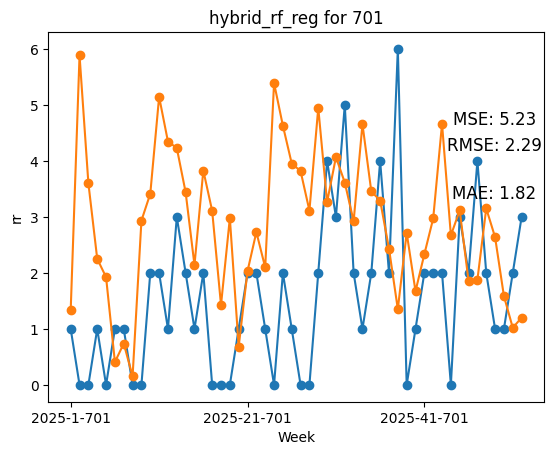

nrmse: 1.45
MSE test: 5.228
RMSE test: 2.287
RMSE train: 6.053
MSE train: 36.634
H5 for 701 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.75      1.00      0.86        39

    accuracy                           0.75        52
   macro avg       0.38      0.50      0.43        52
weighted avg       0.56      0.75      0.64        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


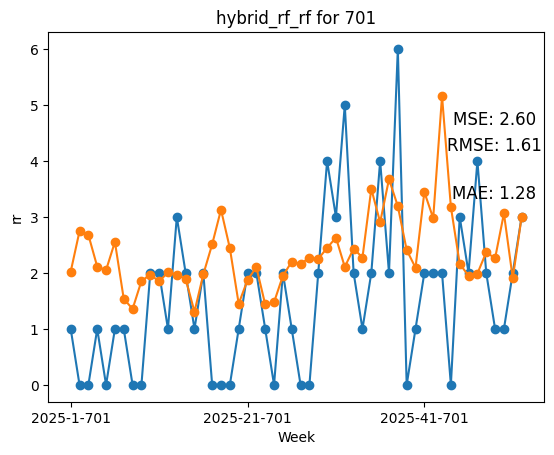

nrmse: 1.02
MSE test: 2.599
RMSE test: 1.612
RMSE train: 4.052
MSE train: 16.419
H6 for 701 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.75      1.00      0.86        39

    accuracy                           0.75        52
   macro avg       0.38      0.50      0.43        52
weighted avg       0.56      0.75      0.64        52

(52,)
(52, 108)


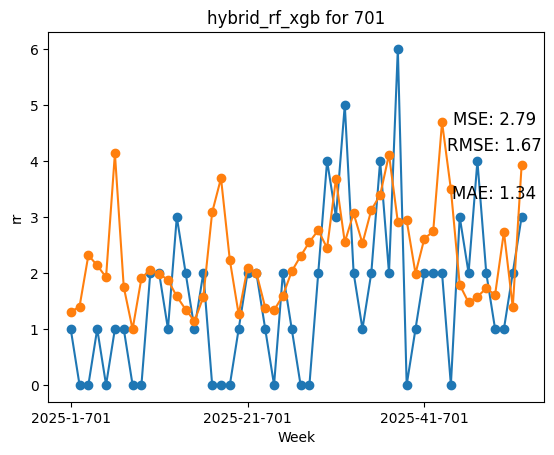

nrmse: 1.06
MSE test: 2.785
RMSE test: 1.669
RMSE train: 0.684
MSE train: 0.467
H7 for 701 at mediano
              precision    recall  f1-score   support

           0       0.25      0.08      0.12        13
           1       0.75      0.92      0.83        39

    accuracy                           0.71        52
   macro avg       0.50      0.50      0.47        52
weighted avg       0.62      0.71      0.65        52

(52,)
(52, 108)


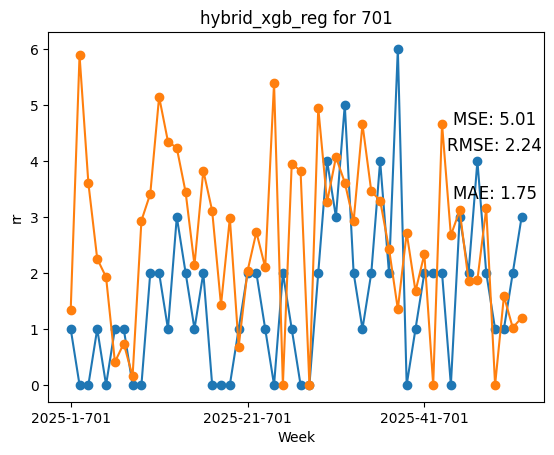

nrmse: 1.42
MSE test: 5.012
RMSE test: 2.239
RMSE train: 6.053
MSE train: 36.634
H8 for 701 at mediano
              precision    recall  f1-score   support

           0       0.25      0.08      0.12        13
           1       0.75      0.92      0.83        39

    accuracy                           0.71        52
   macro avg       0.50      0.50      0.47        52
weighted avg       0.62      0.71      0.65        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


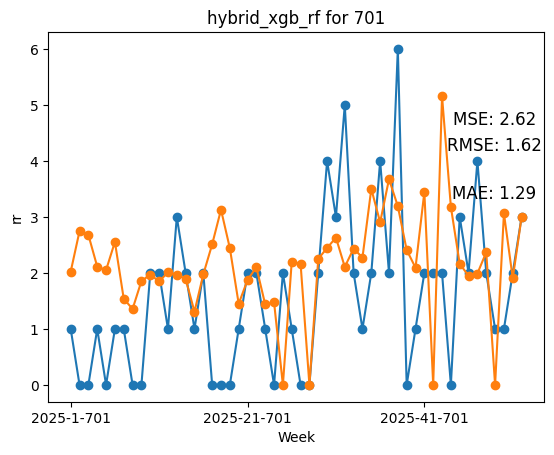

nrmse: 1.03
MSE test: 2.624
RMSE test: 1.62
RMSE train: 4.052
MSE train: 16.419
H9 for 701 at mediano
              precision    recall  f1-score   support

           0       0.25      0.08      0.12        13
           1       0.75      0.92      0.83        39

    accuracy                           0.71        52
   macro avg       0.50      0.50      0.47        52
weighted avg       0.62      0.71      0.65        52

(52,)
(52, 108)


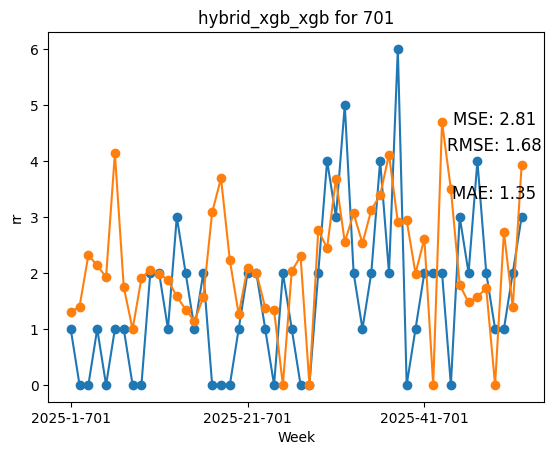

nrmse: 1.06
MSE test: 2.812
RMSE test: 1.677
RMSE train: 0.684
MSE train: 0.467
linear for 503 at mediano


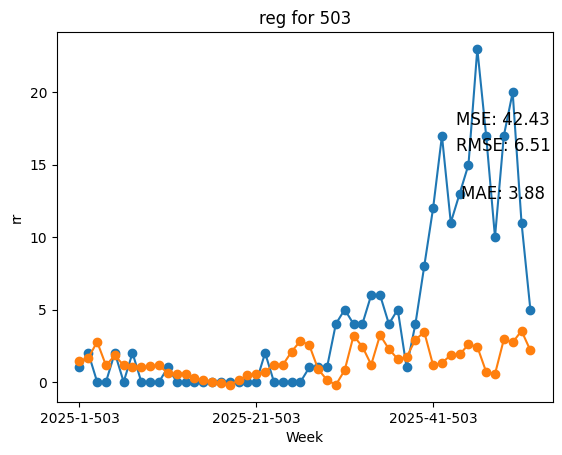

nrmse: 1.44

            RMSE train reg: 9.615
            MSE train reg: 92.447
                


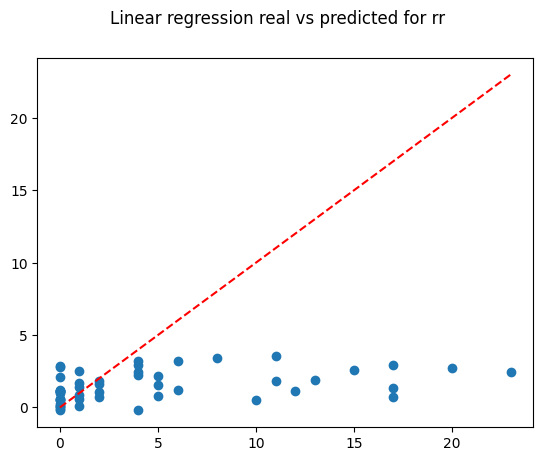

RF for 503 at mediano


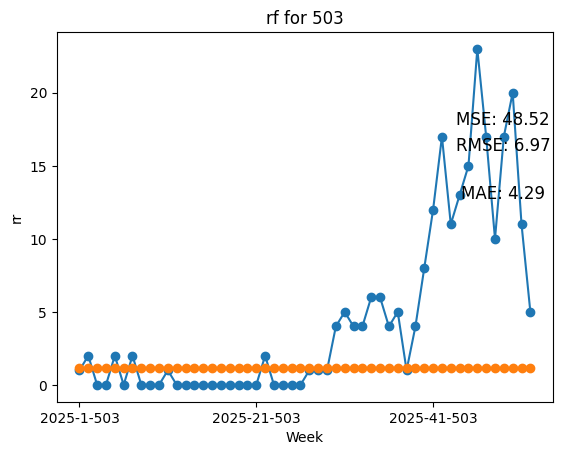

nrmse: 1.54

            RMSE train rf: 11.635
            MSE train rf: 135.365
                


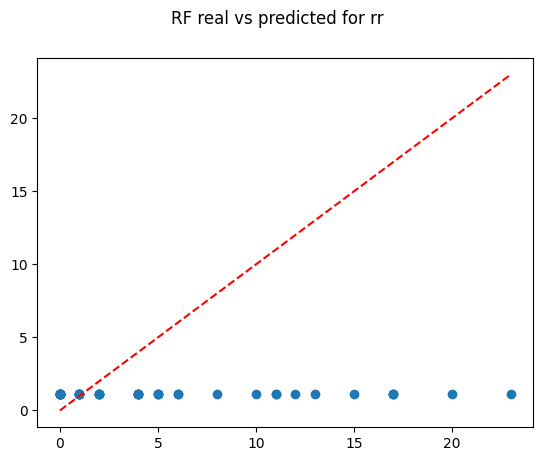

XGB for 503 at mediano


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:12:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


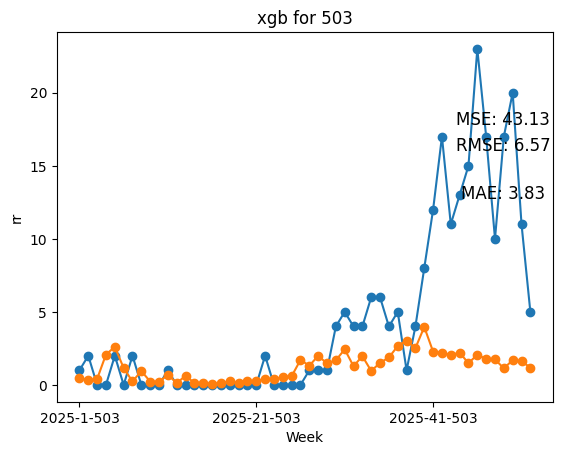

nrmse: 1.45

            RMSE train xgb: 1.433
            MSE train xgb: 2.053
                


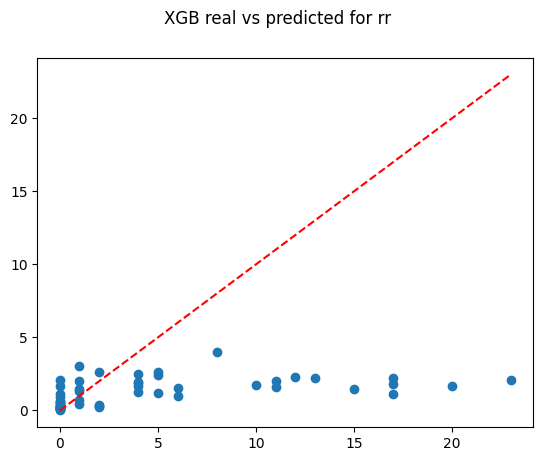

H1 for 503 at mediano
              precision    recall  f1-score   support

           0       0.67      0.60      0.63        20
           1       0.76      0.81      0.79        32

    accuracy                           0.73        52
   macro avg       0.72      0.71      0.71        52
weighted avg       0.73      0.73      0.73        52

(52,)
(52, 108)


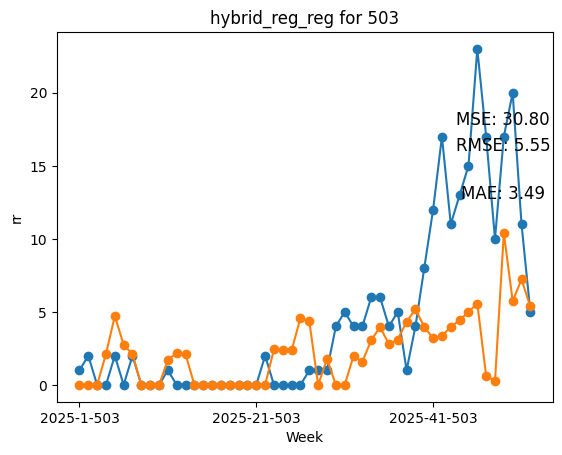

nrmse: 1.23
MSE test: 30.802
RMSE test: 5.55
RMSE train: 6.868
MSE train: 47.167
H2 for 503 at mediano
              precision    recall  f1-score   support

           0       0.67      0.60      0.63        20
           1       0.76      0.81      0.79        32

    accuracy                           0.73        52
   macro avg       0.72      0.71      0.71        52
weighted avg       0.73      0.73      0.73        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


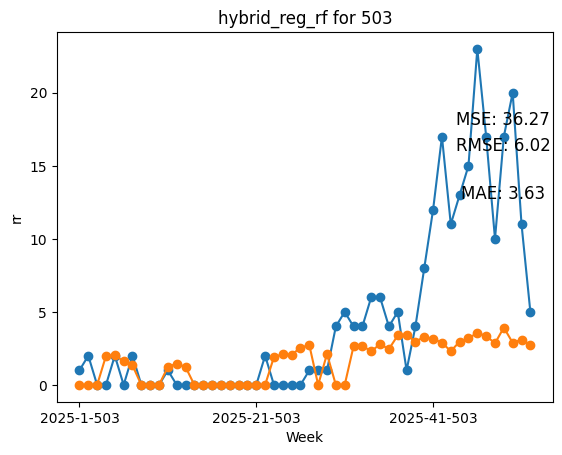

nrmse: 1.33
MSE test: 36.268
RMSE test: 6.022
RMSE train: 4.749
MSE train: 22.553
H3 for 503 at mediano
              precision    recall  f1-score   support

           0       0.67      0.60      0.63        20
           1       0.76      0.81      0.79        32

    accuracy                           0.73        52
   macro avg       0.72      0.71      0.71        52
weighted avg       0.73      0.73      0.73        52

(52,)
(52, 108)


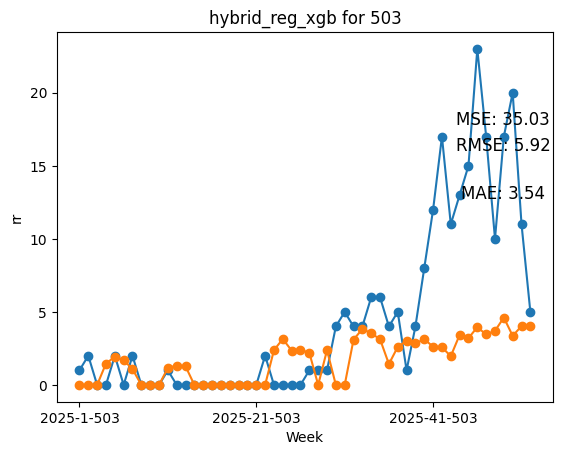

nrmse: 1.31
MSE test: 35.028
RMSE test: 5.918
RMSE train: 0.542
MSE train: 0.293
H4 for 503 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        20
           1       0.88      0.88      0.88        32

    accuracy                           0.85        52
   macro avg       0.84      0.84      0.84        52
weighted avg       0.85      0.85      0.85        52

(52,)
(52, 108)


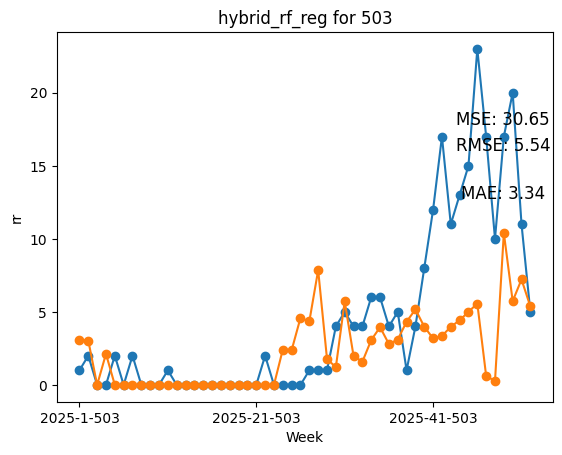

nrmse: 1.23
MSE test: 30.651
RMSE test: 5.536
RMSE train: 6.868
MSE train: 47.167
H5 for 503 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        20
           1       0.88      0.88      0.88        32

    accuracy                           0.85        52
   macro avg       0.84      0.84      0.84        52
weighted avg       0.85      0.85      0.85        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


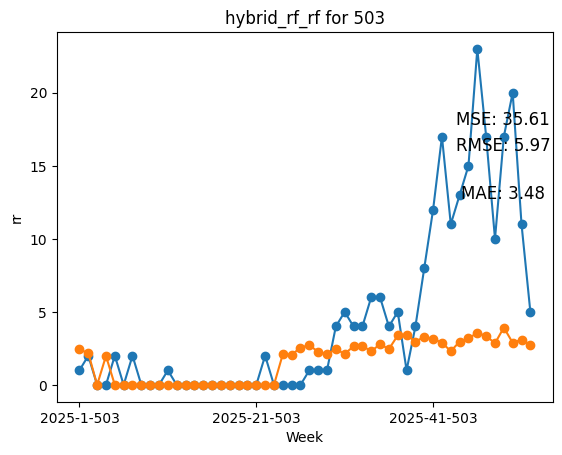

nrmse: 1.32
MSE test: 35.612
RMSE test: 5.968
RMSE train: 4.749
MSE train: 22.553
H6 for 503 at mediano
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        20
           1       0.88      0.88      0.88        32

    accuracy                           0.85        52
   macro avg       0.84      0.84      0.84        52
weighted avg       0.85      0.85      0.85        52

(52,)
(52, 108)


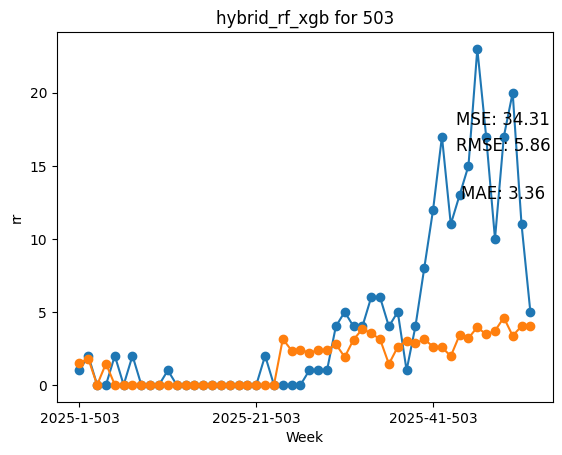

nrmse: 1.3
MSE test: 34.305
RMSE test: 5.857
RMSE train: 0.542
MSE train: 0.293
H7 for 503 at mediano
              precision    recall  f1-score   support

           0       0.83      0.75      0.79        20
           1       0.85      0.91      0.88        32

    accuracy                           0.85        52
   macro avg       0.84      0.83      0.83        52
weighted avg       0.85      0.85      0.84        52

(52,)
(52, 108)


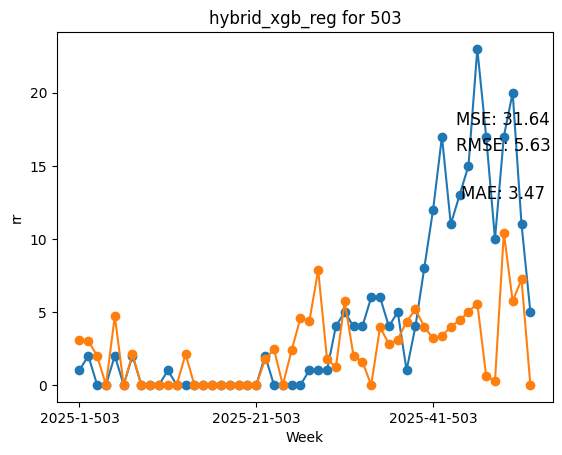

nrmse: 1.24
MSE test: 31.644
RMSE test: 5.625
RMSE train: 6.868
MSE train: 47.167
H8 for 503 at mediano
              precision    recall  f1-score   support

           0       0.83      0.75      0.79        20
           1       0.85      0.91      0.88        32

    accuracy                           0.85        52
   macro avg       0.84      0.83      0.83        52
weighted avg       0.85      0.85      0.84        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 108)


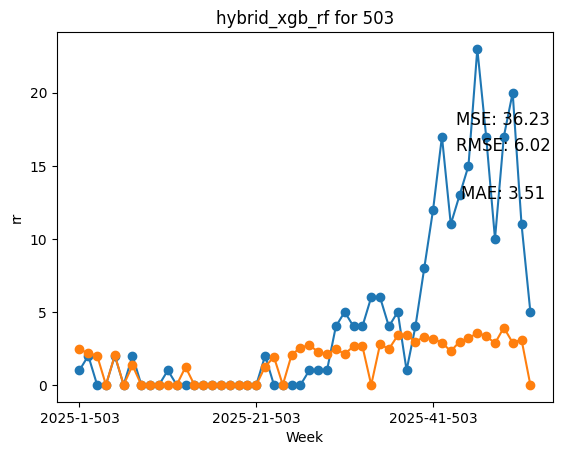

nrmse: 1.33
MSE test: 36.23
RMSE test: 6.019
RMSE train: 4.749
MSE train: 22.553
H9 for 503 at mediano
              precision    recall  f1-score   support

           0       0.83      0.75      0.79        20
           1       0.85      0.91      0.88        32

    accuracy                           0.85        52
   macro avg       0.84      0.83      0.83        52
weighted avg       0.85      0.85      0.84        52

(52,)
(52, 108)


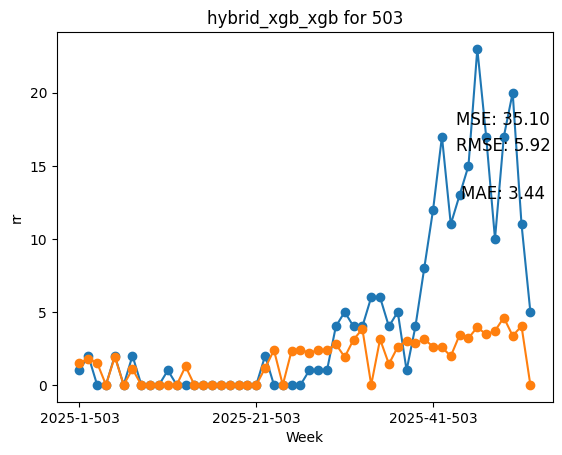

nrmse: 1.31
MSE test: 35.096
RMSE test: 5.924
RMSE train: 0.542
MSE train: 0.293


In [6]:
compare_rr(df, "201", "mediano")
compare_rr(df, "603", "mediano")
compare_rr(df, "501", "mediano")
compare_rr(df, "701", "mediano")
compare_rr(df, "503", "mediano")

linear for 201 at todos


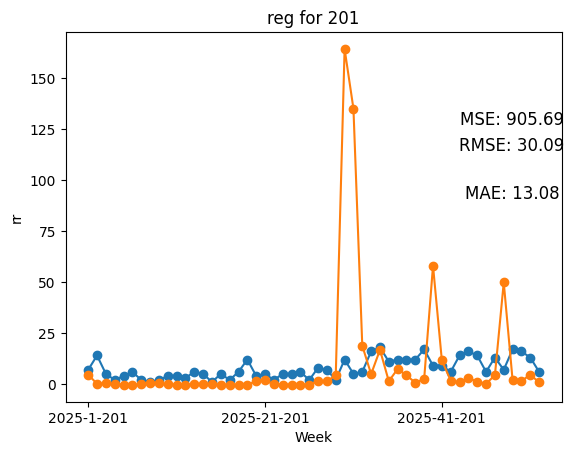

nrmse: 3.87

            RMSE train reg: 41.472
            MSE train reg: 1719.954
                


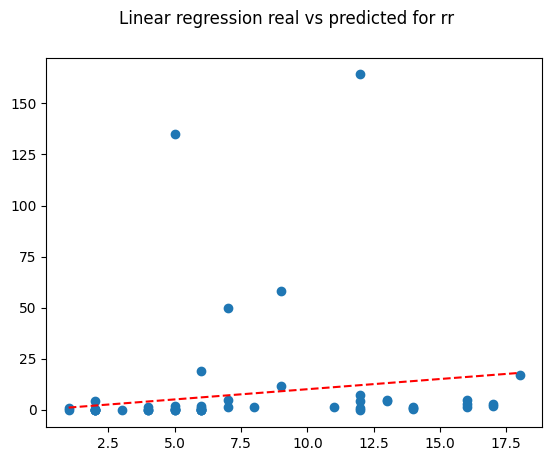

RF for 201 at todos


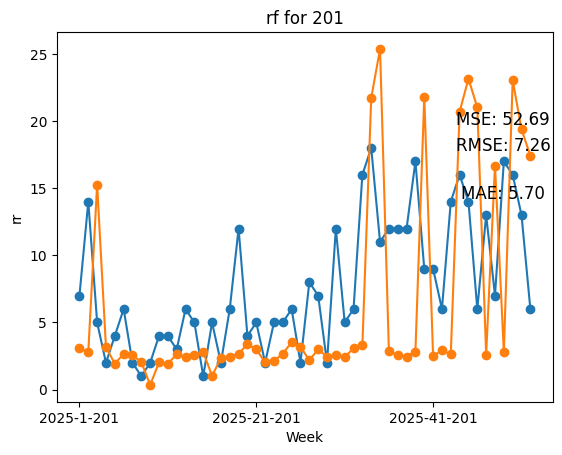

nrmse: 0.93

            RMSE train rf: 14.624
            MSE train rf: 213.862
                


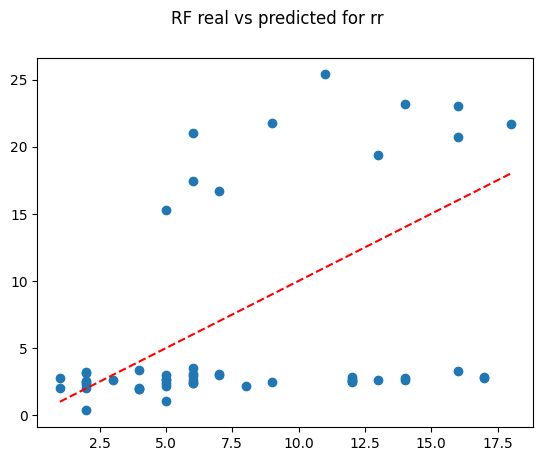

XGB for 201 at todos


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [17:55:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


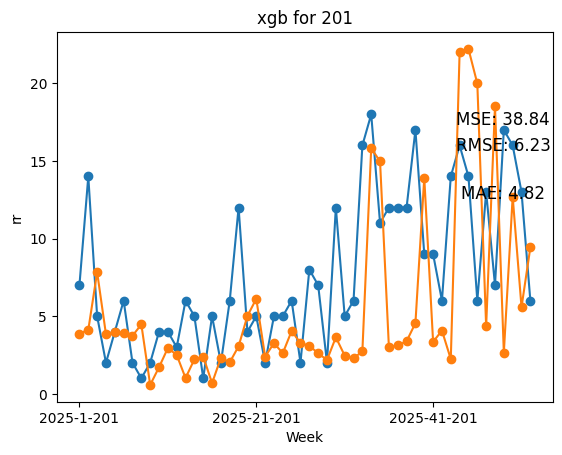

nrmse: 0.8

            RMSE train xgb: 3.21
            MSE train xgb: 10.303
                


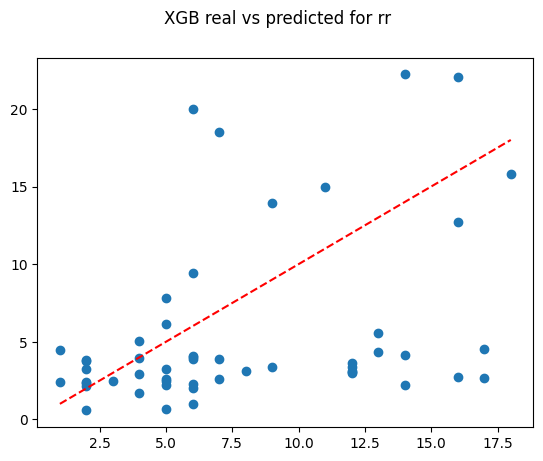

H1 for 201 at todos
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 212)


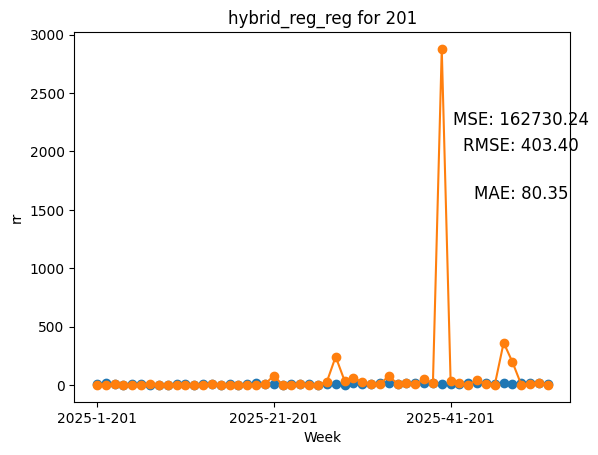

nrmse: 51.92
MSE test: 162730.241
RMSE test: 403.398
RMSE train: 15.775
MSE train: 248.861
H2 for 201 at todos
Only one class present in test set for classification. Skipping classification step.
Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


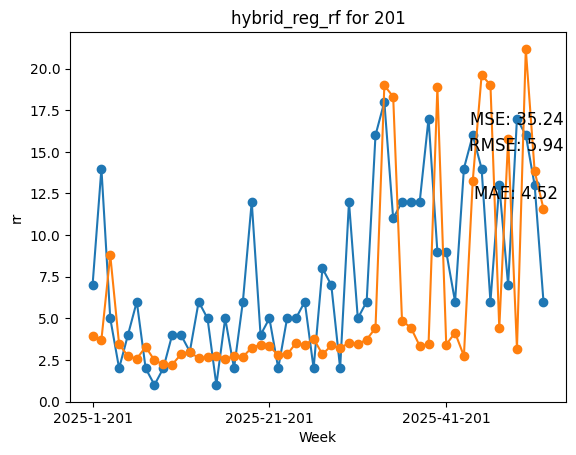

nrmse: 0.76
MSE test: 35.239
RMSE test: 5.936
RMSE train: 14.393
MSE train: 207.159
H3 for 201 at todos
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 212)


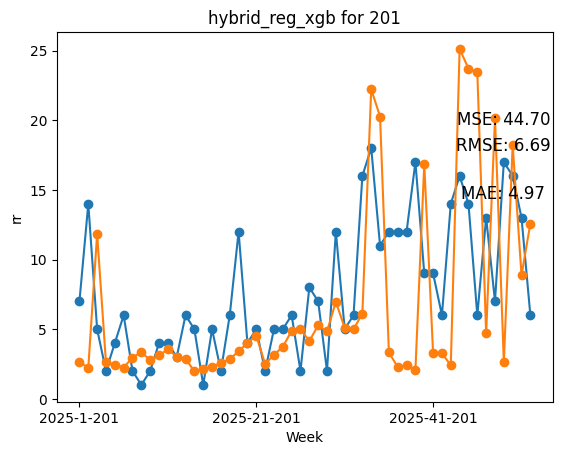

nrmse: 0.86
MSE test: 44.698
RMSE test: 6.686
RMSE train: 1.603
MSE train: 2.571
H4 for 201 at todos
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 212)


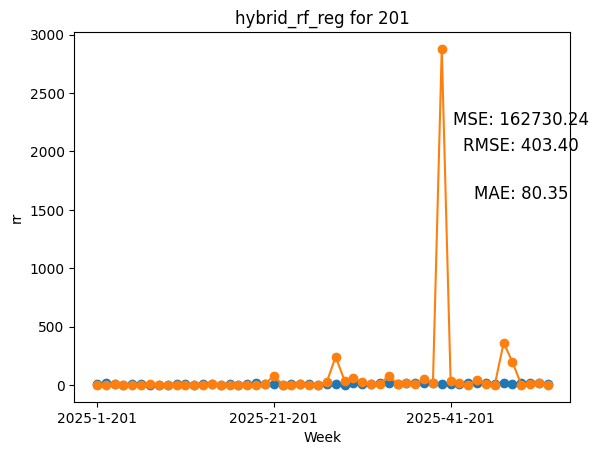

nrmse: 51.92
MSE test: 162730.241
RMSE test: 403.398
RMSE train: 15.775
MSE train: 248.861
H5 for 201 at todos
Only one class present in test set for classification. Skipping classification step.
Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


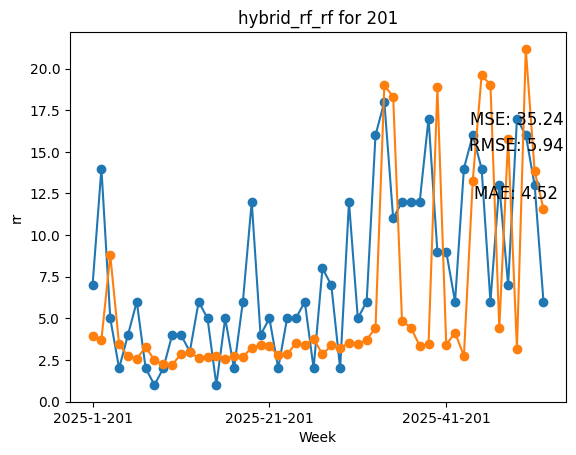

nrmse: 0.76
MSE test: 35.239
RMSE test: 5.936
RMSE train: 14.393
MSE train: 207.159
H6 for 201 at todos
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 212)


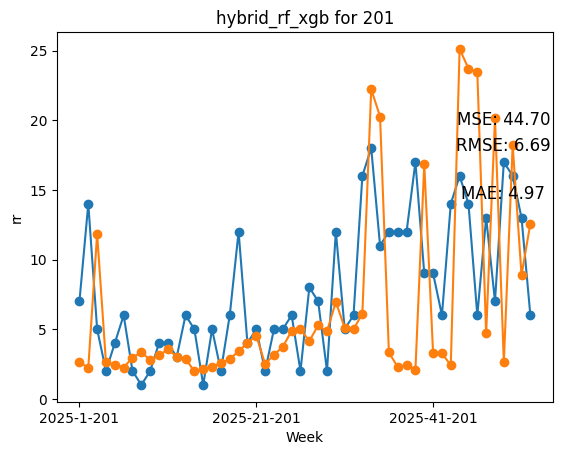

nrmse: 0.86
MSE test: 44.698
RMSE test: 6.686
RMSE train: 1.603
MSE train: 2.571
H7 for 201 at todos
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 212)


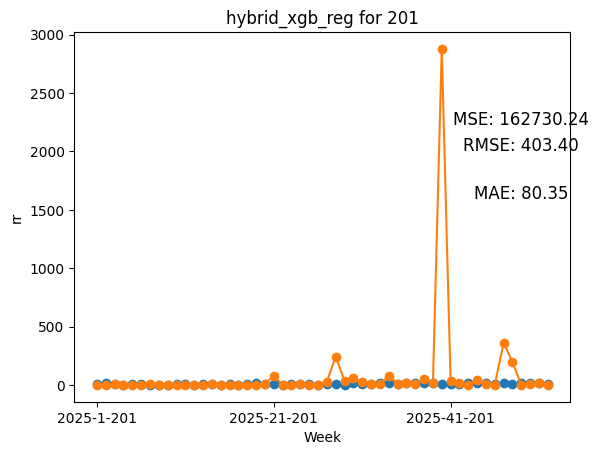

nrmse: 51.92
MSE test: 162730.241
RMSE test: 403.398
RMSE train: 15.775
MSE train: 248.861
H8 for 201 at todos
Only one class present in test set for classification. Skipping classification step.
Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


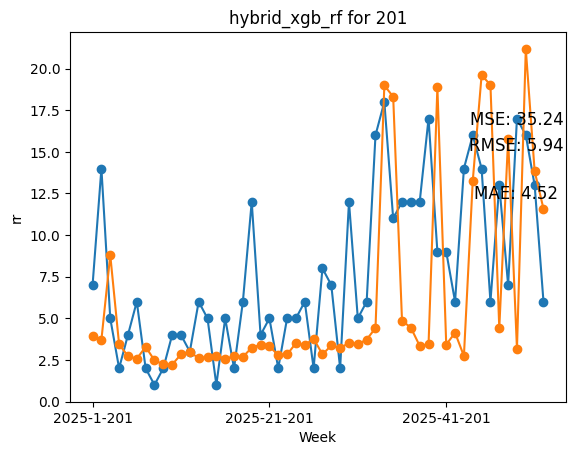

nrmse: 0.76
MSE test: 35.239
RMSE test: 5.936
RMSE train: 14.393
MSE train: 207.159
H9 for 201 at todos
Only one class present in test set for classification. Skipping classification step.
(52,)
(52, 212)


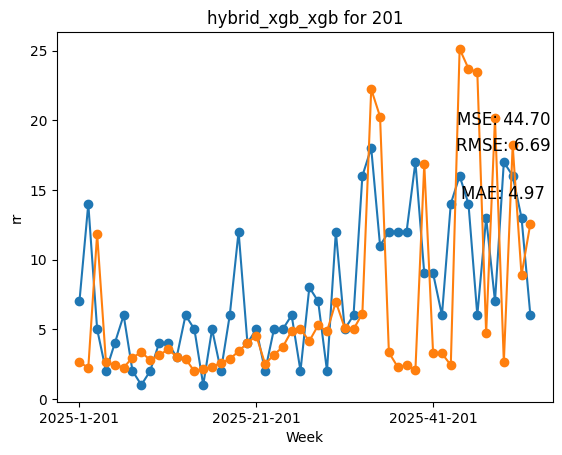

nrmse: 0.86
MSE test: 44.698
RMSE test: 6.686
RMSE train: 1.603
MSE train: 2.571
linear for 603 at todos


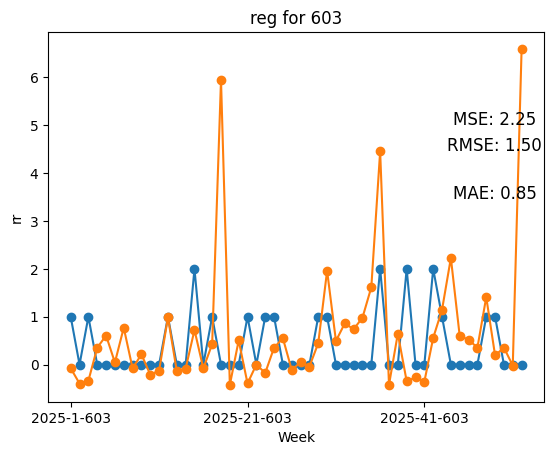

nrmse: 3.9

            RMSE train reg: 14.114
            MSE train reg: 199.194
                


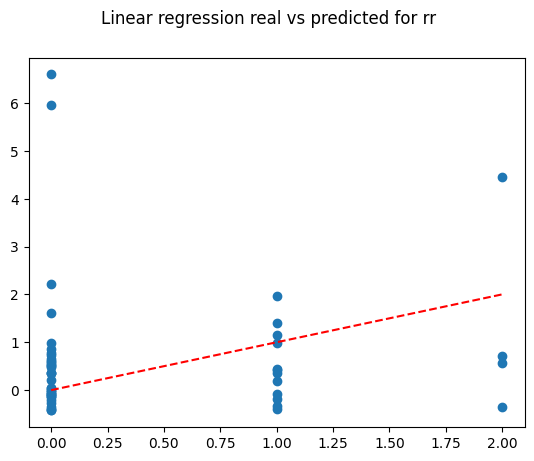

RF for 603 at todos


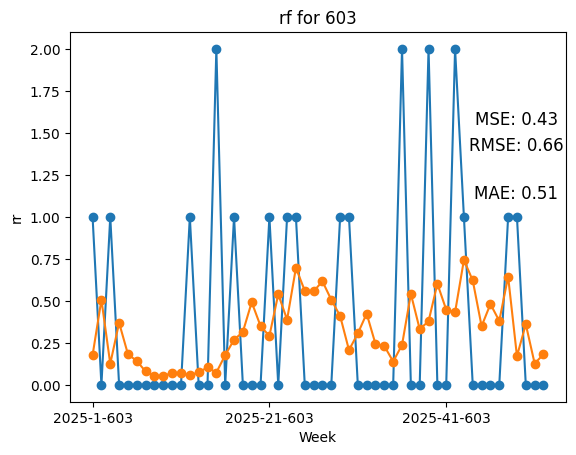

nrmse: 1.71

            RMSE train rf: 4.296
            MSE train rf: 18.455
                


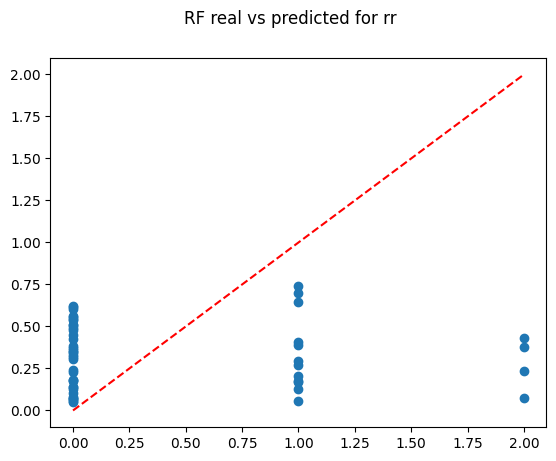

XGB for 603 at todos


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [17:58:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


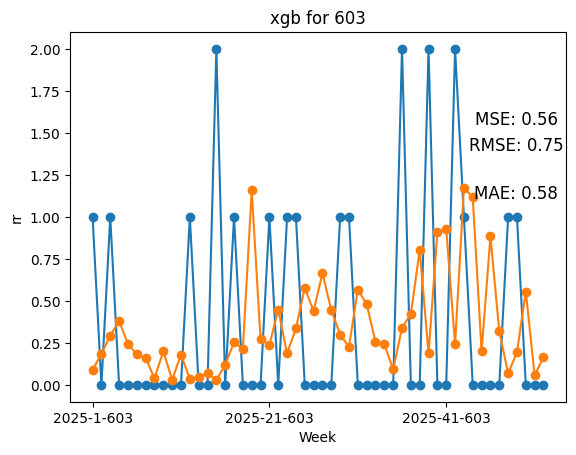

nrmse: 1.94

            RMSE train xgb: 1.254
            MSE train xgb: 1.572
                


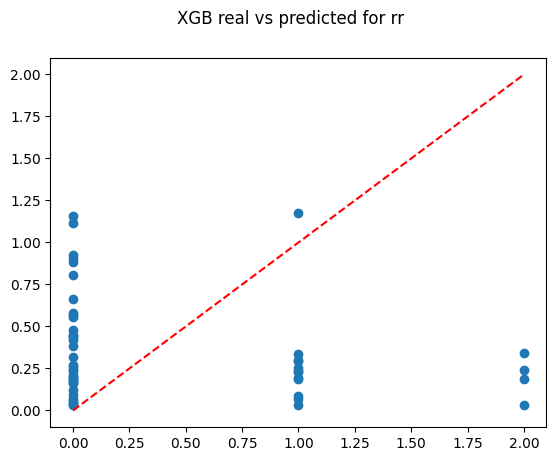

H1 for 603 at todos
              precision    recall  f1-score   support

           0       0.74      0.78      0.76        36
           1       0.43      0.38      0.40        16

    accuracy                           0.65        52
   macro avg       0.58      0.58      0.58        52
weighted avg       0.64      0.65      0.65        52

(52,)
(52, 212)


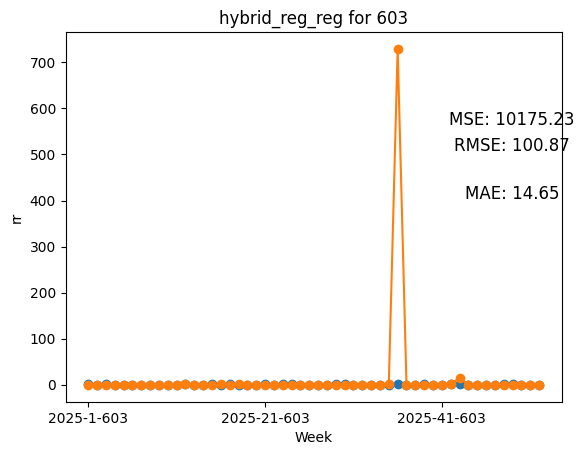

nrmse: 262.27
MSE test: 10175.228
RMSE test: 100.872
RMSE train: 2.557
MSE train: 6.538
H2 for 603 at todos
              precision    recall  f1-score   support

           0       0.74      0.78      0.76        36
           1       0.43      0.38      0.40        16

    accuracy                           0.65        52
   macro avg       0.58      0.58      0.58        52
weighted avg       0.64      0.65      0.65        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


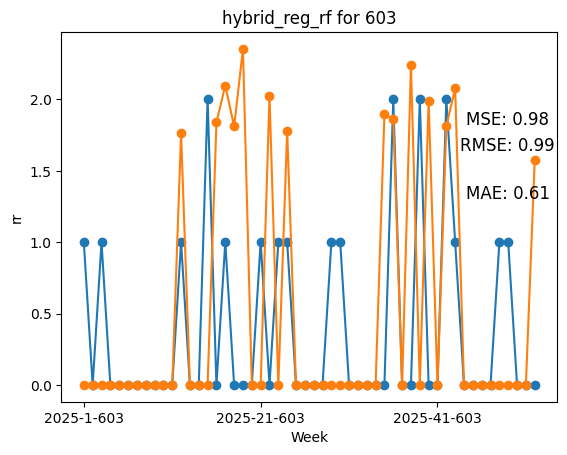

nrmse: 2.58
MSE test: 0.981
RMSE test: 0.99
RMSE train: 4.401
MSE train: 19.372
H3 for 603 at todos
              precision    recall  f1-score   support

           0       0.74      0.78      0.76        36
           1       0.43      0.38      0.40        16

    accuracy                           0.65        52
   macro avg       0.58      0.58      0.58        52
weighted avg       0.64      0.65      0.65        52

(52,)
(52, 212)


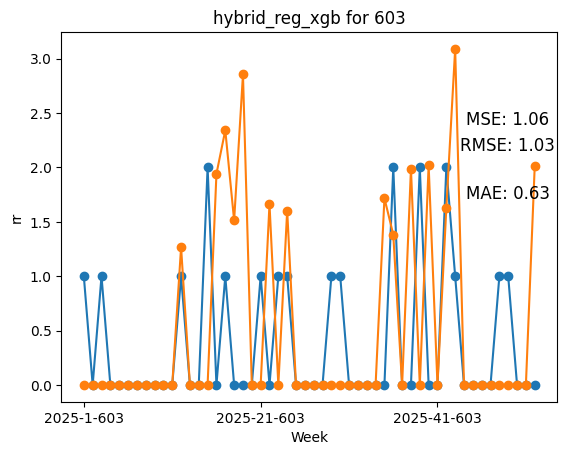

nrmse: 2.68
MSE test: 1.06
RMSE test: 1.03
RMSE train: 0.356
MSE train: 0.127
H4 for 603 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.72      0.58      0.65        36
           1       0.35      0.50      0.41        16

    accuracy                           0.56        52
   macro avg       0.54      0.54      0.53        52
weighted avg       0.61      0.56      0.57        52

(52,)
(52, 212)


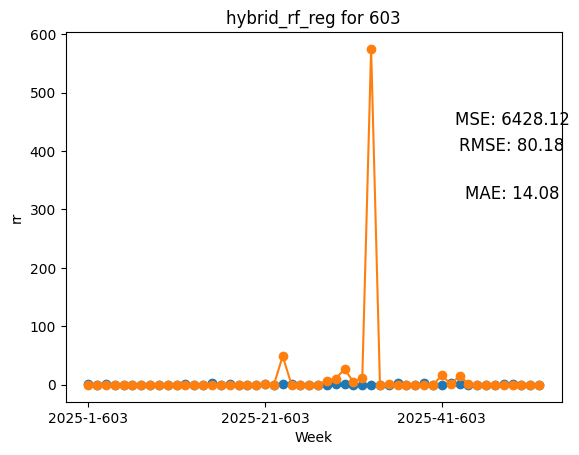

nrmse: 208.46
MSE test: 6428.121
RMSE test: 80.176
RMSE train: 2.557
MSE train: 6.538
H5 for 603 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.72      0.58      0.65        36
           1       0.35      0.50      0.41        16

    accuracy                           0.56        52
   macro avg       0.54      0.54      0.53        52
weighted avg       0.61      0.56      0.57        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


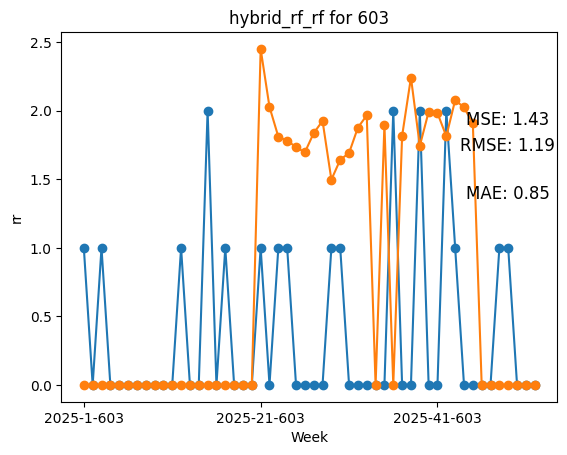

nrmse: 3.11
MSE test: 1.427
RMSE test: 1.194
RMSE train: 4.401
MSE train: 19.372
H6 for 603 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.72      0.58      0.65        36
           1       0.35      0.50      0.41        16

    accuracy                           0.56        52
   macro avg       0.54      0.54      0.53        52
weighted avg       0.61      0.56      0.57        52

(52,)
(52, 212)


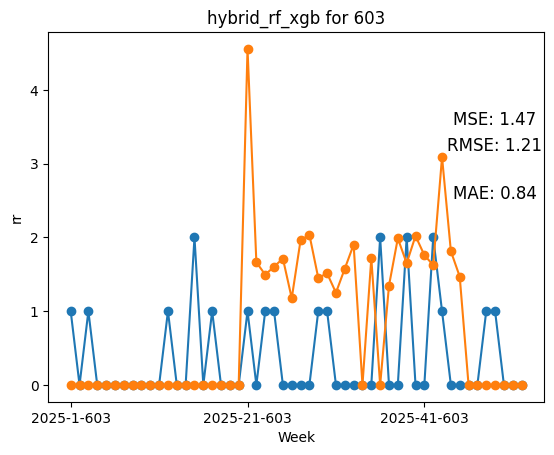

nrmse: 3.15
MSE test: 1.469
RMSE test: 1.212
RMSE train: 0.356
MSE train: 0.127
H7 for 603 at todos
              precision    recall  f1-score   support

           0       0.70      0.83      0.76        36
           1       0.33      0.19      0.24        16

    accuracy                           0.63        52
   macro avg       0.52      0.51      0.50        52
weighted avg       0.59      0.63      0.60        52

(52,)
(52, 212)


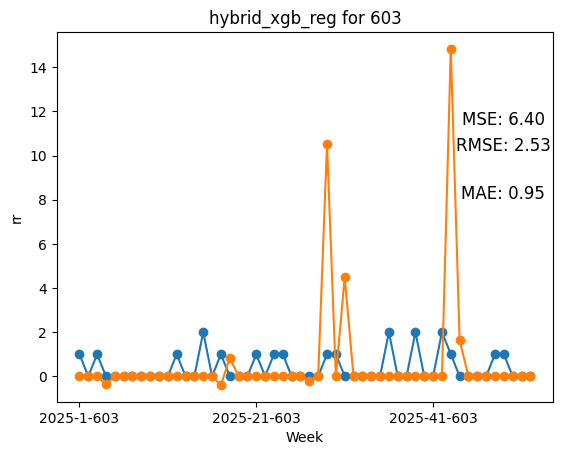

nrmse: 6.58
MSE test: 6.401
RMSE test: 2.53
RMSE train: 2.557
MSE train: 6.538
H8 for 603 at todos
              precision    recall  f1-score   support

           0       0.70      0.83      0.76        36
           1       0.33      0.19      0.24        16

    accuracy                           0.63        52
   macro avg       0.52      0.51      0.50        52
weighted avg       0.59      0.63      0.60        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


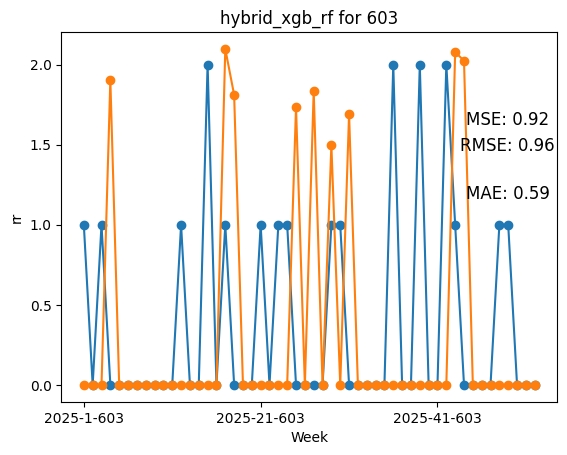

nrmse: 2.49
MSE test: 0.92
RMSE test: 0.959
RMSE train: 4.401
MSE train: 19.372
H9 for 603 at todos
              precision    recall  f1-score   support

           0       0.70      0.83      0.76        36
           1       0.33      0.19      0.24        16

    accuracy                           0.63        52
   macro avg       0.52      0.51      0.50        52
weighted avg       0.59      0.63      0.60        52

(52,)
(52, 212)


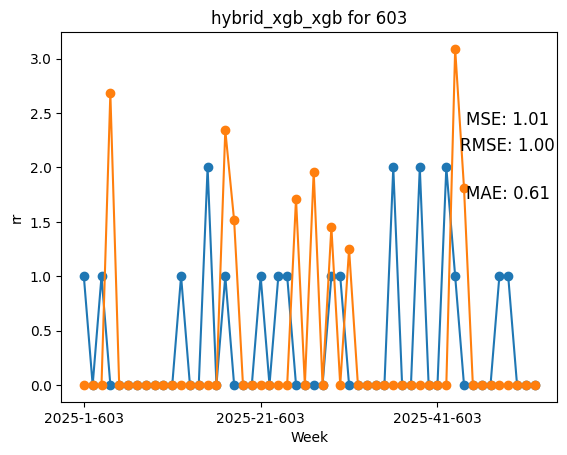

nrmse: 2.61
MSE test: 1.009
RMSE test: 1.005
RMSE train: 0.356
MSE train: 0.127
linear for 501 at todos


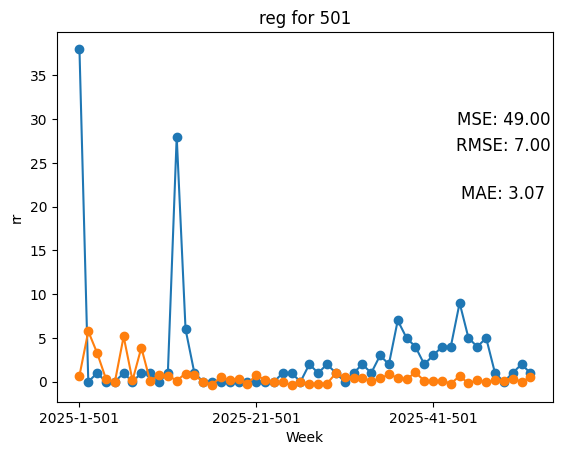

nrmse: 2.39

            RMSE train reg: 6.018
            MSE train reg: 36.214
                


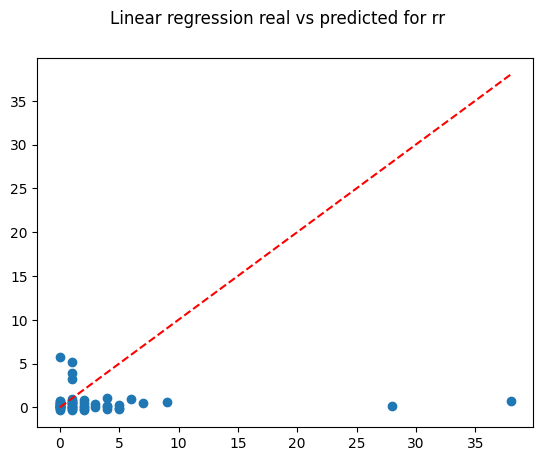

RF for 501 at todos


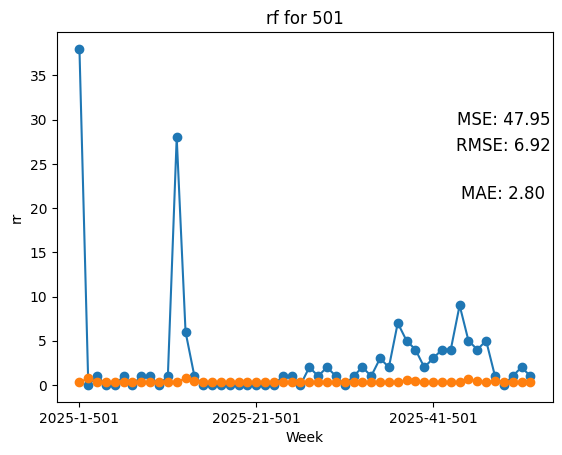

nrmse: 2.37

            RMSE train rf: 13.613
            MSE train rf: 185.323
                


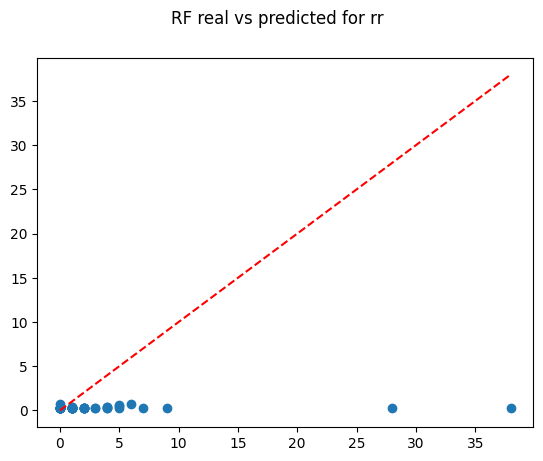

XGB for 501 at todos


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:00:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


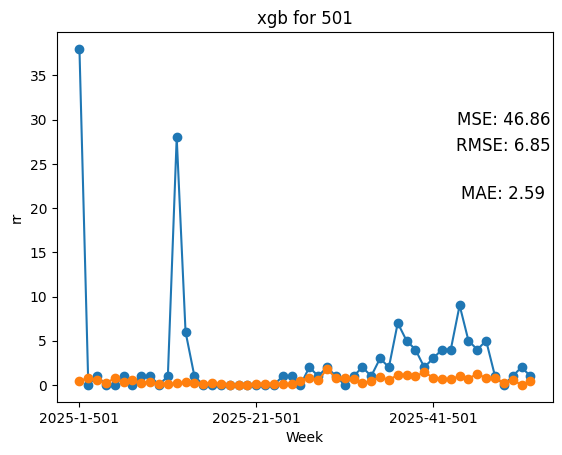

nrmse: 2.34

            RMSE train xgb: 1.27
            MSE train xgb: 1.612
                


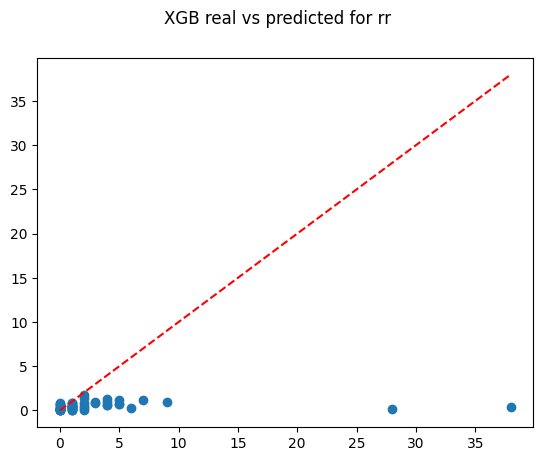

H1 for 501 at todos
              precision    recall  f1-score   support

           0       0.33      0.65      0.44        17
           1       0.68      0.37      0.48        35

    accuracy                           0.46        52
   macro avg       0.51      0.51      0.46        52
weighted avg       0.57      0.46      0.47        52

(52,)
(52, 212)


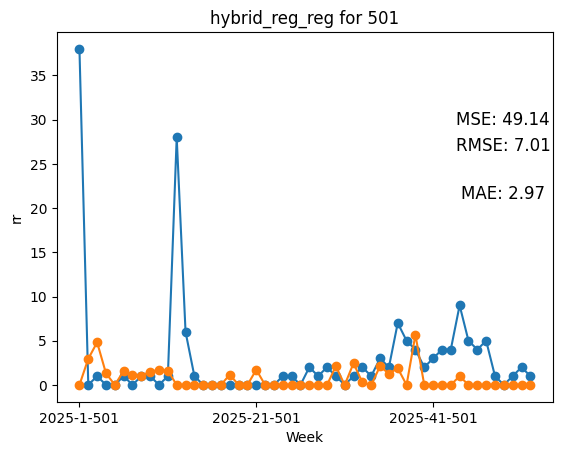

nrmse: 2.4
MSE test: 49.137
RMSE test: 7.01
RMSE train: 0.0
MSE train: 0.0
H2 for 501 at todos
              precision    recall  f1-score   support

           0       0.33      0.65      0.44        17
           1       0.68      0.37      0.48        35

    accuracy                           0.46        52
   macro avg       0.51      0.51      0.46        52
weighted avg       0.57      0.46      0.47        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


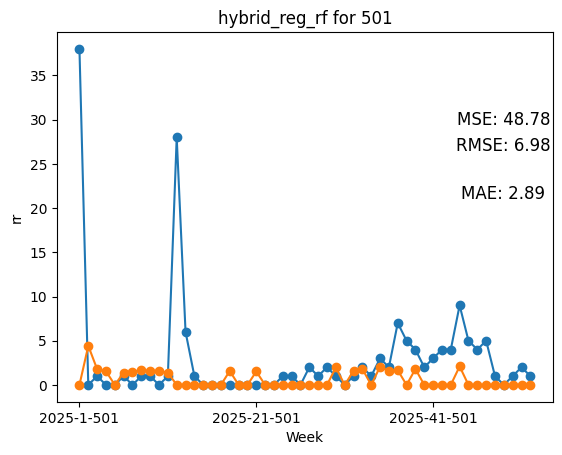

nrmse: 2.39
MSE test: 48.776
RMSE test: 6.984
RMSE train: 11.228
MSE train: 126.078
H3 for 501 at todos
              precision    recall  f1-score   support

           0       0.33      0.65      0.44        17
           1       0.68      0.37      0.48        35

    accuracy                           0.46        52
   macro avg       0.51      0.51      0.46        52
weighted avg       0.57      0.46      0.47        52

(52,)
(52, 212)


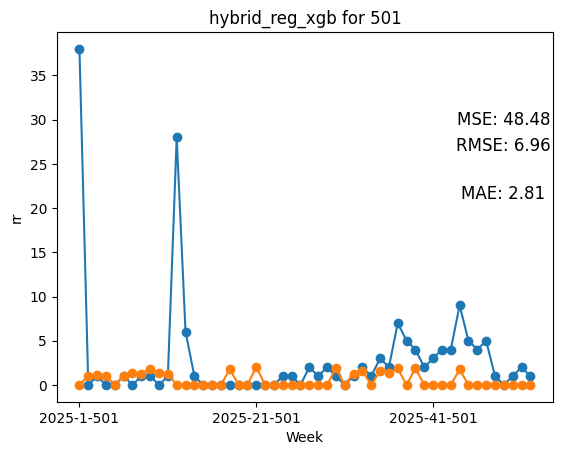

nrmse: 2.38
MSE test: 48.48
RMSE test: 6.963
RMSE train: 0.399
MSE train: 0.159
H4 for 501 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.33      0.88      0.48        17
           1       0.67      0.11      0.20        35

    accuracy                           0.37        52
   macro avg       0.50      0.50      0.34        52
weighted avg       0.56      0.37      0.29        52

(52,)
(52, 212)


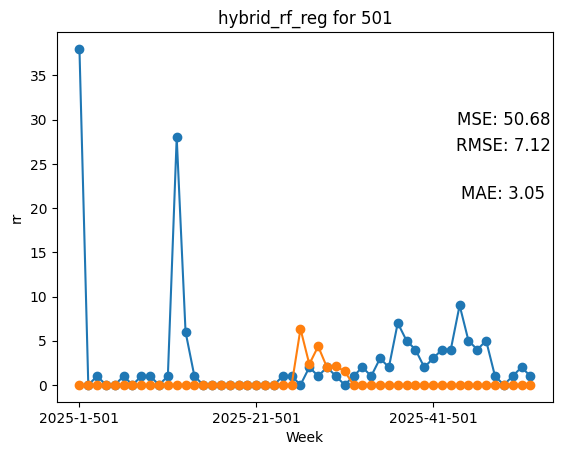

nrmse: 2.44
MSE test: 50.676
RMSE test: 7.119
RMSE train: 0.0
MSE train: 0.0
H5 for 501 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.33      0.88      0.48        17
           1       0.67      0.11      0.20        35

    accuracy                           0.37        52
   macro avg       0.50      0.50      0.34        52
weighted avg       0.56      0.37      0.29        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


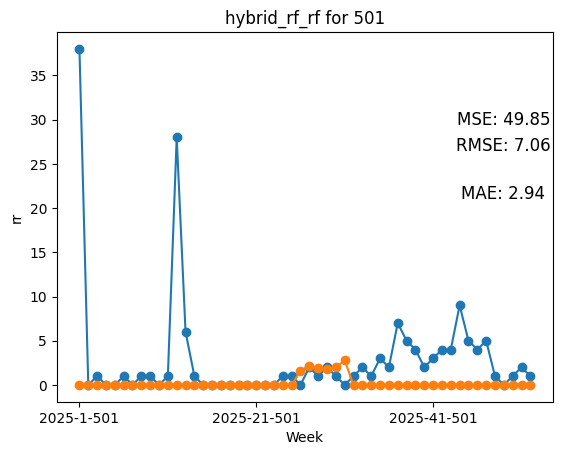

nrmse: 2.42
MSE test: 49.851
RMSE test: 7.061
RMSE train: 11.228
MSE train: 126.078
H6 for 501 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.33      0.88      0.48        17
           1       0.67      0.11      0.20        35

    accuracy                           0.37        52
   macro avg       0.50      0.50      0.34        52
weighted avg       0.56      0.37      0.29        52

(52,)
(52, 212)


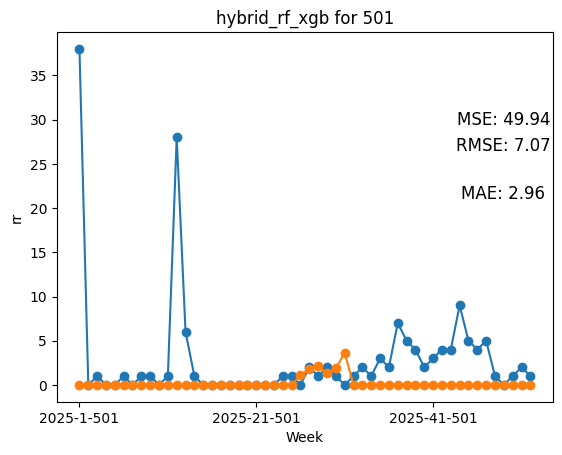

nrmse: 2.42
MSE test: 49.942
RMSE test: 7.067
RMSE train: 0.399
MSE train: 0.159
H7 for 501 at todos
              precision    recall  f1-score   support

           0       0.42      0.88      0.57        17
           1       0.88      0.40      0.55        35

    accuracy                           0.56        52
   macro avg       0.65      0.64      0.56        52
weighted avg       0.73      0.56      0.55        52

(52,)
(52, 212)


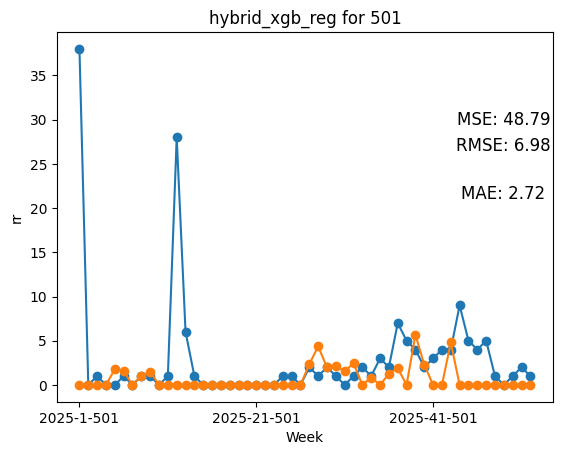

nrmse: 2.39
MSE test: 48.79
RMSE test: 6.985
RMSE train: 0.0
MSE train: 0.0
H8 for 501 at todos
              precision    recall  f1-score   support

           0       0.42      0.88      0.57        17
           1       0.88      0.40      0.55        35

    accuracy                           0.56        52
   macro avg       0.65      0.64      0.56        52
weighted avg       0.73      0.56      0.55        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


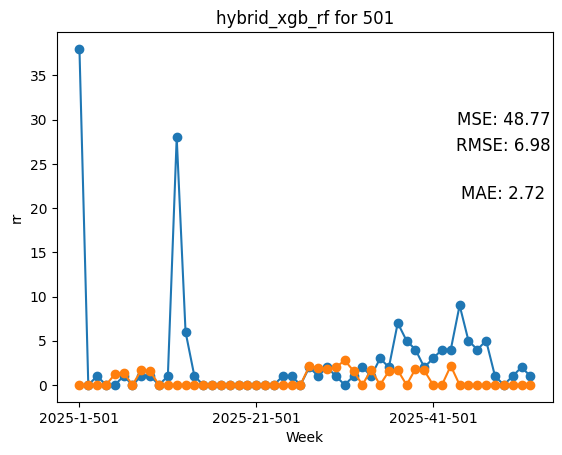

nrmse: 2.39
MSE test: 48.766
RMSE test: 6.983
RMSE train: 11.228
MSE train: 126.078
H9 for 501 at todos
              precision    recall  f1-score   support

           0       0.42      0.88      0.57        17
           1       0.88      0.40      0.55        35

    accuracy                           0.56        52
   macro avg       0.65      0.64      0.56        52
weighted avg       0.73      0.56      0.55        52

(52,)
(52, 212)


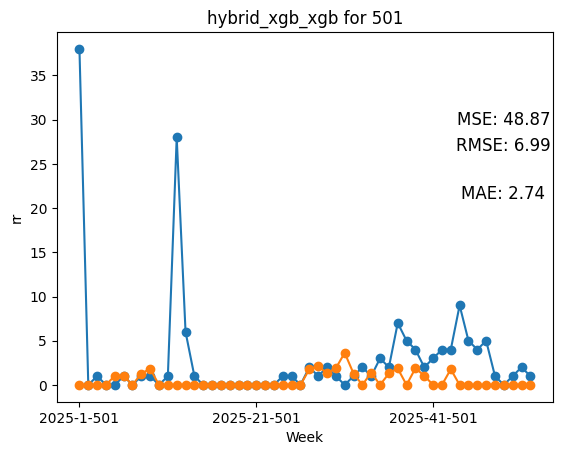

nrmse: 2.39
MSE test: 48.866
RMSE test: 6.99
RMSE train: 0.399
MSE train: 0.159
linear for 701 at todos


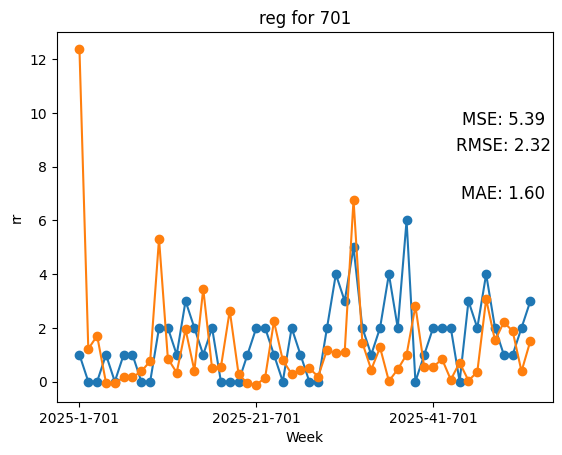

nrmse: 1.47

            RMSE train reg: 5.112
            MSE train reg: 26.133
                


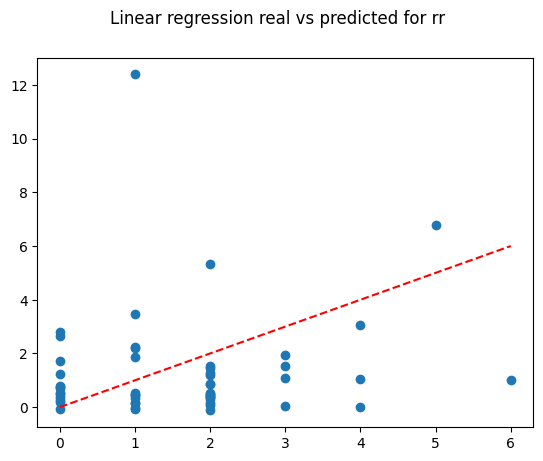

RF for 701 at todos


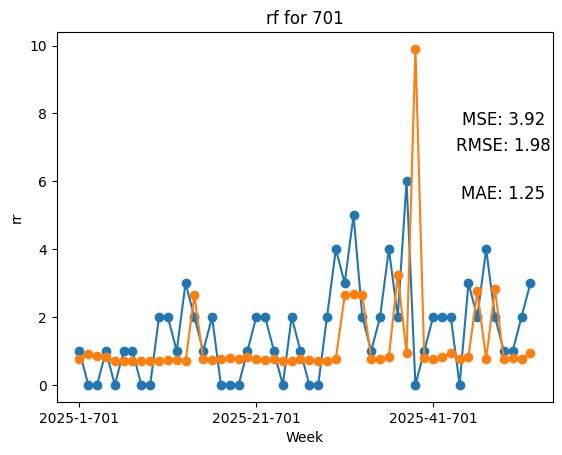

nrmse: 1.26

            RMSE train rf: 8.075
            MSE train rf: 65.211
                


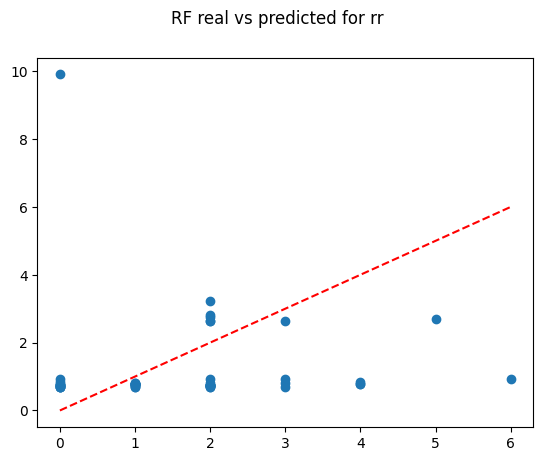

XGB for 701 at todos


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:02:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


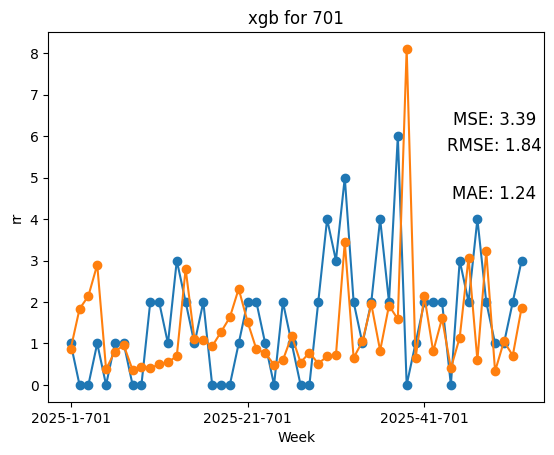

nrmse: 1.17

            RMSE train xgb: 0.804
            MSE train xgb: 0.646
                


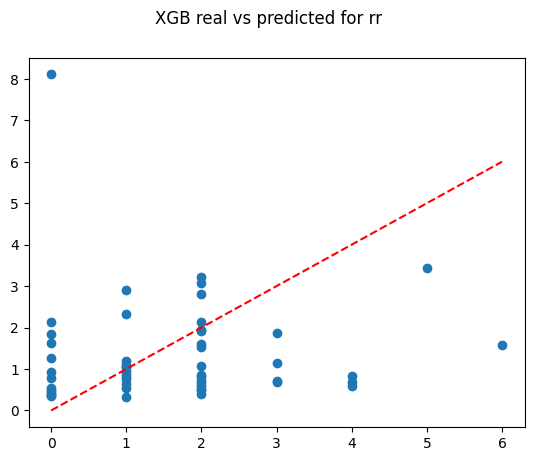

H1 for 701 at todos
              precision    recall  f1-score   support

           0       0.10      0.08      0.09        13
           1       0.71      0.77      0.74        39

    accuracy                           0.60        52
   macro avg       0.41      0.42      0.41        52
weighted avg       0.56      0.60      0.58        52

(52,)
(52, 212)


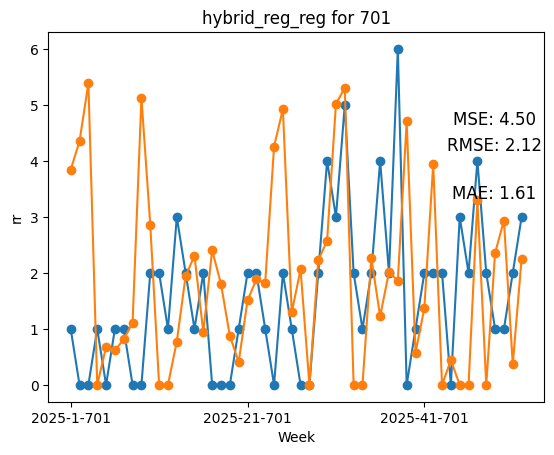

nrmse: 1.35
MSE test: 4.499
RMSE test: 2.121
RMSE train: 3.295
MSE train: 10.854
H2 for 701 at todos
              precision    recall  f1-score   support

           0       0.10      0.08      0.09        13
           1       0.71      0.77      0.74        39

    accuracy                           0.60        52
   macro avg       0.41      0.42      0.41        52
weighted avg       0.56      0.60      0.58        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


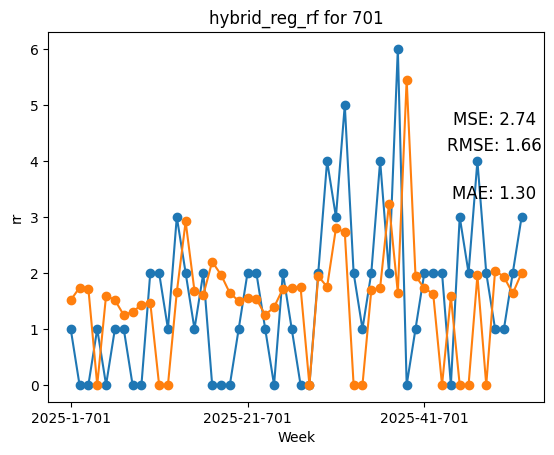

nrmse: 1.05
MSE test: 2.744
RMSE test: 1.656
RMSE train: 2.801
MSE train: 7.846
H3 for 701 at todos
              precision    recall  f1-score   support

           0       0.10      0.08      0.09        13
           1       0.71      0.77      0.74        39

    accuracy                           0.60        52
   macro avg       0.41      0.42      0.41        52
weighted avg       0.56      0.60      0.58        52

(52,)
(52, 212)


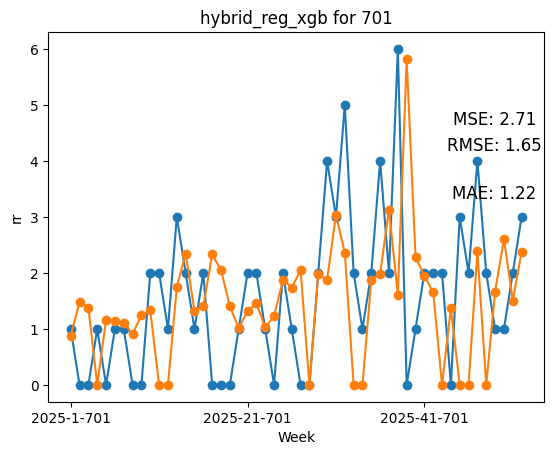

nrmse: 1.04
MSE test: 2.711
RMSE test: 1.646
RMSE train: 0.46
MSE train: 0.212
H4 for 701 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.75      1.00      0.86        39

    accuracy                           0.75        52
   macro avg       0.38      0.50      0.43        52
weighted avg       0.56      0.75      0.64        52

(52,)
(52, 212)


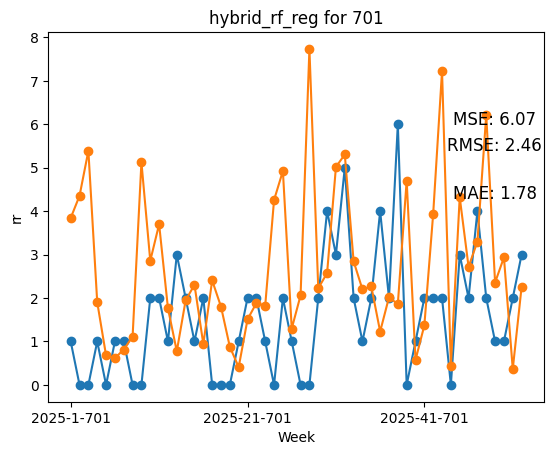

nrmse: 1.56
MSE test: 6.068
RMSE test: 2.463
RMSE train: 3.295
MSE train: 10.854
H5 for 701 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.75      1.00      0.86        39

    accuracy                           0.75        52
   macro avg       0.38      0.50      0.43        52
weighted avg       0.56      0.75      0.64        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


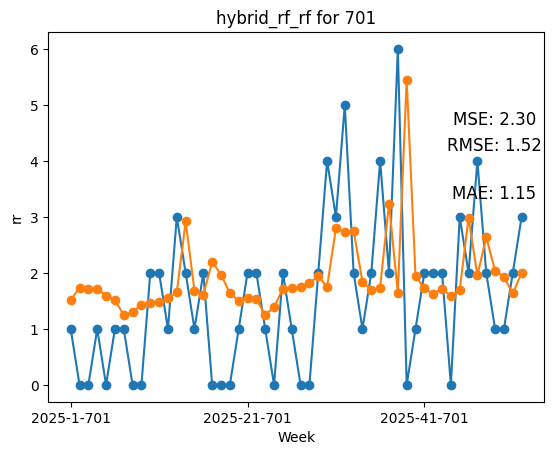

nrmse: 0.96
MSE test: 2.298
RMSE test: 1.516
RMSE train: 2.801
MSE train: 7.846
H6 for 701 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.75      1.00      0.86        39

    accuracy                           0.75        52
   macro avg       0.38      0.50      0.43        52
weighted avg       0.56      0.75      0.64        52

(52,)
(52, 212)


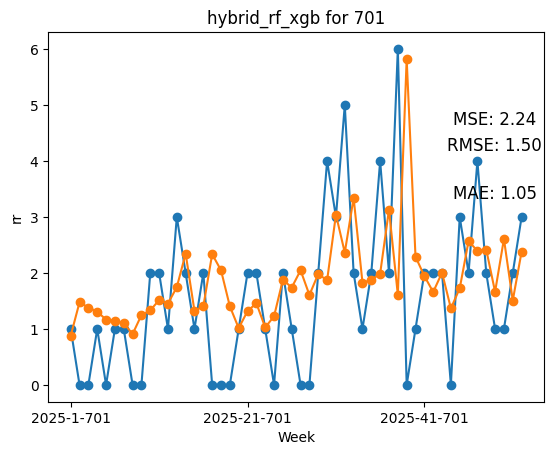

nrmse: 0.95
MSE test: 2.244
RMSE test: 1.498
RMSE train: 0.46
MSE train: 0.212
H7 for 701 at todos
              precision    recall  f1-score   support

           0       0.25      0.08      0.12        13
           1       0.75      0.92      0.83        39

    accuracy                           0.71        52
   macro avg       0.50      0.50      0.47        52
weighted avg       0.62      0.71      0.65        52

(52,)
(52, 212)


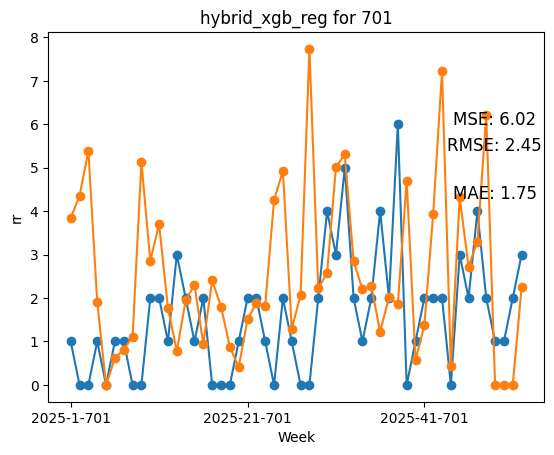

nrmse: 1.56
MSE test: 6.015
RMSE test: 2.453
RMSE train: 3.295
MSE train: 10.854
H8 for 701 at todos
              precision    recall  f1-score   support

           0       0.25      0.08      0.12        13
           1       0.75      0.92      0.83        39

    accuracy                           0.71        52
   macro avg       0.50      0.50      0.47        52
weighted avg       0.62      0.71      0.65        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


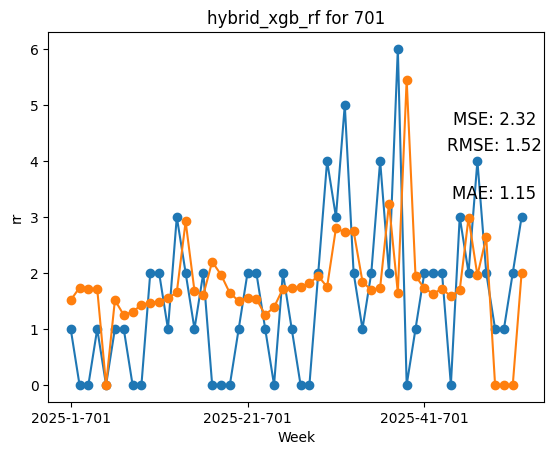

nrmse: 0.97
MSE test: 2.324
RMSE test: 1.525
RMSE train: 2.801
MSE train: 7.846
H9 for 701 at todos
              precision    recall  f1-score   support

           0       0.25      0.08      0.12        13
           1       0.75      0.92      0.83        39

    accuracy                           0.71        52
   macro avg       0.50      0.50      0.47        52
weighted avg       0.62      0.71      0.65        52

(52,)
(52, 212)


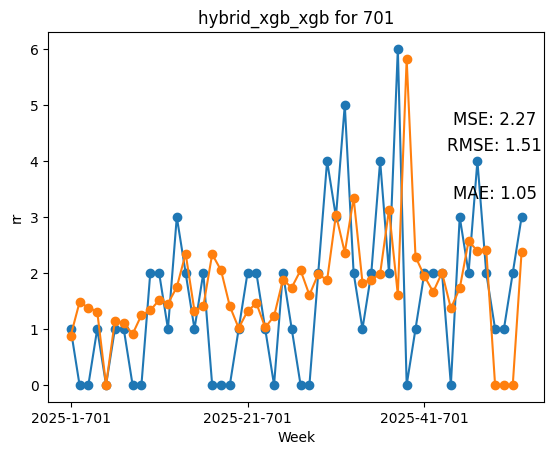

nrmse: 0.96
MSE test: 2.271
RMSE test: 1.507
RMSE train: 0.46
MSE train: 0.212
linear for 603 at todos


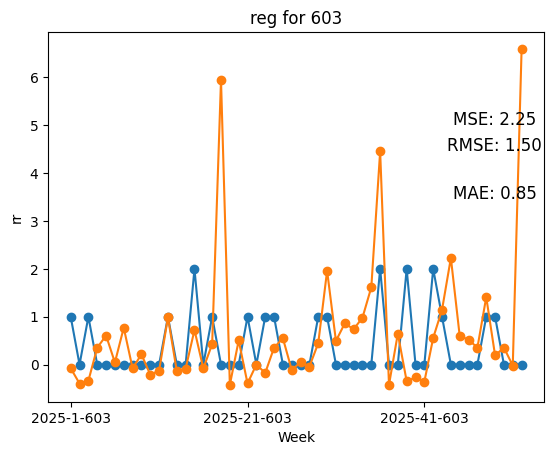

nrmse: 3.9

            RMSE train reg: 14.114
            MSE train reg: 199.194
                


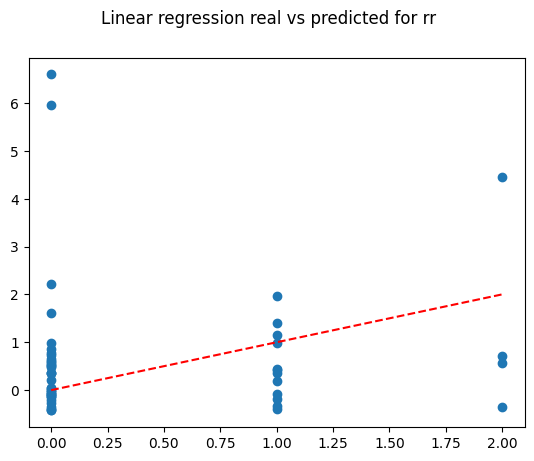

RF for 603 at todos


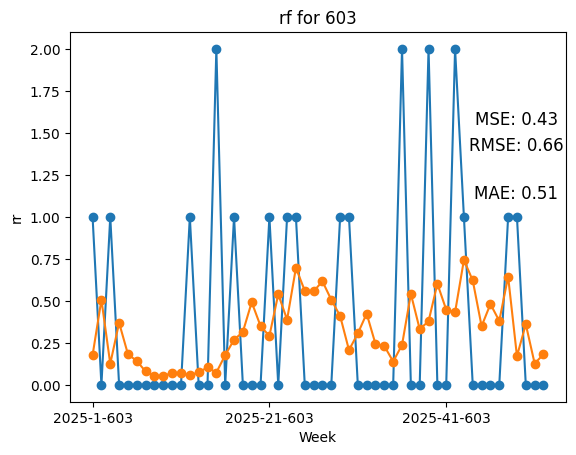

nrmse: 1.71

            RMSE train rf: 4.296
            MSE train rf: 18.455
                


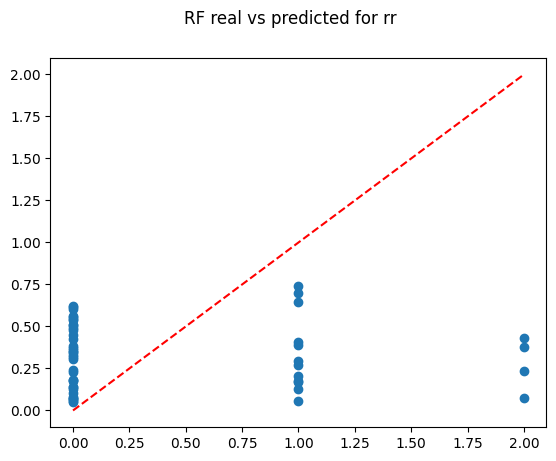

XGB for 603 at todos


KeyboardInterrupt: 

In [4]:
compare_rr(df, "201", "todos")
compare_rr(df, "603", "todos")
compare_rr(df, "501", "todos")
compare_rr(df, "701", "todos")
compare_rr(df, "503", "todos")

linear for 503 at todos


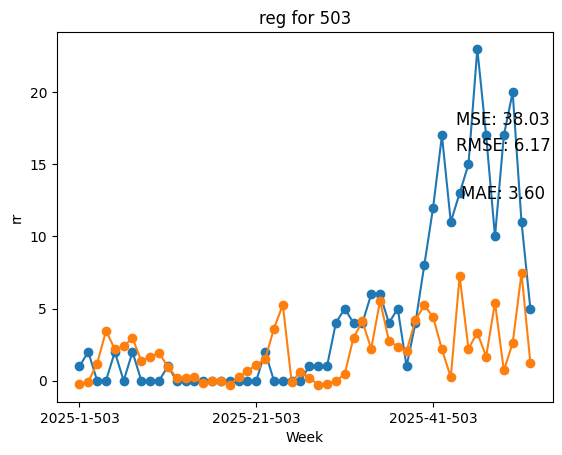

nrmse: 1.36

            RMSE train reg: 7.346
            MSE train reg: 53.97
                


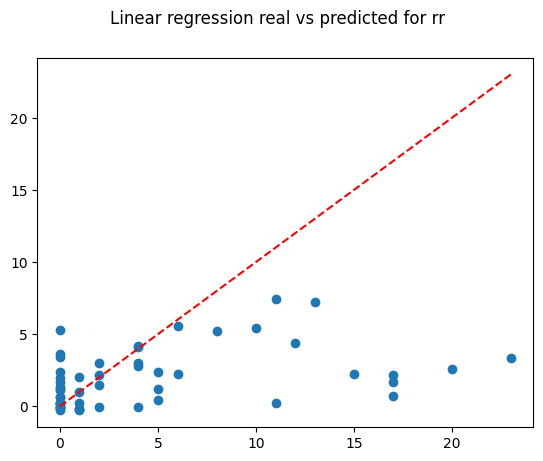

RF for 503 at todos


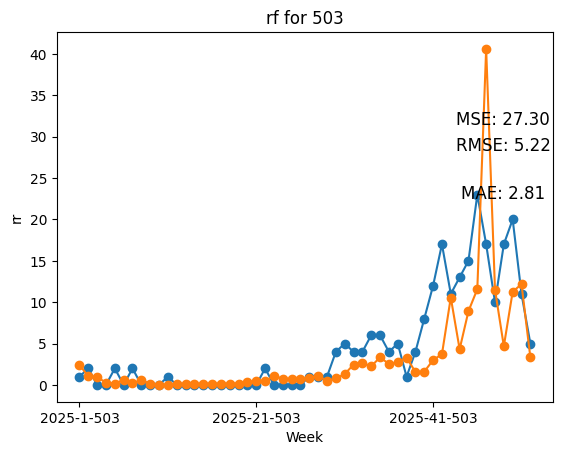

nrmse: 1.16

            RMSE train rf: 3.77
            MSE train rf: 14.212
                


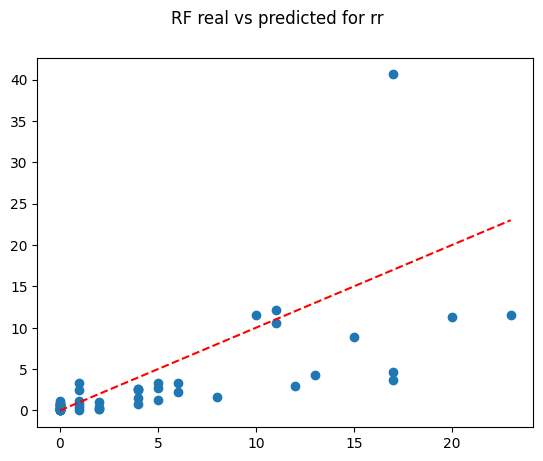

XGB for 503 at todos


c:\Users\nan\OneDrive - Universidad de Costa Rica\cuenta personal\ucr pers\practica profesional\practica dengue\dengue-model\.venv\Lib\site-packages\xgboost\training.py:200: UserWarning: [18:06:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "criterion", "n_estimator" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


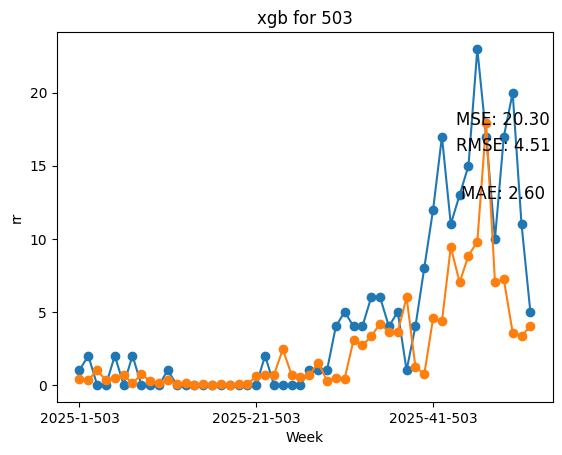

nrmse: 1.0

            RMSE train xgb: 1.105
            MSE train xgb: 1.221
                


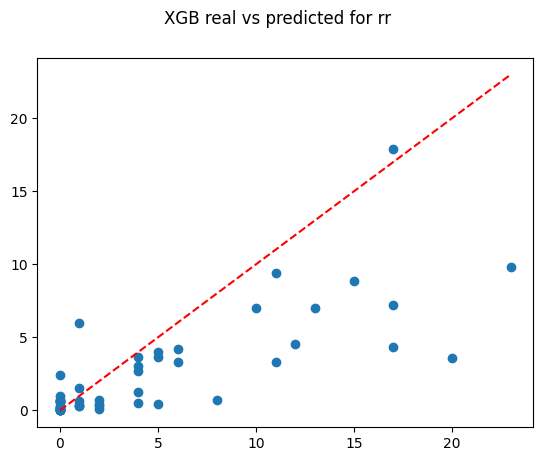

H1 for 503 at todos
              precision    recall  f1-score   support

           0       0.68      0.65      0.67        20
           1       0.79      0.81      0.80        32

    accuracy                           0.75        52
   macro avg       0.74      0.73      0.73        52
weighted avg       0.75      0.75      0.75        52

(52,)
(52, 212)


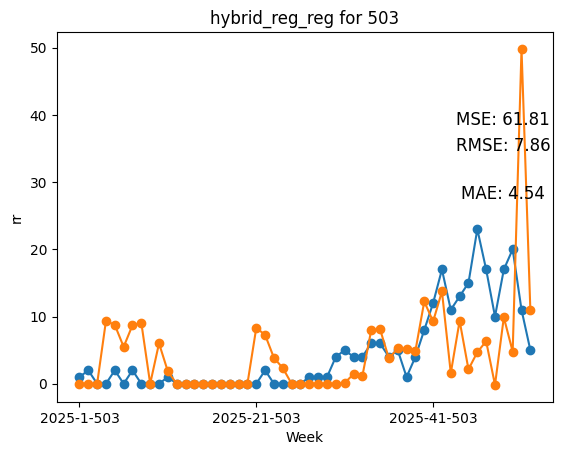

nrmse: 1.74
MSE test: 61.808
RMSE test: 7.862
RMSE train: 1.559
MSE train: 2.429
H2 for 503 at todos
              precision    recall  f1-score   support

           0       0.68      0.65      0.67        20
           1       0.79      0.81      0.80        32

    accuracy                           0.75        52
   macro avg       0.74      0.73      0.73        52
weighted avg       0.75      0.75      0.75        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


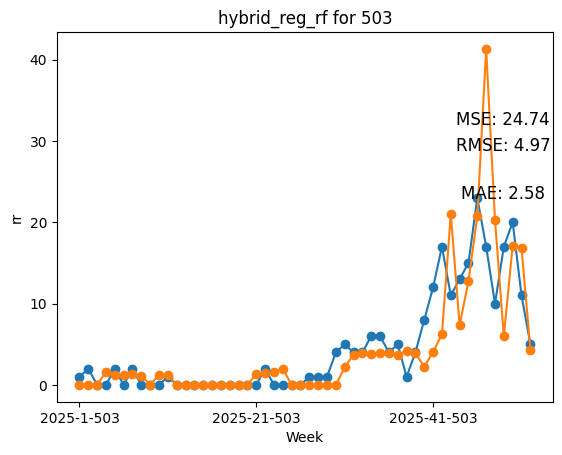

nrmse: 1.1
MSE test: 24.738
RMSE test: 4.974
RMSE train: 4.602
MSE train: 21.176
H3 for 503 at todos
              precision    recall  f1-score   support

           0       0.68      0.65      0.67        20
           1       0.79      0.81      0.80        32

    accuracy                           0.75        52
   macro avg       0.74      0.73      0.73        52
weighted avg       0.75      0.75      0.75        52

(52,)
(52, 212)


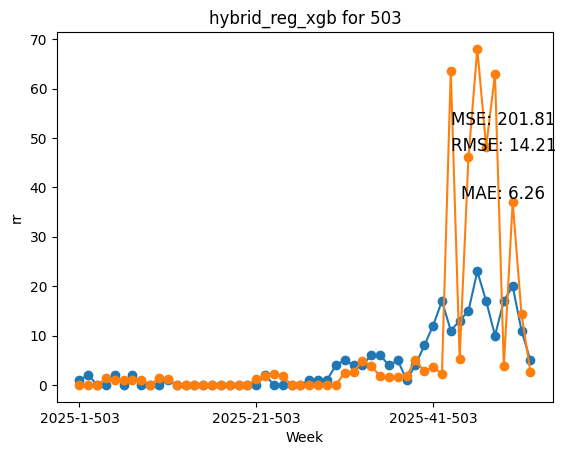

nrmse: 3.14
MSE test: 201.806
RMSE test: 14.206
RMSE train: 0.367
MSE train: 0.134
H4 for 503 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.83      0.75      0.79        20
           1       0.85      0.91      0.88        32

    accuracy                           0.85        52
   macro avg       0.84      0.83      0.83        52
weighted avg       0.85      0.85      0.84        52

(52,)
(52, 212)


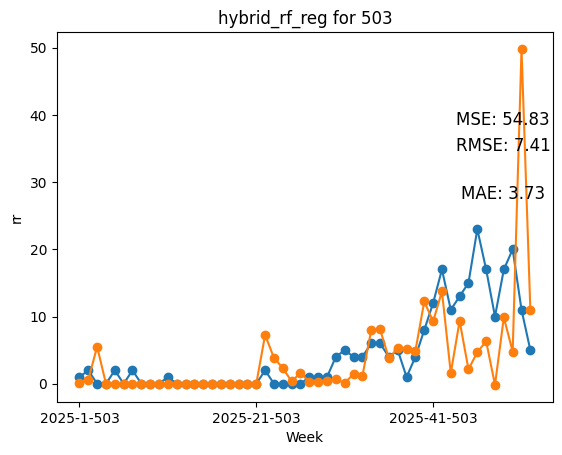

nrmse: 1.64
MSE test: 54.834
RMSE test: 7.405
RMSE train: 1.559
MSE train: 2.429
H5 for 503 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.83      0.75      0.79        20
           1       0.85      0.91      0.88        32

    accuracy                           0.85        52
   macro avg       0.84      0.83      0.83        52
weighted avg       0.85      0.85      0.84        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


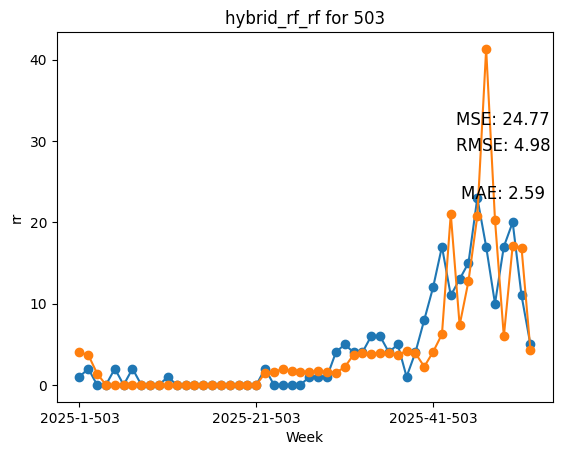

nrmse: 1.1
MSE test: 24.769
RMSE test: 4.977
RMSE train: 4.602
MSE train: 21.176
H6 for 503 at todos
Fitting 1 folds for each of 1 candidates, totalling 1 fits
              precision    recall  f1-score   support

           0       0.83      0.75      0.79        20
           1       0.85      0.91      0.88        32

    accuracy                           0.85        52
   macro avg       0.84      0.83      0.83        52
weighted avg       0.85      0.85      0.84        52

(52,)
(52, 212)


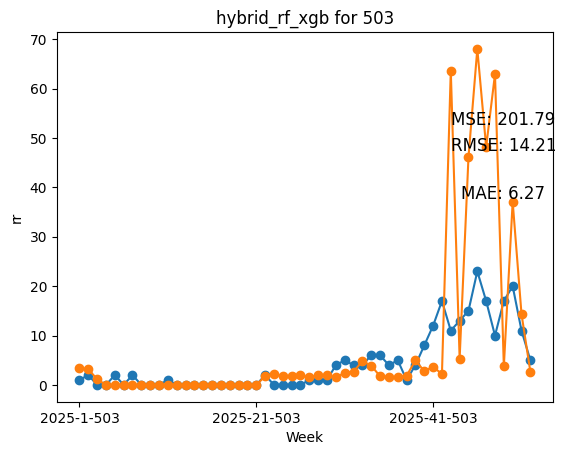

nrmse: 3.14
MSE test: 201.795
RMSE test: 14.205
RMSE train: 0.367
MSE train: 0.134
H7 for 503 at todos
              precision    recall  f1-score   support

           0       0.80      0.60      0.69        20
           1       0.78      0.91      0.84        32

    accuracy                           0.79        52
   macro avg       0.79      0.75      0.76        52
weighted avg       0.79      0.79      0.78        52

(52,)
(52, 212)


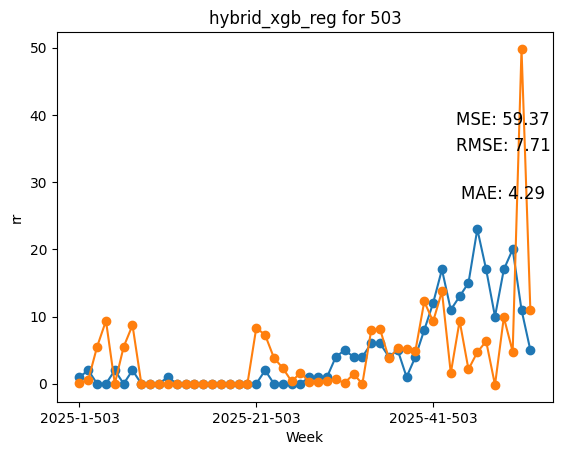

nrmse: 1.71
MSE test: 59.374
RMSE test: 7.705
RMSE train: 1.559
MSE train: 2.429
H8 for 503 at todos
              precision    recall  f1-score   support

           0       0.80      0.60      0.69        20
           1       0.78      0.91      0.84        32

    accuracy                           0.79        52
   macro avg       0.79      0.75      0.76        52
weighted avg       0.79      0.79      0.78        52

Fitting 1 folds for each of 1 candidates, totalling 1 fits
(52,)
(52, 212)


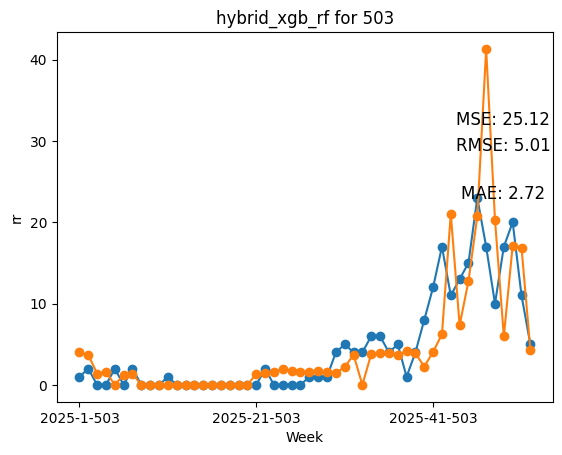

nrmse: 1.11
MSE test: 25.122
RMSE test: 5.012
RMSE train: 4.602
MSE train: 21.176
H9 for 503 at todos
              precision    recall  f1-score   support

           0       0.80      0.60      0.69        20
           1       0.78      0.91      0.84        32

    accuracy                           0.79        52
   macro avg       0.79      0.75      0.76        52
weighted avg       0.79      0.79      0.78        52

(52,)
(52, 212)


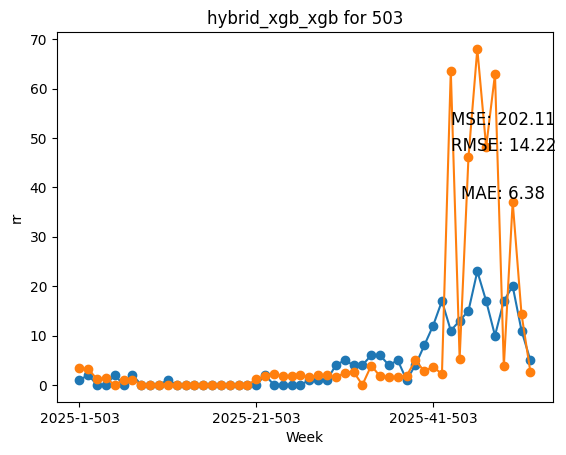

nrmse: 3.15
MSE test: 202.109
RMSE test: 14.216
RMSE train: 0.367
MSE train: 0.134


In [5]:
compare_rr(df, "503", "todos")

# <a id='toc2_'></a>[San Jose](#toc0_)

## <a id='toc2_1_'></a>[Inmediato](#toc0_)

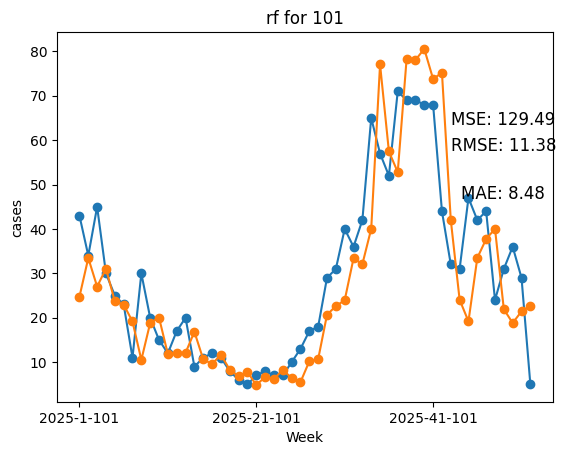

nrmse: 0.39

            RMSE train rf: 12.521
            MSE train rf: 156.766
                


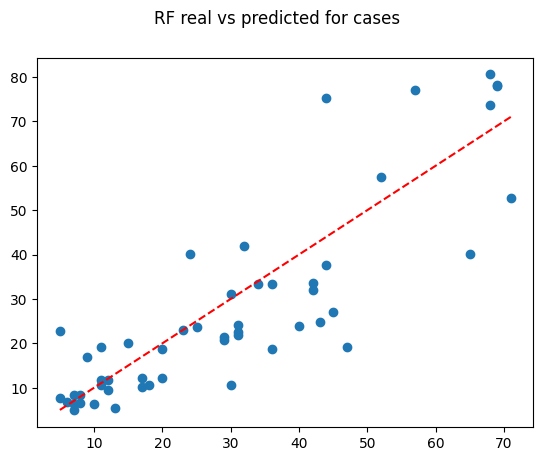

In [3]:
model101 = Model(df[df["week_canton"].str.contains("101")])

X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model101.partition_cases(momento = "inmediato")

reg = model101.rf_reg("cases", "inmediato", "101", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## <a id='toc2_2_'></a>[Mediano](#toc0_)

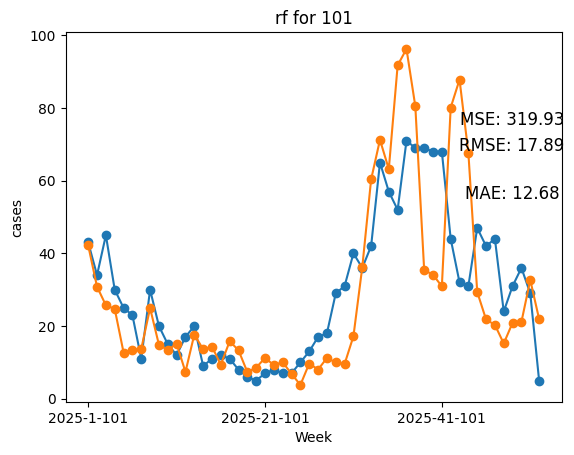

nrmse: 0.61

            RMSE train rf: 14.451
            MSE train rf: 208.828
                


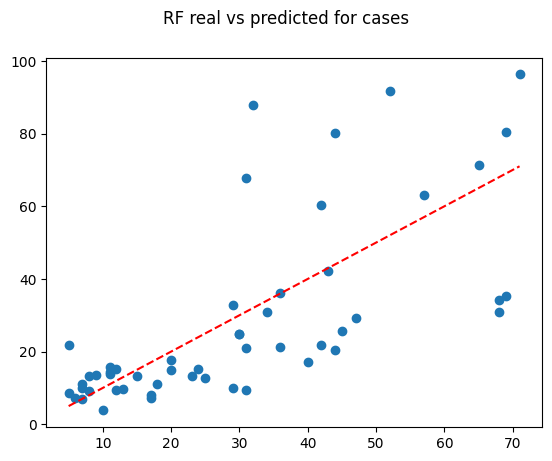

In [4]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model101.partition_cases(momento = "mediano")

reg = model101.rf_reg("cases", "mediano", "101", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## <a id='toc2_3_'></a>[Todos](#toc0_)

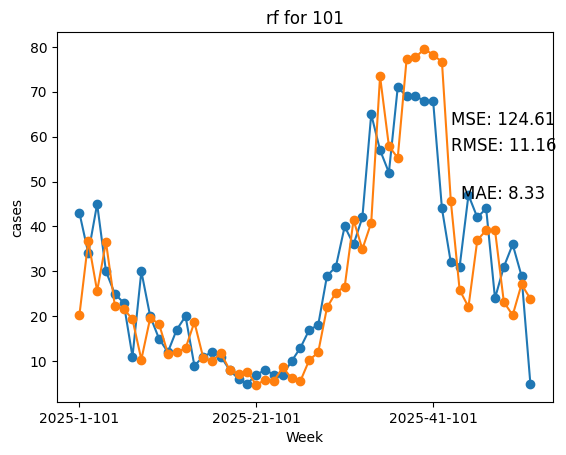

nrmse: 0.38

            RMSE train rf: 14.323
            MSE train rf: 205.141
                


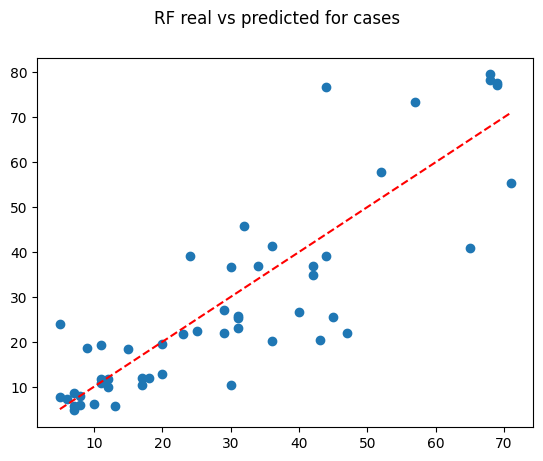

In [5]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model101.partition_cases(momento = "todos")

reg = model101.rf_reg("cases", "todos", "101", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

# <a id='toc3_'></a>[Alajuelita](#toc0_)

## <a id='toc3_1_'></a>[Inmediato](#toc0_)

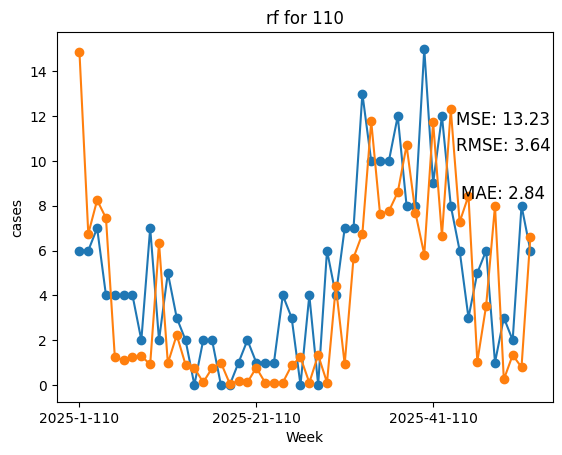

nrmse: 0.74

            RMSE train rf: 3.292
            MSE train rf: 10.839
                


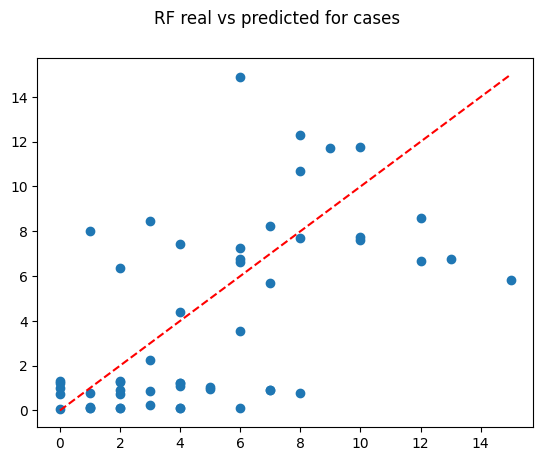

In [6]:
model110 = Model(df[df["week_canton"].str.contains("110")])

X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model110.partition_cases(momento = "inmediato")

reg = model110.rf_reg("cases", "inmediato", "110", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## <a id='toc3_2_'></a>[Mediano](#toc0_)

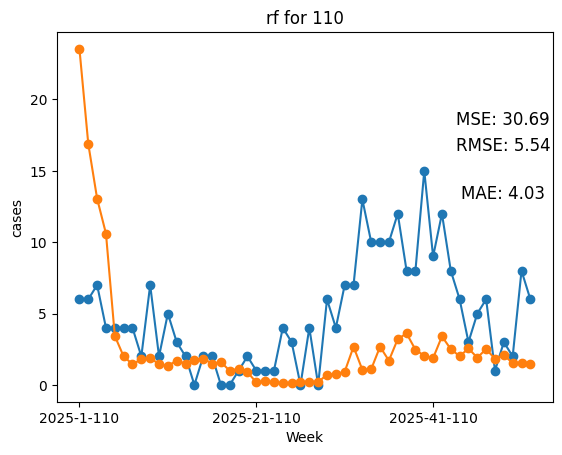

nrmse: 1.13

            RMSE train rf: 4.119
            MSE train rf: 16.965
                


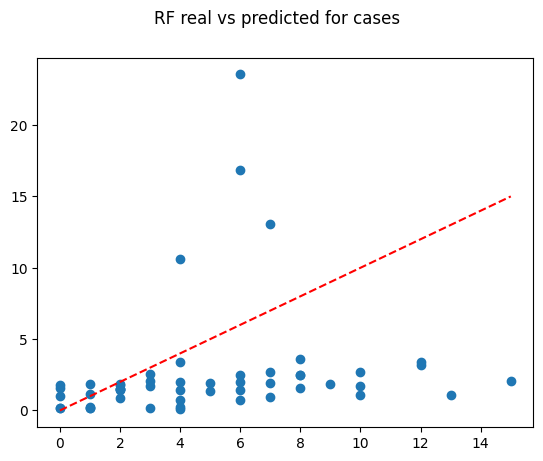

In [7]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model110.partition_cases(momento = "mediano")

reg = model110.rf_reg("cases", "mediano", "110", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## <a id='toc3_3_'></a>[Todos](#toc0_)

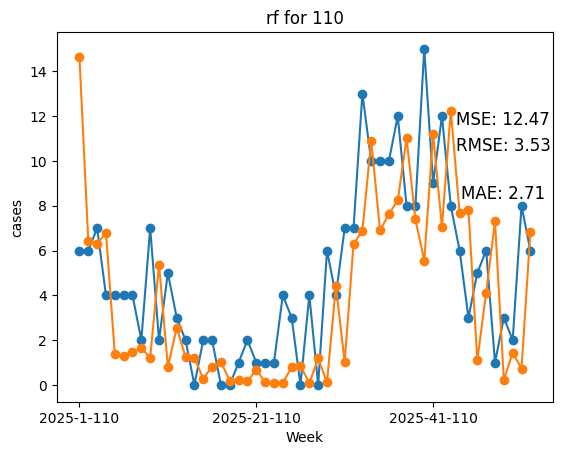

nrmse: 0.72

            RMSE train rf: 3.26
            MSE train rf: 10.63
                


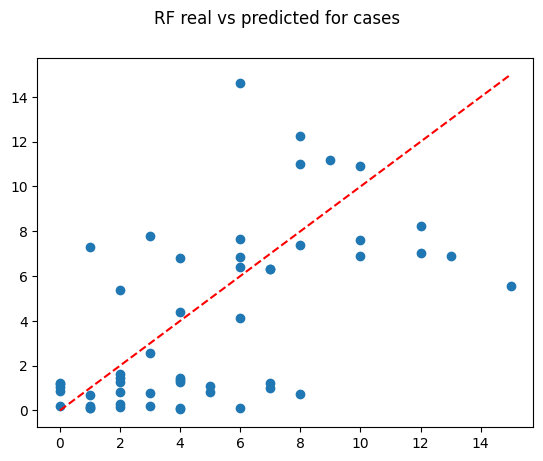

In [8]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model110.partition_cases(momento = "todos")

reg = model110.rf_reg("cases", "todos", "110", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

# <a id='toc4_'></a>[Desamparados](#toc0_)

## <a id='toc4_1_'></a>[Inmediato](#toc0_)

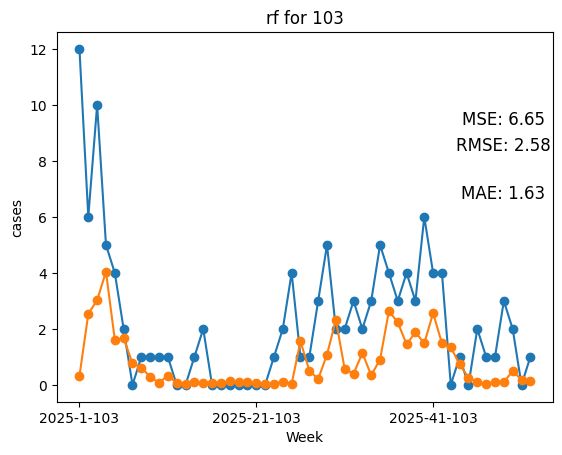

nrmse: 1.13

            RMSE train rf: 5.157
            MSE train rf: 26.593
                


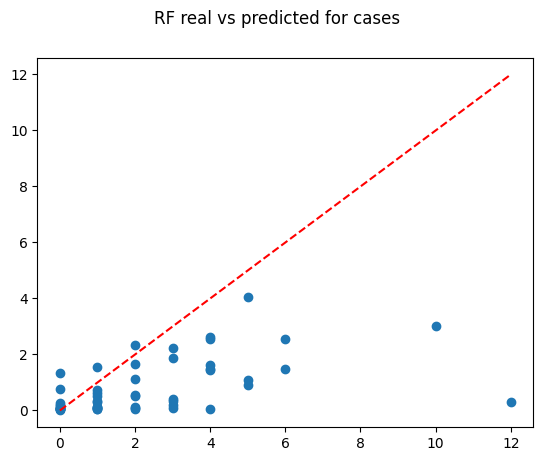

In [9]:
model103 = Model(df[df["week_canton"].str.contains("103")])

X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model103.partition_cases(momento = "inmediato")

reg = model103.rf_reg("cases", "inmediato", "103", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## <a id='toc4_2_'></a>[Mediano](#toc0_)

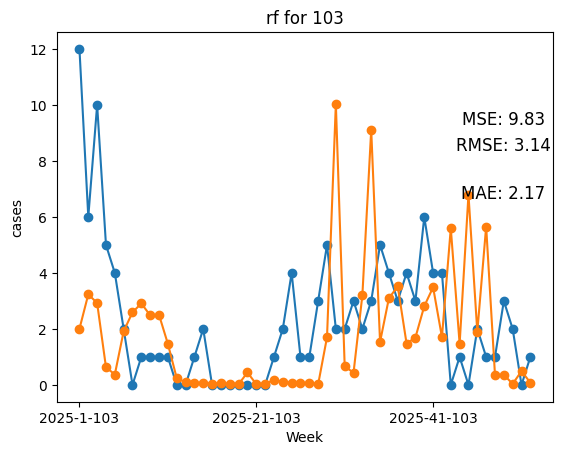

nrmse: 1.37

            RMSE train rf: 6.289
            MSE train rf: 39.557
                


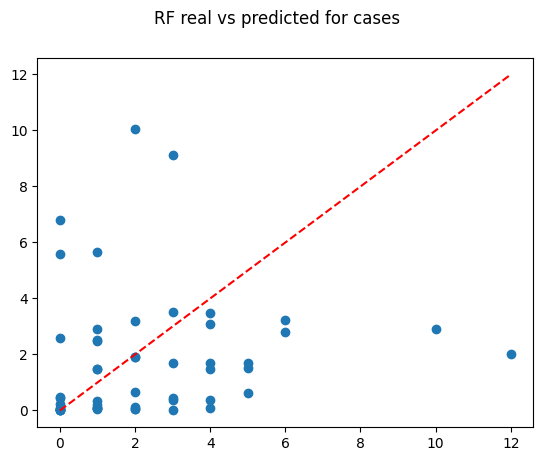

In [10]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model103.partition_cases(momento = "mediano")

reg = model103.rf_reg("cases", "mediano", "103", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## <a id='toc4_3_'></a>[Todos](#toc0_)

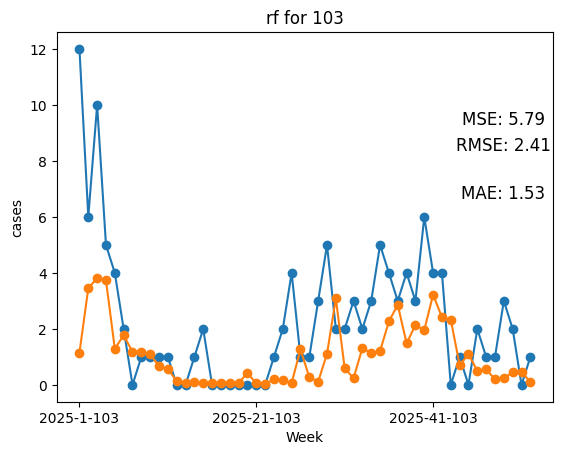

nrmse: 1.05

            RMSE train rf: 4.761
            MSE train rf: 22.664
                


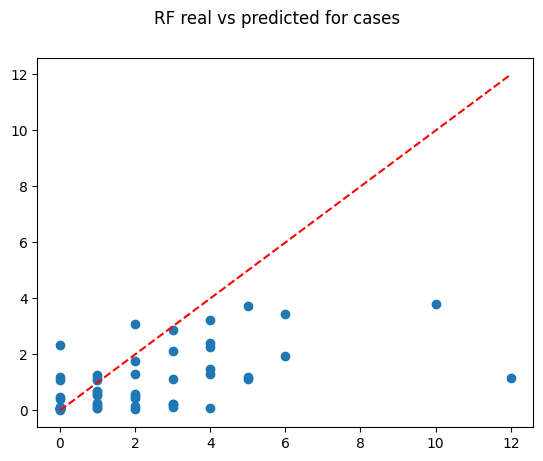

In [11]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model103.partition_cases(momento = "todos")

reg = model103.rf_reg("cases", "todos", "103", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

# <a id='toc5_'></a>[Santa Ana](#toc0_)

## <a id='toc5_1_'></a>[Inmediato](#toc0_)

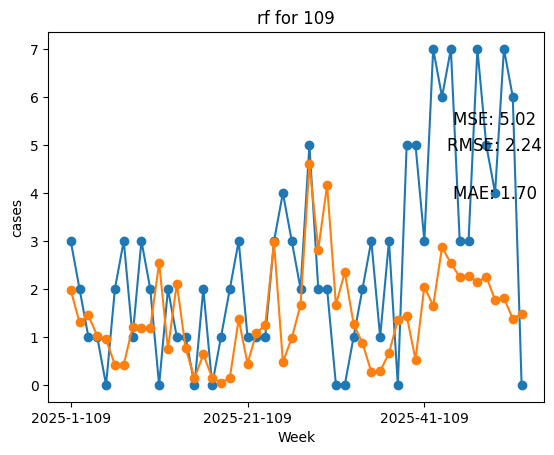

nrmse: 0.88

            RMSE train rf: 5.475
            MSE train rf: 29.974
                


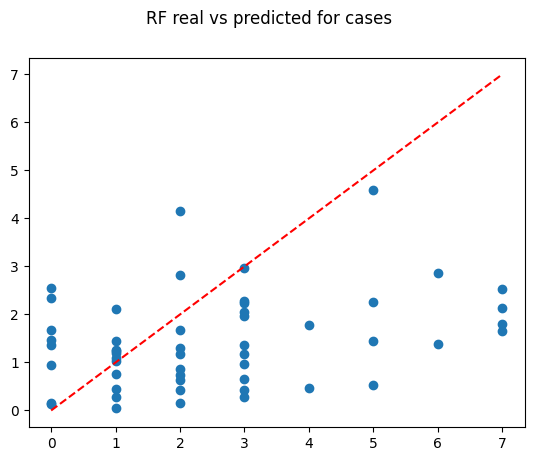

In [12]:
model109 = Model(df[df["week_canton"].str.contains("109")])

X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model109.partition_cases(momento = "inmediato")

reg = model109.rf_reg("cases", "inmediato", "109", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## <a id='toc5_2_'></a>[Mediano](#toc0_)

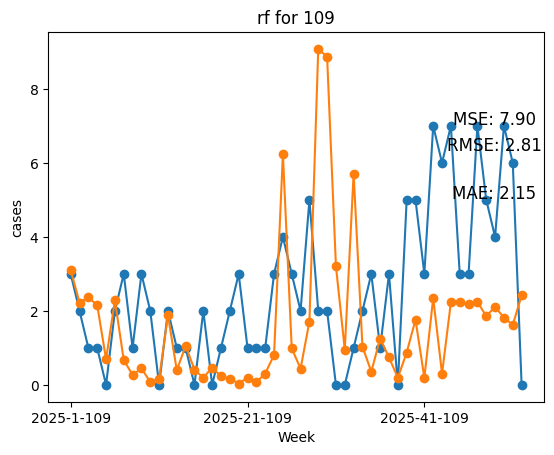

nrmse: 1.11

            RMSE train rf: 6.647
            MSE train rf: 44.188
                


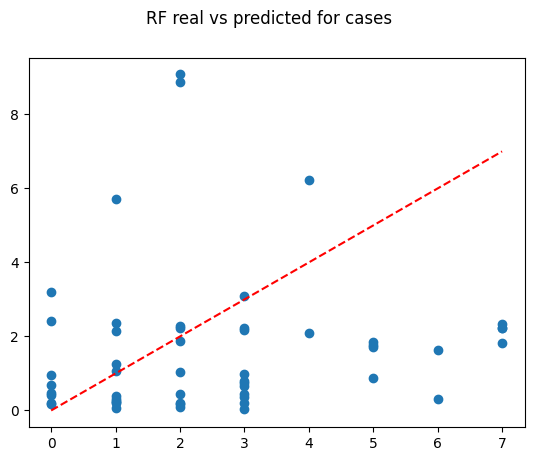

In [13]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model109.partition_cases(momento = "mediano")

reg = model109.rf_reg("cases", "mediano", "109", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## <a id='toc5_3_'></a>[Todos](#toc0_)

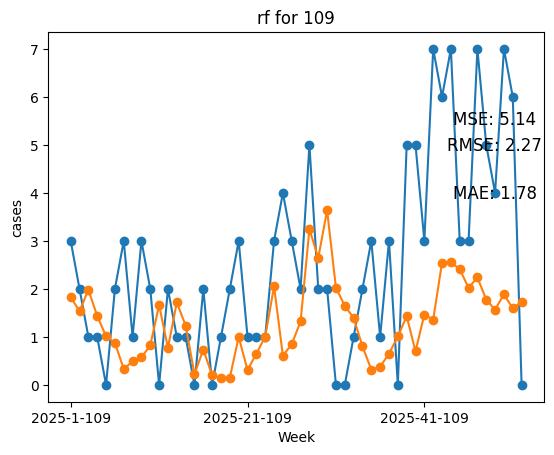

nrmse: 0.89

            RMSE train rf: 4.975
            MSE train rf: 24.749
                


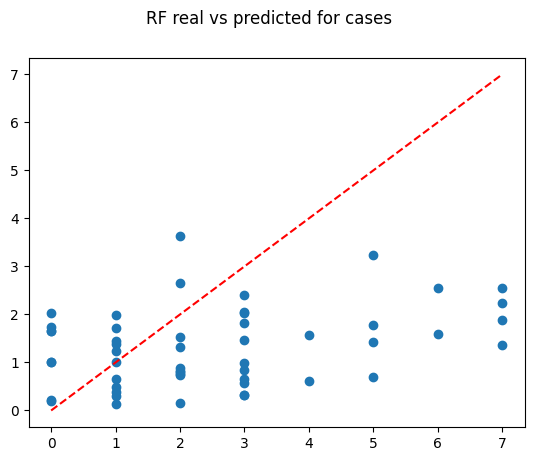

In [14]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon = model109.partition_cases(momento = "todos")

reg = model109.rf_reg("cases", "todos", "109", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

# <a id='toc6_'></a>[Alajuela](#toc0_)

## Inmediato

In [15]:
model201 = Model(df[df["week_canton"].str.contains("201")])

In [17]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model201.partition_rr(momento = "inmediato")

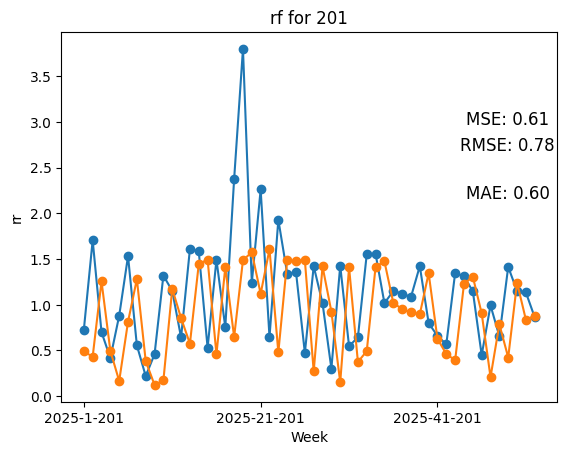

nrmse: 0.69

            RMSE train rf: 0.347
            MSE train rf: 0.121
                


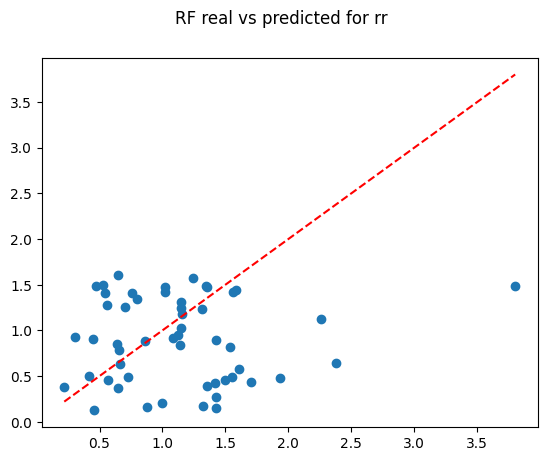

In [18]:
reg = model201.rf_reg("rr", "inmediato", "201", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon )

## Mediano

In [19]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model201.partition_rr(momento = "mediano")

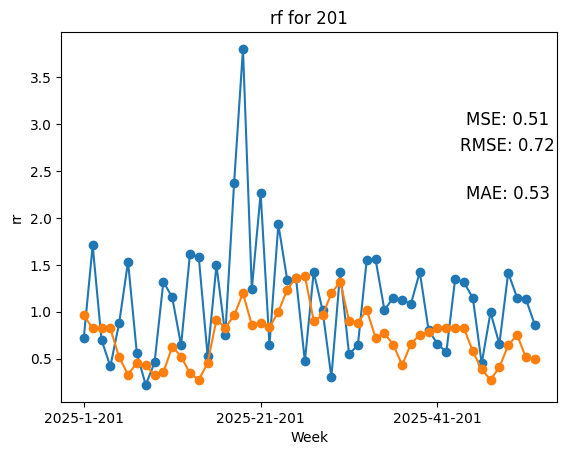

nrmse: 0.64

            RMSE train rf: 0.494
            MSE train rf: 0.244
                


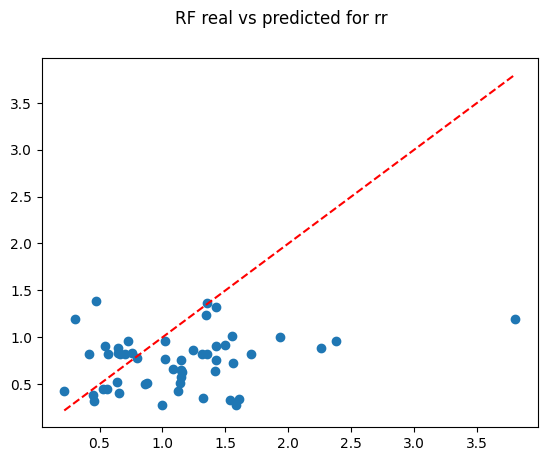

In [20]:
reg = model201.rf_reg("rr", "mediano", "201", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon )

## Todos

In [21]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model201.partition_rr(momento = "todos")

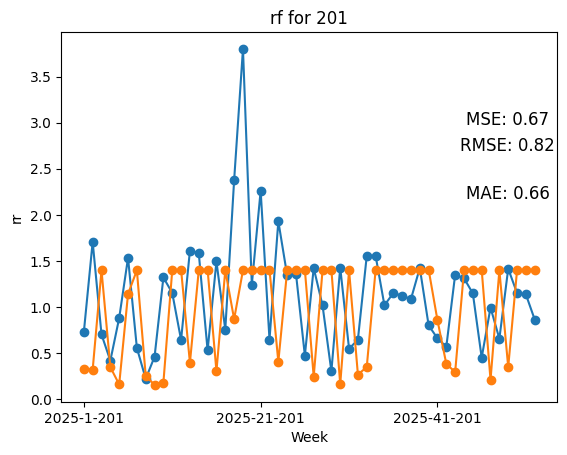

nrmse: 0.73

            RMSE train rf: 0.455
            MSE train rf: 0.207
                


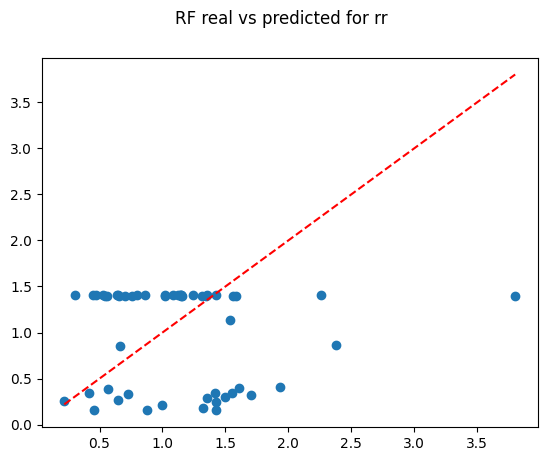

In [22]:
reg = model201.rf_reg("rr", "todos", "201", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon )

# <a id='toc7_'></a>[Buenos Aires](#toc0_)

## Inmediato

In [24]:
model603 = Model(df[df["week_canton"].str.contains("603")])

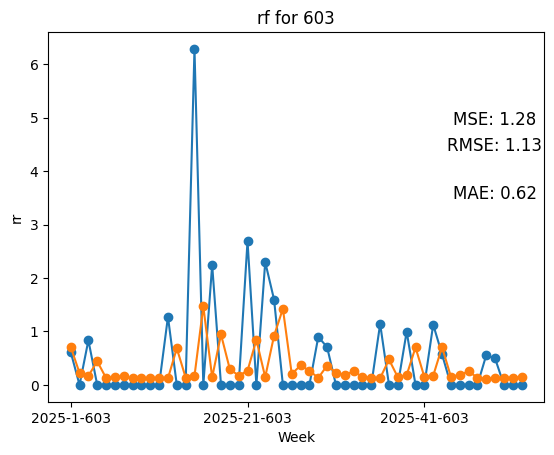

nrmse: 2.41

            RMSE train rf: 1.83
            MSE train rf: 3.347
                


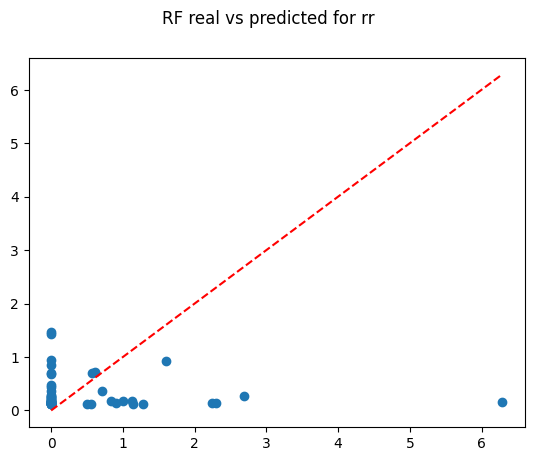

In [25]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model603.partition_rr(momento = "inmediato")

reg = model603.rf_reg("rr", "inmediato", "603", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon )

## Mediano

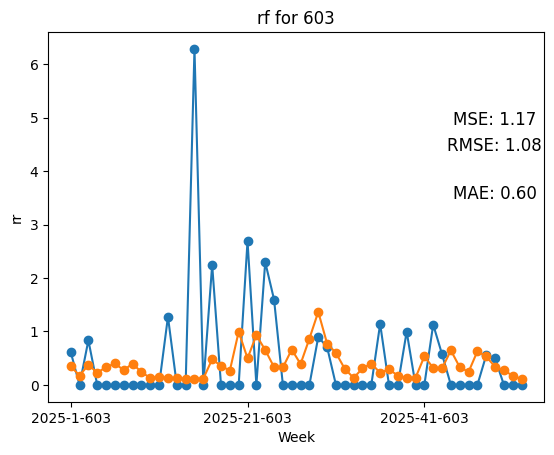

nrmse: 2.31

            RMSE train rf: 2.126
            MSE train rf: 4.52
                


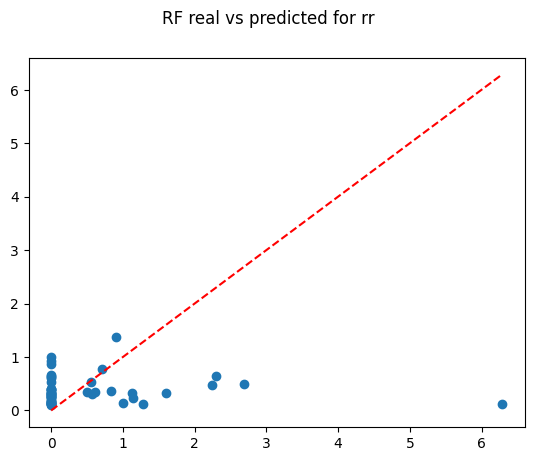

In [26]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model603.partition_rr(momento = "mediano")

reg = model603.rf_reg("rr", "mediano", "603", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon )

## Todos

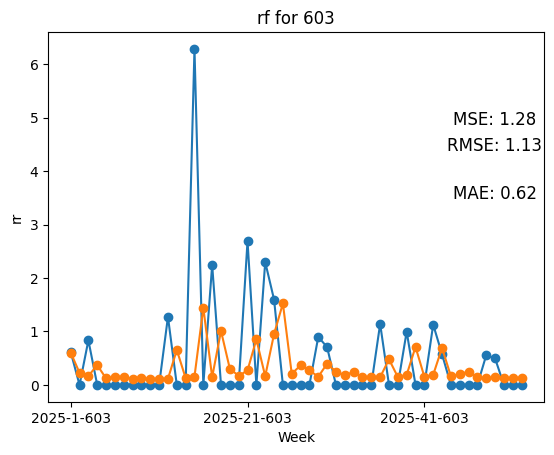

nrmse: 2.42

            RMSE train rf: 1.832
            MSE train rf: 3.358
                


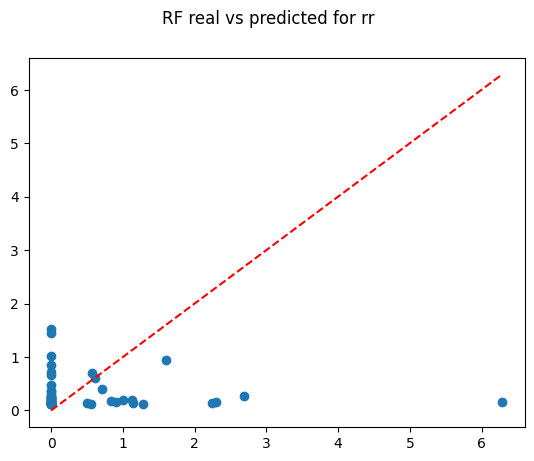

In [27]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model603.partition_rr(momento = "todos")

reg = model603.rf_reg("rr", "todos", "603", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon )

# <a id='toc8_'></a>[Liberia](#toc0_)

## Inmediato

In [3]:
model501 = Model(df[df["week_canton"].str.contains("501")])

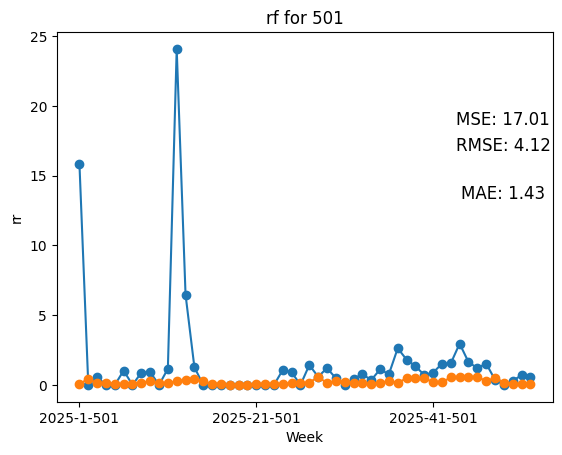

nrmse: 2.65

            RMSE train rf: 0.241
            MSE train rf: 0.058
                


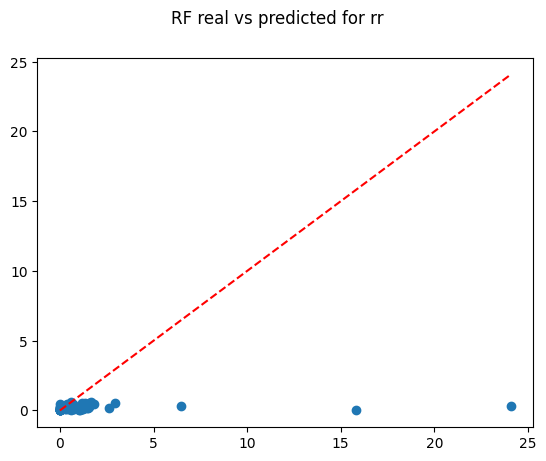

In [30]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model501.partition_rr(momento = "inmediato")

reg = model501.rf_reg("rr", "inmediato", "501", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon )

## Mediano

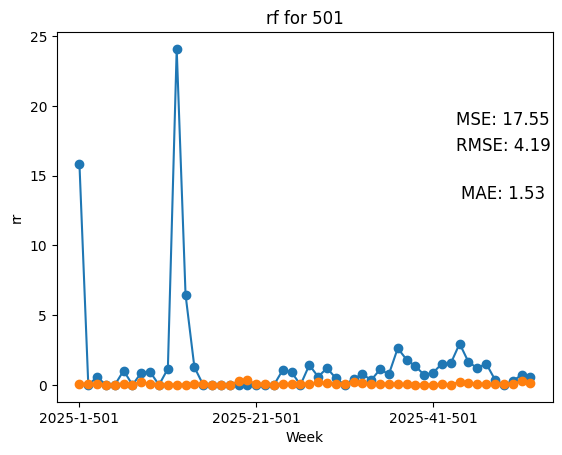

nrmse: 2.69

            RMSE train rf: 0.274
            MSE train rf: 0.075
                


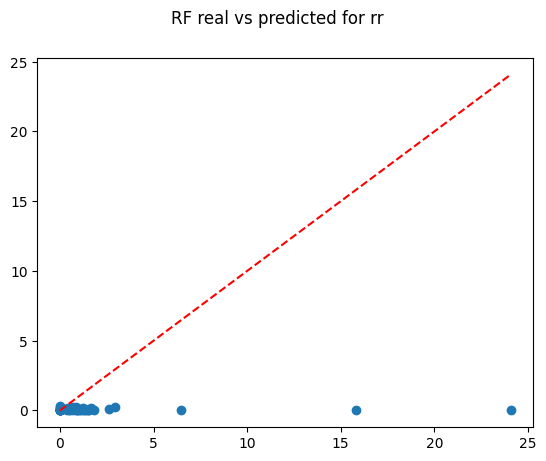

In [4]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model501.partition_rr(momento = "mediano")

reg = model501.rf_reg("rr", "mediano", "501", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon )

## Todos

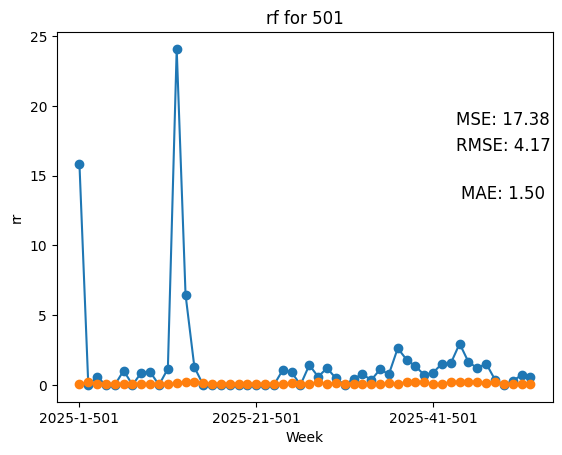

nrmse: 2.67

            RMSE train rf: 0.428
            MSE train rf: 0.183
                


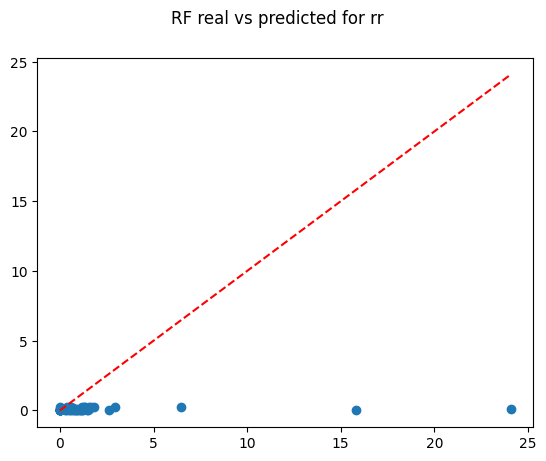

In [5]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model501.partition_rr(momento = "todos")

reg = model501.rf_reg("rr", "todos", "501", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon )

# <a id='toc9_'></a>[Limon](#toc0_)

## Inmediato

In [6]:
model701 = Model(df[df["week_canton"].str.contains("701")])

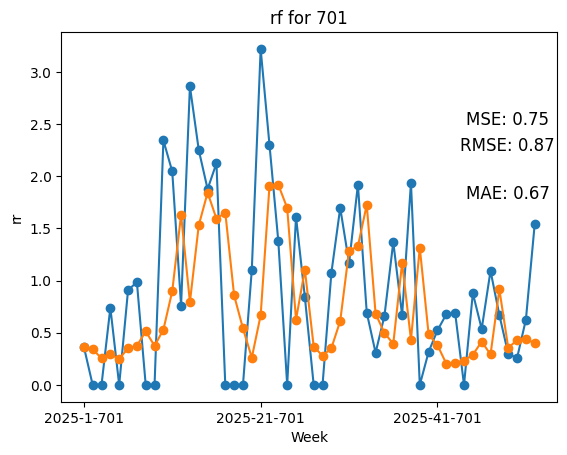

nrmse: 0.95

            RMSE train rf: 0.993
            MSE train rf: 0.987
                


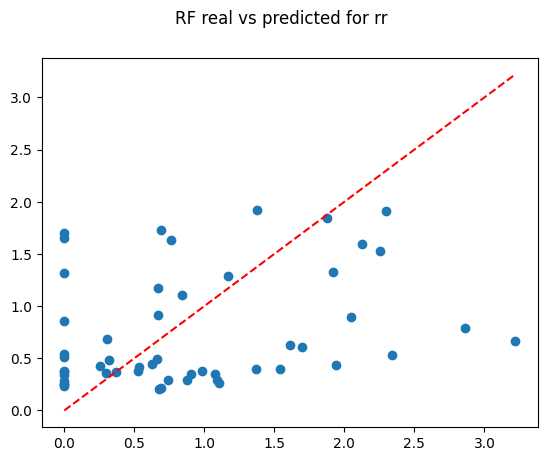

In [7]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model701.partition_rr(momento = "inmediato")

reg = model701.rf_reg("rr", "inmediato", "701", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## Mediano

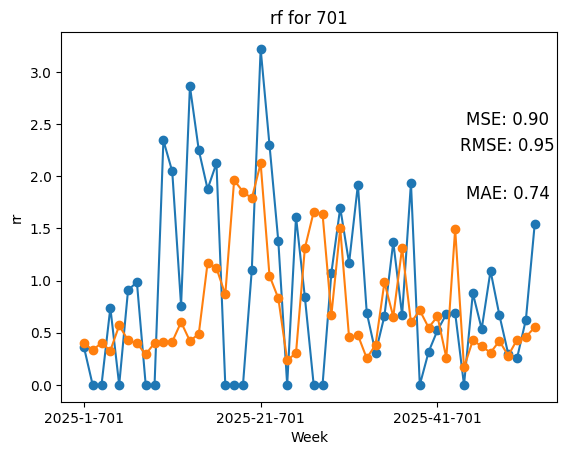

nrmse: 1.04

            RMSE train rf: 1.122
            MSE train rf: 1.259
                


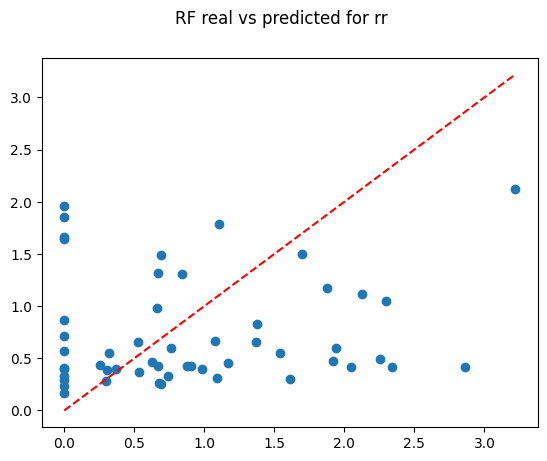

In [8]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model701.partition_rr(momento = "mediano")

reg = model701.rf_reg("rr", "mediano", "701", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## Todos

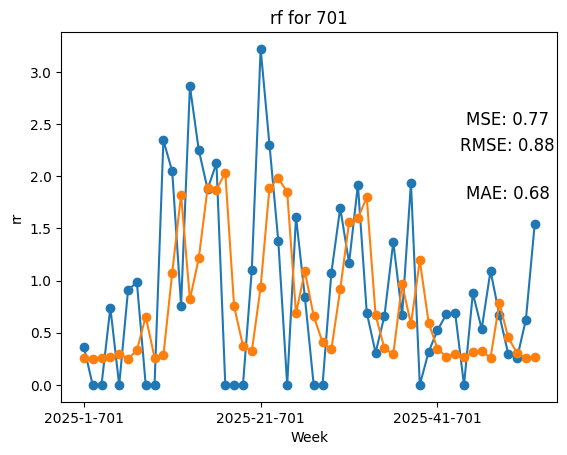

nrmse: 0.97

            RMSE train rf: 1.368
            MSE train rf: 1.87
                


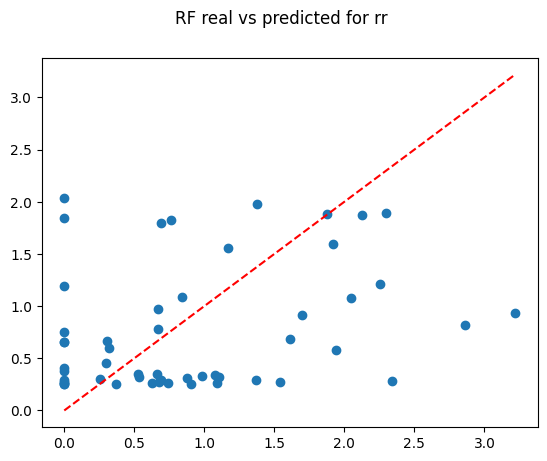

In [9]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model701.partition_rr(momento = "todos")

reg = model701.rf_reg("rr", "todos", "701", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

# <a id='toc10_'></a>[Santa Cruz](#toc0_)

In [8]:
model503 = Model(df[df["week_canton"].str.contains("503")])

## Inmediato

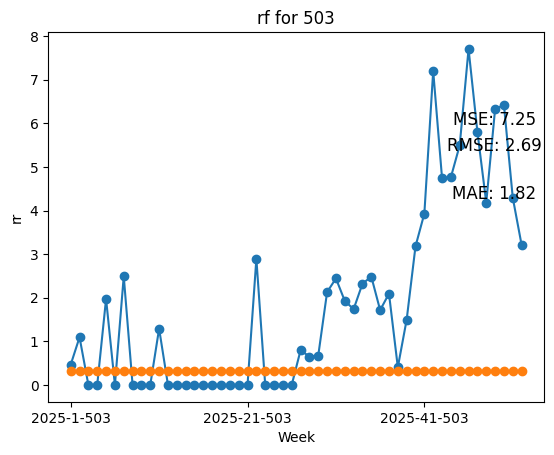

nrmse: 1.42

            RMSE train rf: 1.058
            MSE train rf: 1.12
                


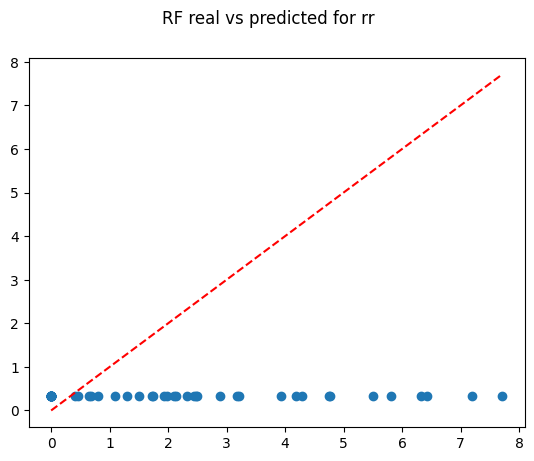

In [10]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model503.partition_rr(momento = "inmediato")

reg = model503.rf_reg("rr", "inmediato", "503", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## Mediano

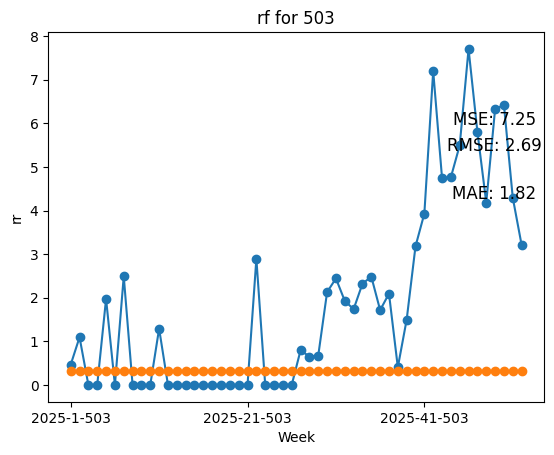

nrmse: 1.42

            RMSE train rf: 1.058
            MSE train rf: 1.12
                


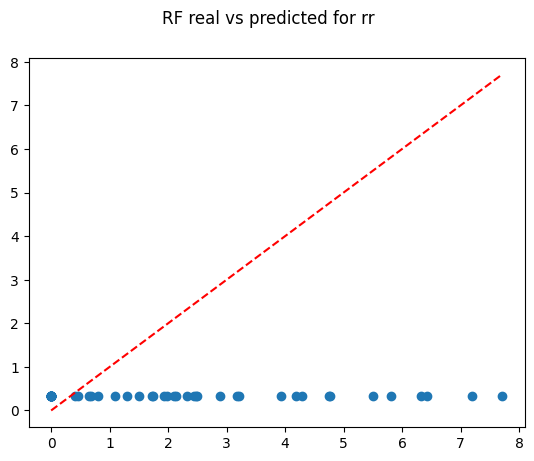

In [12]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model503.partition_rr(momento = "mediano")

reg = model503.rf_reg("rr", "mediano", "503", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)

## Todos

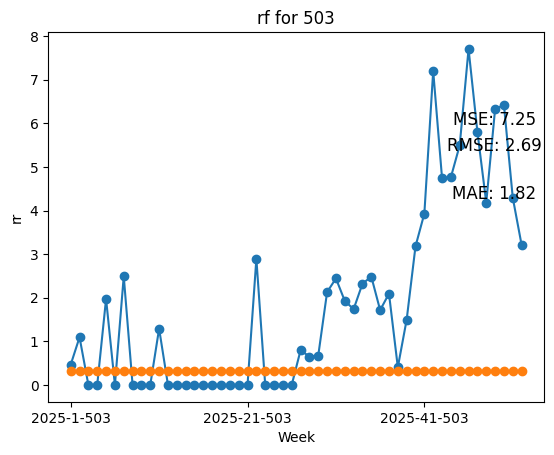

nrmse: 1.42

            RMSE train rf: 1.058
            MSE train rf: 1.12
                


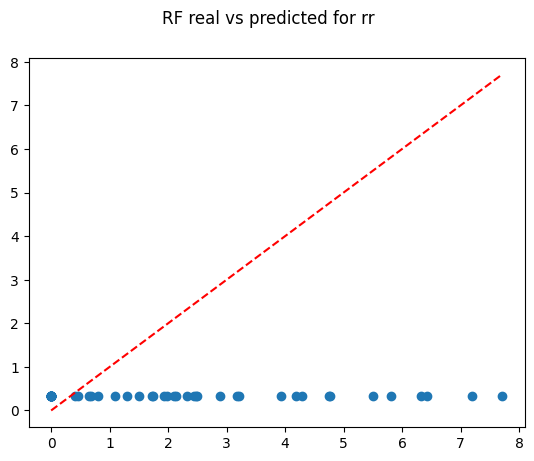

In [13]:
X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon  = model503.partition_rr(momento = "todos")

reg = model503.rf_reg("rr", "todos", "503", X_combined, y_combined, X_test, y_test, X_combined_scaled, X_test_scaled, test, pds, epsilon)